In [31]:
import pandas as pd
import numpy as np
import os
import itertools
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from prophet import Prophet
from neuralprophet import NeuralProphet, set_log_level
from prophet.diagnostics import cross_validation, performance_metrics
from prophet.make_holidays import make_holidays_df
from sklearn.model_selection import ParameterGrid
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import MinMaxScaler

## Loading the bike share suuply & demand data exported from the prep_data notebook.

We would first load the bikeshare demand and supply and temprature data and fill in the missing data using forward and backward fill. Only a few of the clusters have a few missing dates from Juanaury 2021 to February 2024. 

In [82]:
df = pd.read_csv(os.path.join('prepared_data','model.csv'))

In [83]:
start_date = '2021-01-01'
end_date = '2024-02-29'

all_dates = pd.date_range(start=start_date, end=end_date)
all_clusters = df['cluster_id'].unique()
index = pd.MultiIndex.from_product([all_clusters, all_dates], names=['cluster_id', 'date'])
complete_df = pd.DataFrame(index=index).reset_index()
df['date'] = pd.to_datetime(df['date'])
df_full = complete_df.merge(df, on=['cluster_id', 'date'], how='left')
df_full.update(df_full.groupby('cluster_id').ffill())
df_full.update(df_full.groupby('cluster_id').bfill())

df = df_full.copy()

# Modelling

To use the bike share data for comparing the Prophet,Neural Prophet and the ensemble of the two models, the following steps were taken:

1. Data Preparation and Model Tuning: The aggregate demand across all 30 clusters, alongside average temperature as an additional predictor, served as the foundation for model tuning. This process incorporated cross-validation techniques to optimize the hyperparameters of both models. Importantly, holiday data was integrated to address the impact of exceptional events on demand.

2. Data Segmentation for Model Training and Evaluation: The dataset was stratified into training and testing segments based on an 80:20 ratio. Specifically, the training set spanned from January 2021 to June 2023, while the testing set covered July 2023 through February 2024. This temporal division ensured a comprehensive evaluation of the models under different conditions.

3. Model Training and Prediction: Each model underwent training using the designated training data, focusing separately on demand and supply dynamics within each cluster. Subsequently, predictions for the testing period were generated. These forecasts were then juxtaposed with actual observations to derive key performance indicators, including Mean Absolute Error (MAE), Root Mean Square Error (RMSE), and Mean Absolute Percentage Error (MAPE) for each model across both demand and supply metrics.

4. Comparative Analysis and Ensemble Modeling: Beyond evaluating individual metrics, the study also focused on collating predictions from both Prophet and Neural Prophet models. This approach facilitated a direct comparison between the models and laid the groundwork for their ensemble, aiming to leverage the strengths of each to improve overall predictive accuracy.

## Prophet

### Prophet Global Hyper Parameter Tuning Using Cross Validation

In [3]:
prophet_daily_data = df.groupby('date').agg({'demand':'sum','temperature':'mean'}).reset_index()
prophet_daily_data['ds'] = pd.to_datetime(prophet_daily_data['date'])
prophet_daily_data.rename(columns={'demand': 'y'}, inplace=True)

In [16]:
us_holidays = make_holidays_df(year_list=prophet_daily_data['ds'].dt.year.unique(), country='US', province='CA')
results = []

param_grid = {
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
    'holidays_prior_scale': [0.01,0.1, 1.0, 10.0],
    'seasonality_mode': ['additive', 'multiplicative']
}

for params in ParameterGrid(param_grid):
    m = Prophet(
        holidays=us_holidays,
        changepoint_prior_scale=params['changepoint_prior_scale'],
        seasonality_prior_scale=params['seasonality_prior_scale'],
        holidays_prior_scale=params['holidays_prior_scale'],
        seasonality_mode=params['seasonality_mode']
    )
    m.add_regressor('temperature')
    m.fit(prophet_daily_data[['ds', 'y', 'temperature']])
    
    # Perform cross-validation
    df_cv = cross_validation(m, initial='730 days', period='180 days', horizon='365 days')
    df_p = performance_metrics(df_cv)
    
    results.append({'params': params, 'mae': df_p['mae'].mean()})

results_df = pd.DataFrame(results)

results_df = results_df.sort_values(by='mae').reset_index(drop=True)

In [ ]:
# results_df.loc[0]['params']
# Best chosen hyper parameters:
# changepoint_prior_scale=0.01,
# seasonality_prior_scale=1.0,
# holidays_prior_scale=1.0,
# seasonality_mode='additive' 

### Prophet Evaluation

00:20:19 - cmdstanpy - INFO - Chain [1] start processing
00:20:19 - cmdstanpy - INFO - Chain [1] done processing


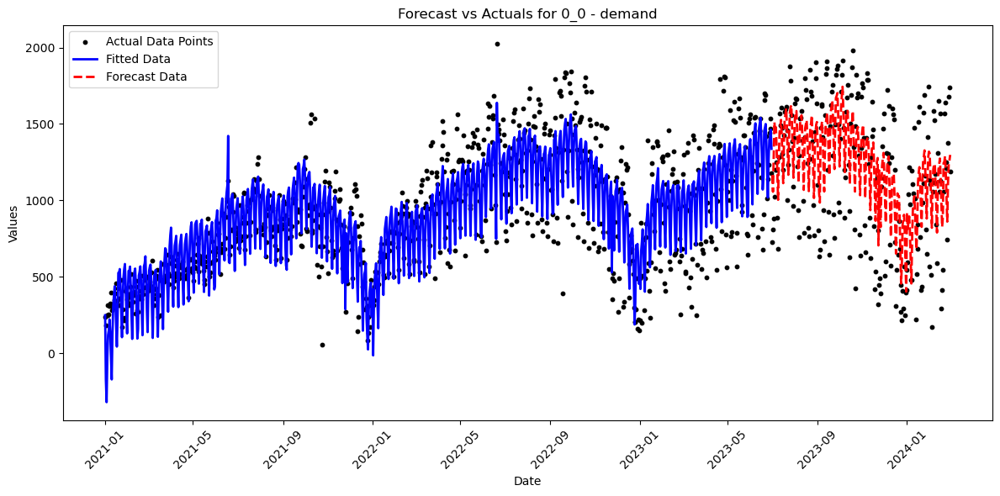

WARNING - (py.warnings._showwarnmsg) - /var/folders/p4/f02y3z810l530mmz7x833j3w0000gn/T/ipykernel_33554/3202840765.py:53: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  prophet_fitted_df  = pd.concat([prophet_fitted_df,

00:20:20 - cmdstanpy - INFO - Chain [1] start processing
00:20:20 - cmdstanpy - INFO - Chain [1] done processing


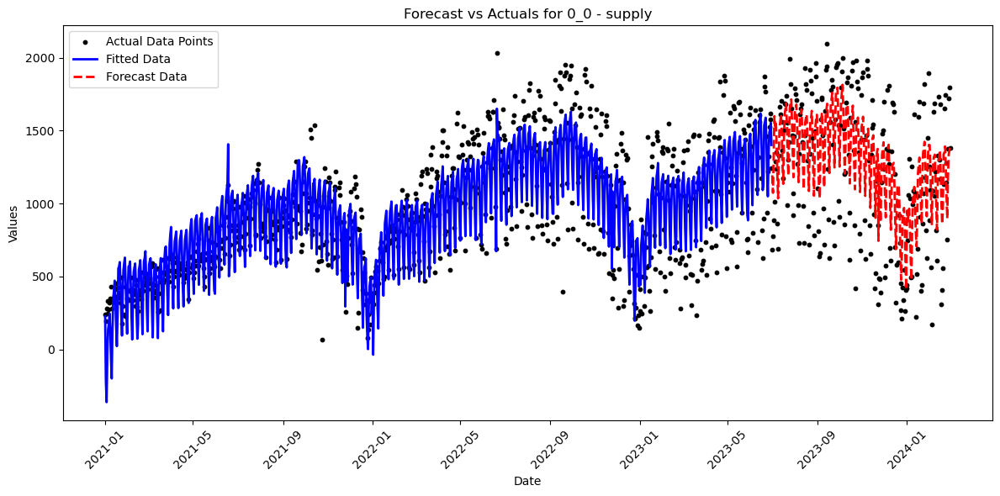

00:20:21 - cmdstanpy - INFO - Chain [1] start processing
00:20:21 - cmdstanpy - INFO - Chain [1] done processing


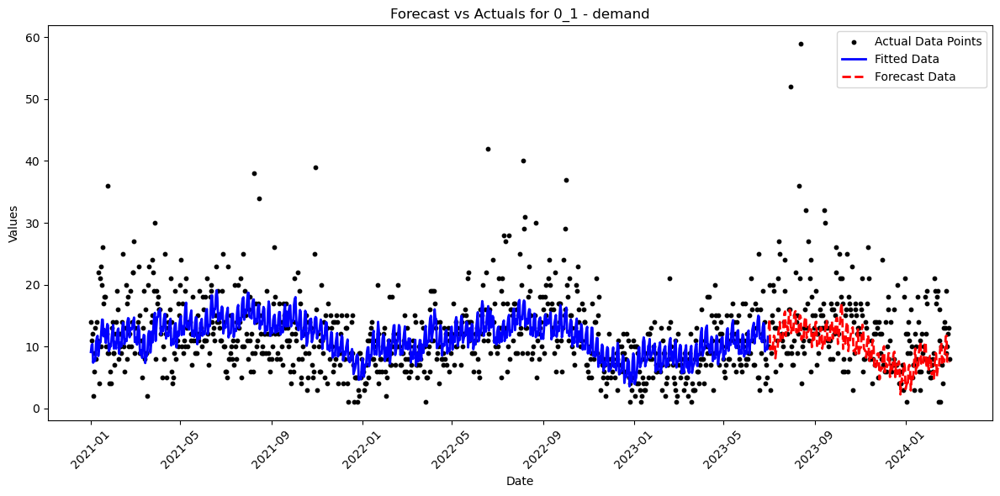

00:20:22 - cmdstanpy - INFO - Chain [1] start processing
00:20:22 - cmdstanpy - INFO - Chain [1] done processing


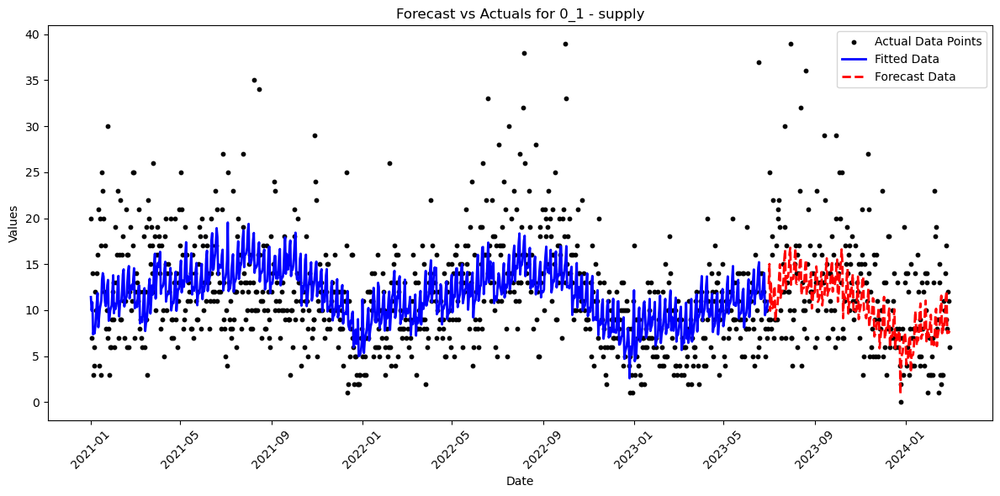

00:20:23 - cmdstanpy - INFO - Chain [1] start processing
00:20:23 - cmdstanpy - INFO - Chain [1] done processing


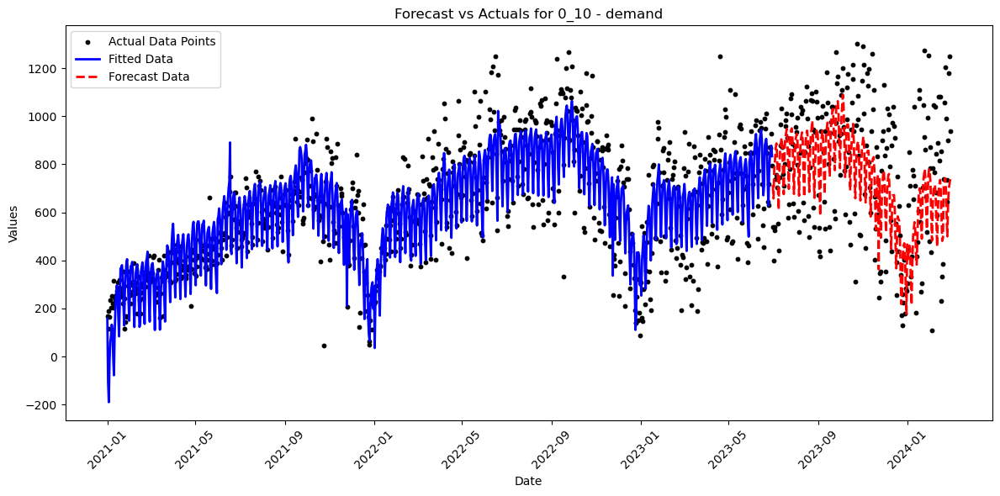

00:20:24 - cmdstanpy - INFO - Chain [1] start processing
00:20:24 - cmdstanpy - INFO - Chain [1] done processing


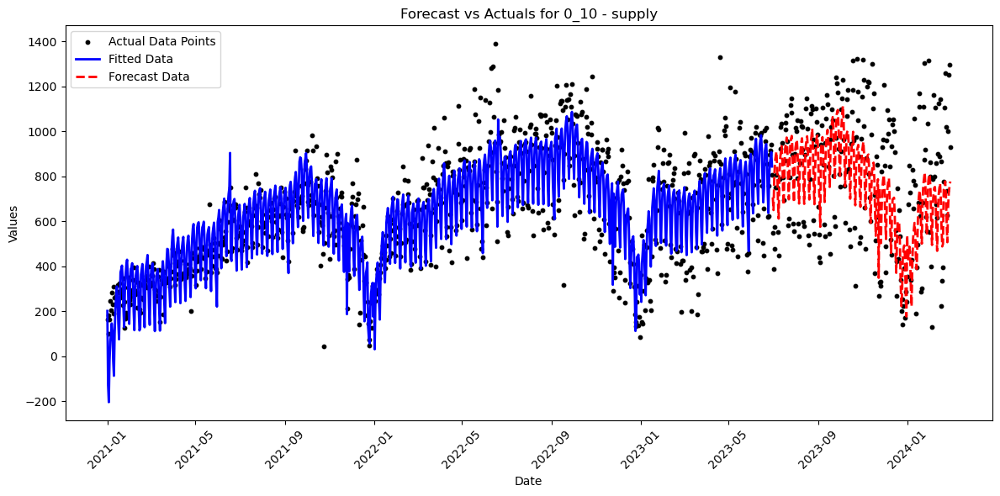

00:20:25 - cmdstanpy - INFO - Chain [1] start processing
00:20:25 - cmdstanpy - INFO - Chain [1] done processing


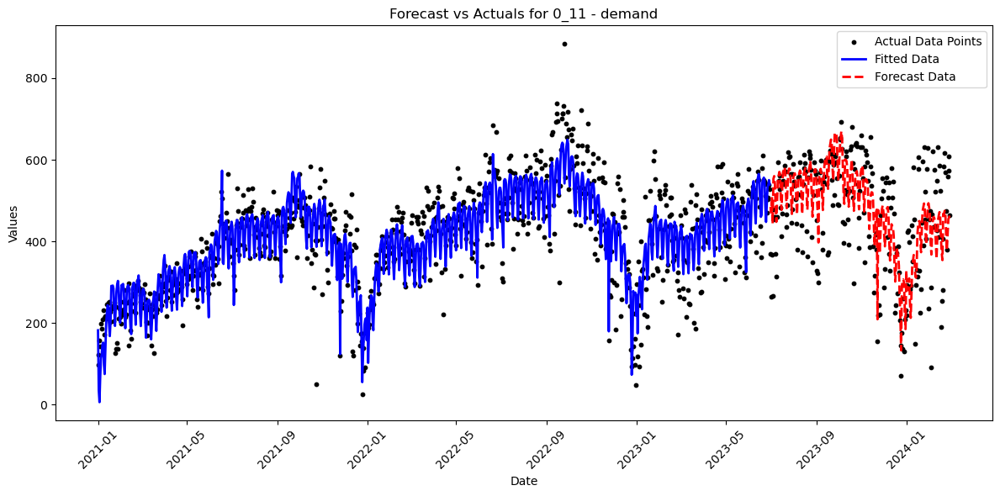

00:20:26 - cmdstanpy - INFO - Chain [1] start processing
00:20:26 - cmdstanpy - INFO - Chain [1] done processing


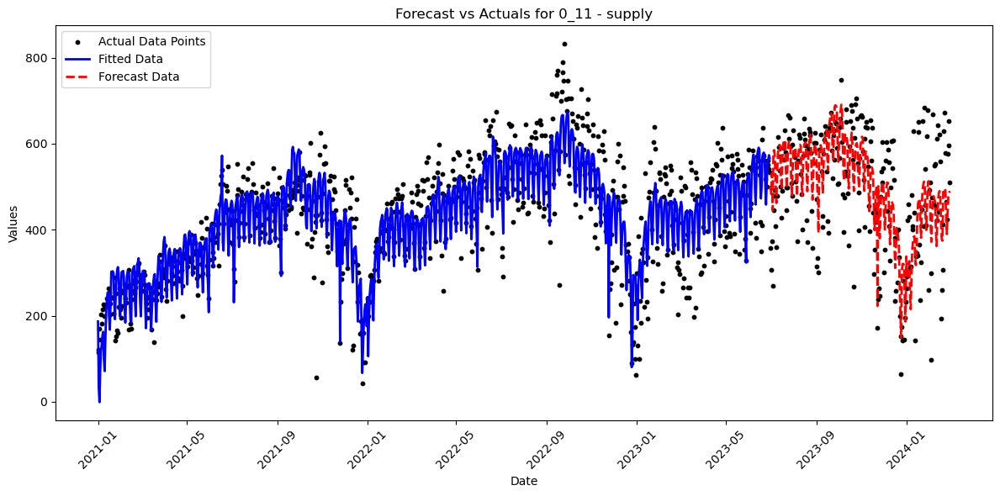

00:20:27 - cmdstanpy - INFO - Chain [1] start processing
00:20:27 - cmdstanpy - INFO - Chain [1] done processing


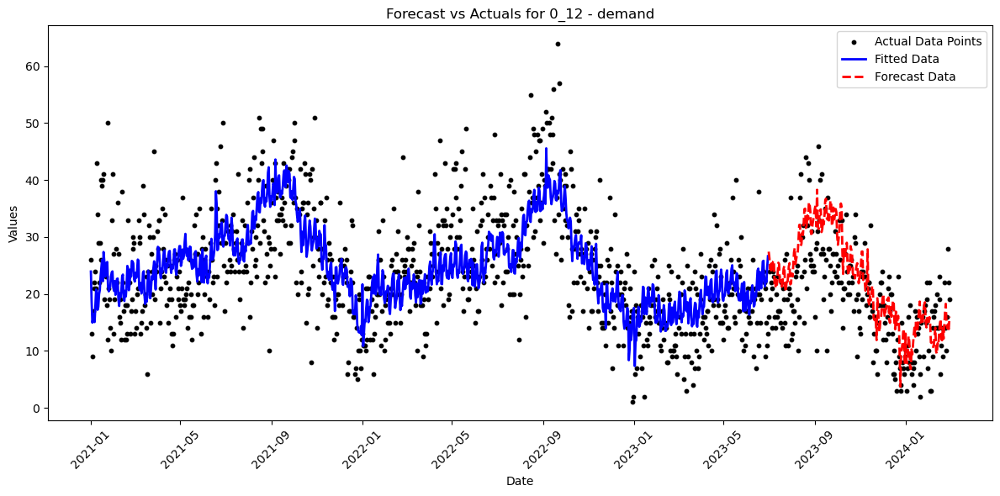

00:20:28 - cmdstanpy - INFO - Chain [1] start processing
00:20:28 - cmdstanpy - INFO - Chain [1] done processing


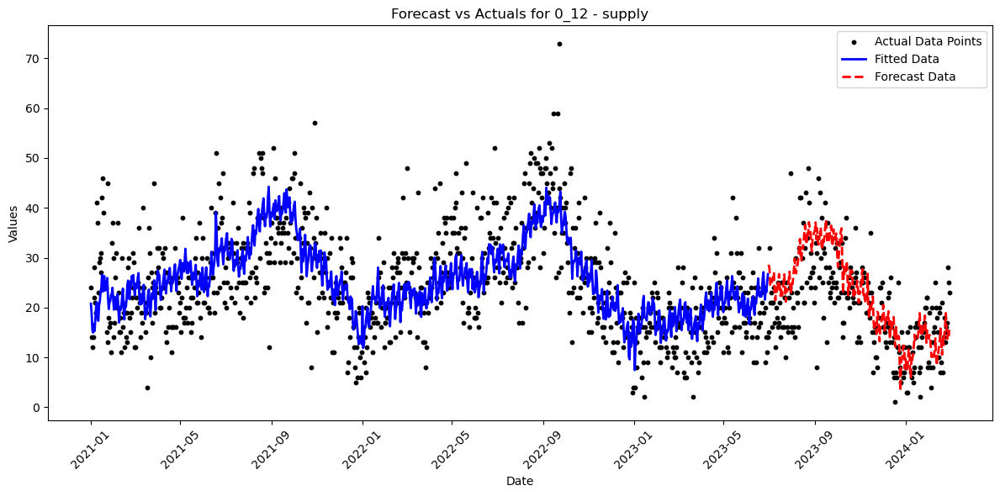

00:20:29 - cmdstanpy - INFO - Chain [1] start processing
00:20:29 - cmdstanpy - INFO - Chain [1] done processing


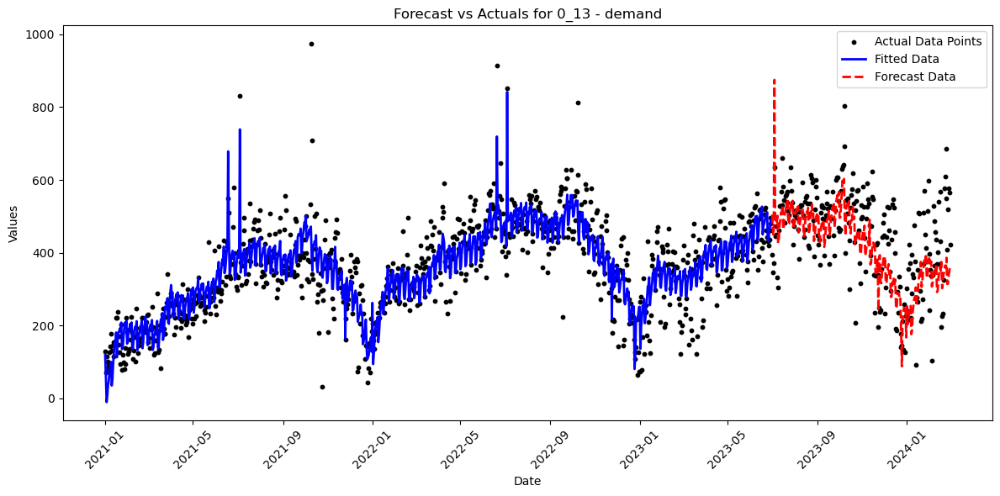

00:20:30 - cmdstanpy - INFO - Chain [1] start processing
00:20:30 - cmdstanpy - INFO - Chain [1] done processing


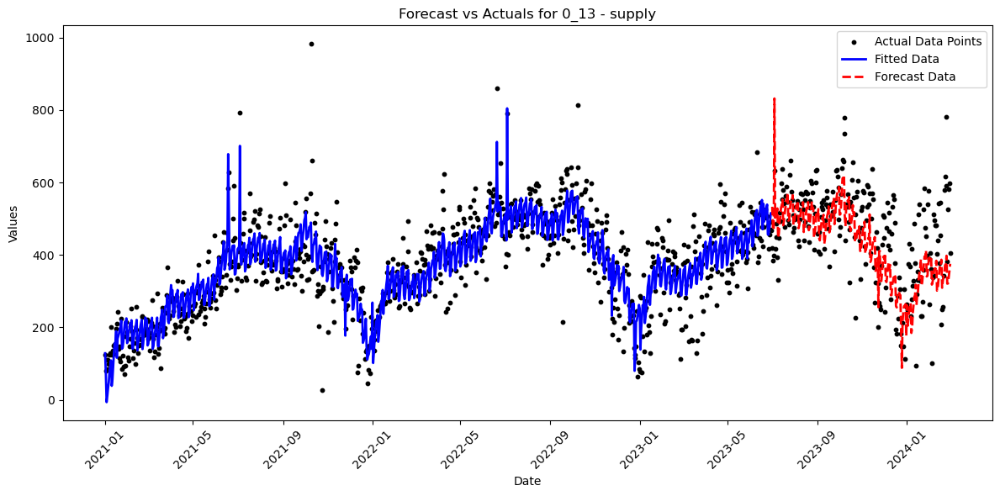

00:20:31 - cmdstanpy - INFO - Chain [1] start processing
00:20:31 - cmdstanpy - INFO - Chain [1] done processing


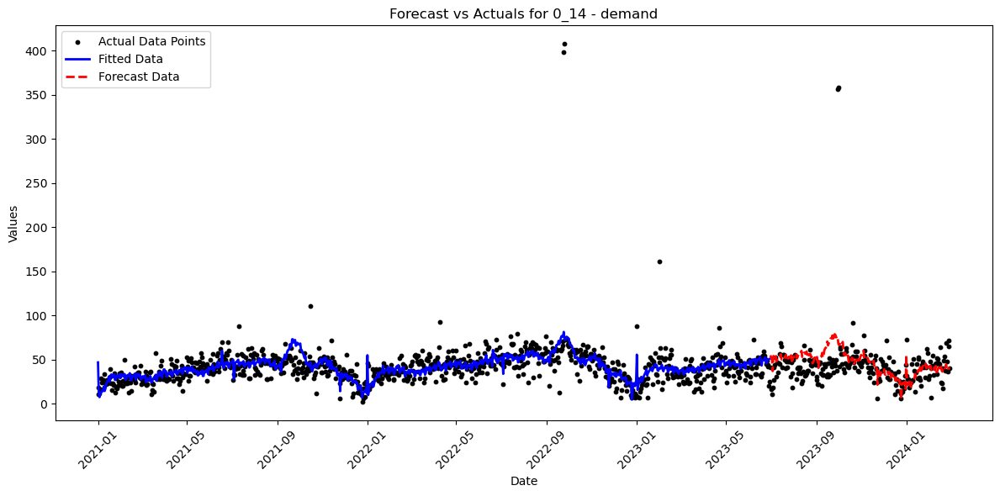

00:20:32 - cmdstanpy - INFO - Chain [1] start processing
00:20:32 - cmdstanpy - INFO - Chain [1] done processing


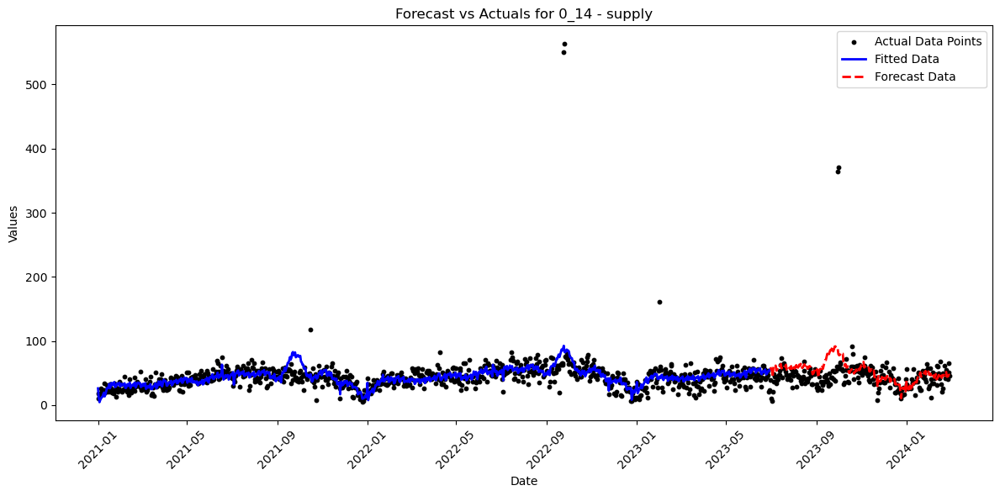

00:20:33 - cmdstanpy - INFO - Chain [1] start processing
00:20:33 - cmdstanpy - INFO - Chain [1] done processing


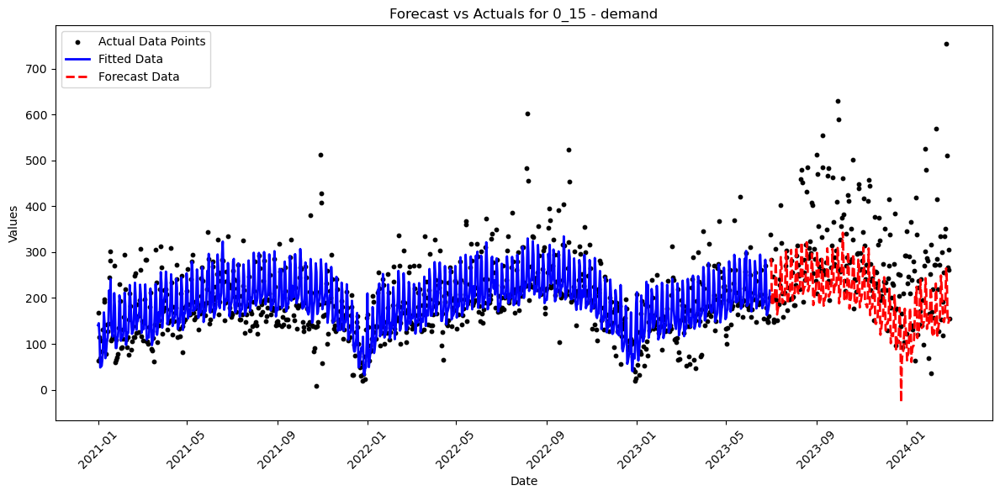

00:20:33 - cmdstanpy - INFO - Chain [1] start processing
00:20:33 - cmdstanpy - INFO - Chain [1] done processing


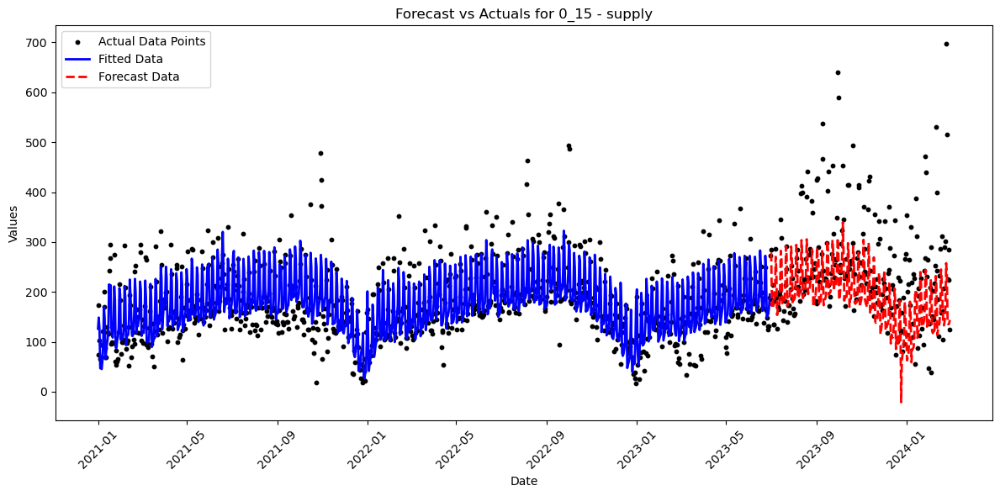

00:20:35 - cmdstanpy - INFO - Chain [1] start processing
00:20:35 - cmdstanpy - INFO - Chain [1] done processing


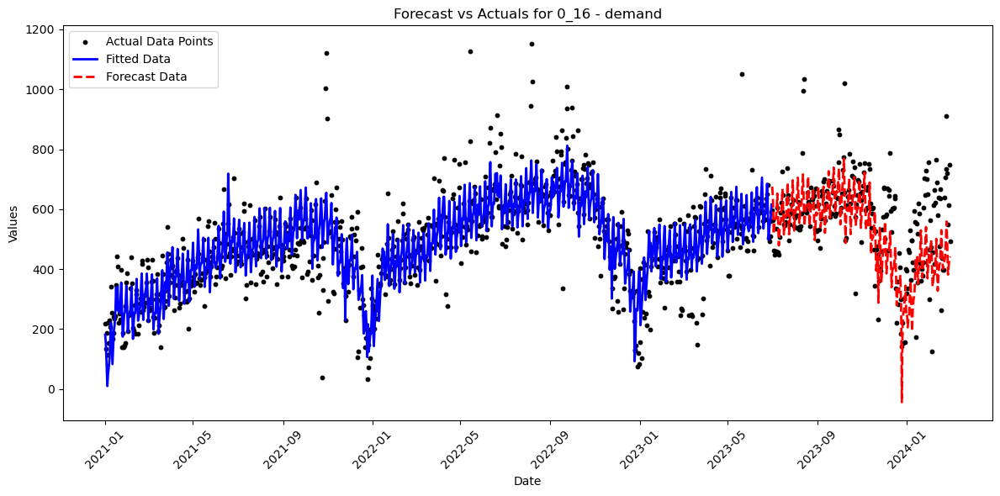

00:20:36 - cmdstanpy - INFO - Chain [1] start processing
00:20:36 - cmdstanpy - INFO - Chain [1] done processing


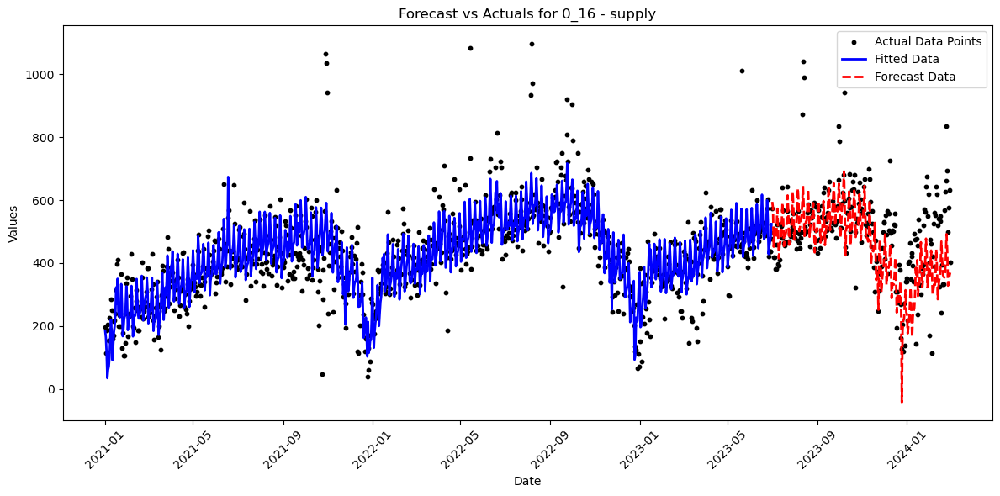

00:20:36 - cmdstanpy - INFO - Chain [1] start processing
00:20:36 - cmdstanpy - INFO - Chain [1] done processing


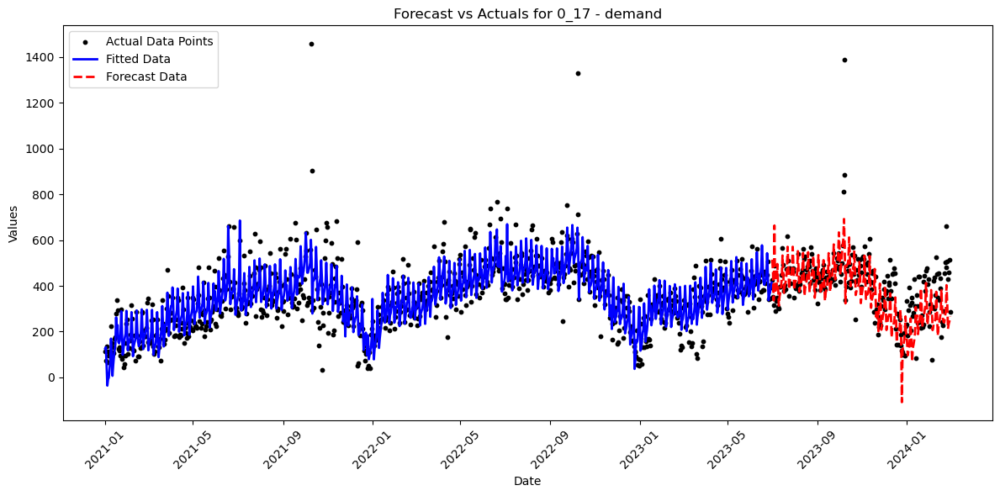

00:20:37 - cmdstanpy - INFO - Chain [1] start processing
00:20:37 - cmdstanpy - INFO - Chain [1] done processing


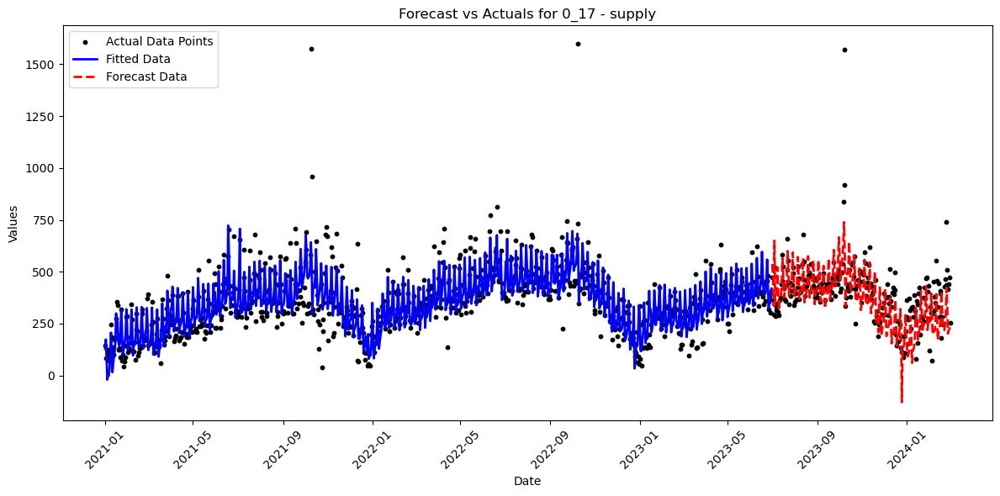

00:20:38 - cmdstanpy - INFO - Chain [1] start processing
00:20:38 - cmdstanpy - INFO - Chain [1] done processing


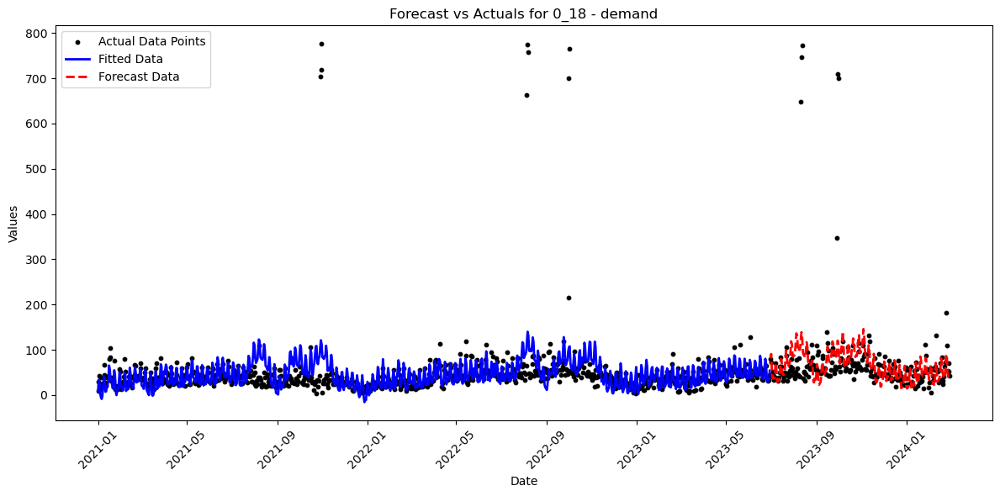

00:20:39 - cmdstanpy - INFO - Chain [1] start processing
00:20:39 - cmdstanpy - INFO - Chain [1] done processing


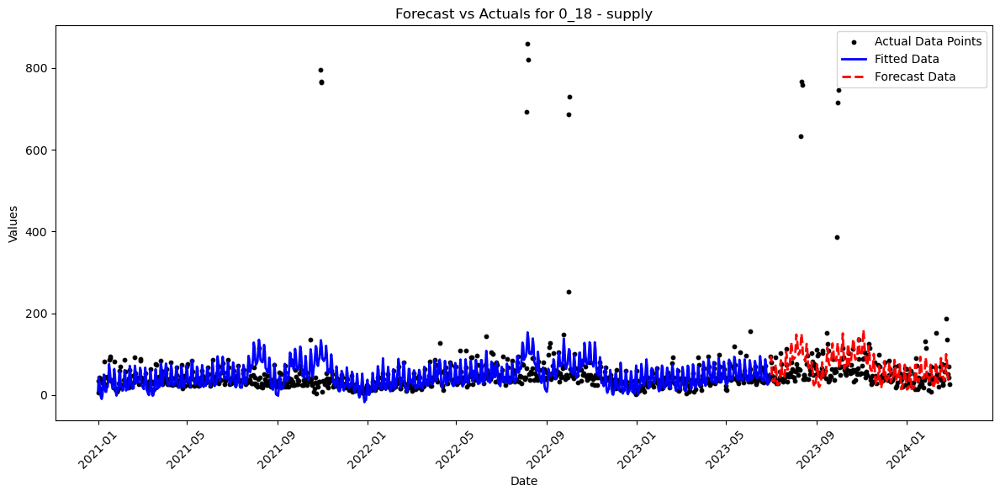

00:20:40 - cmdstanpy - INFO - Chain [1] start processing
00:20:40 - cmdstanpy - INFO - Chain [1] done processing


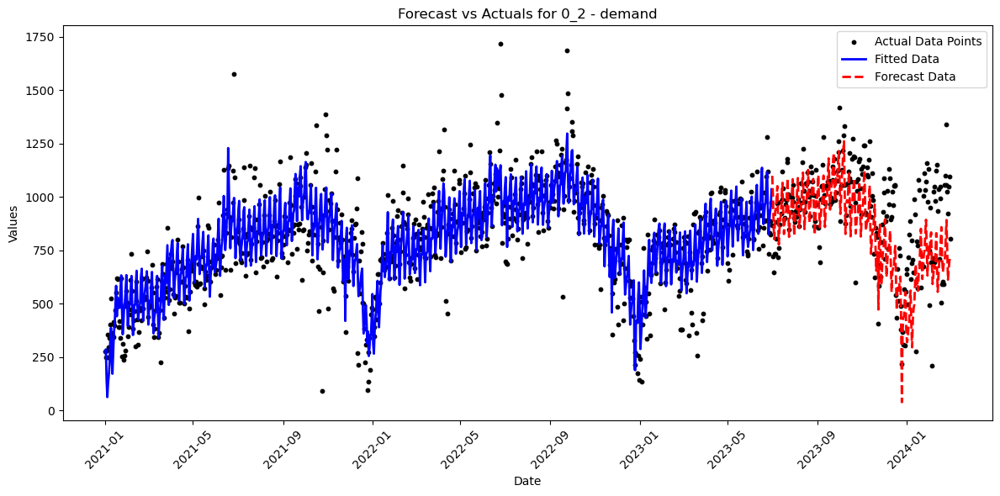

00:20:41 - cmdstanpy - INFO - Chain [1] start processing
00:20:41 - cmdstanpy - INFO - Chain [1] done processing


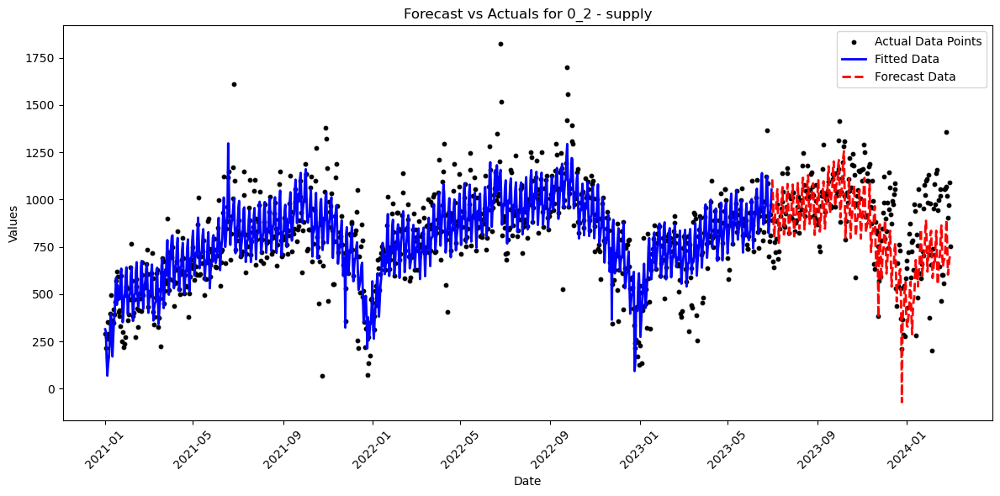

00:20:42 - cmdstanpy - INFO - Chain [1] start processing
00:20:42 - cmdstanpy - INFO - Chain [1] done processing


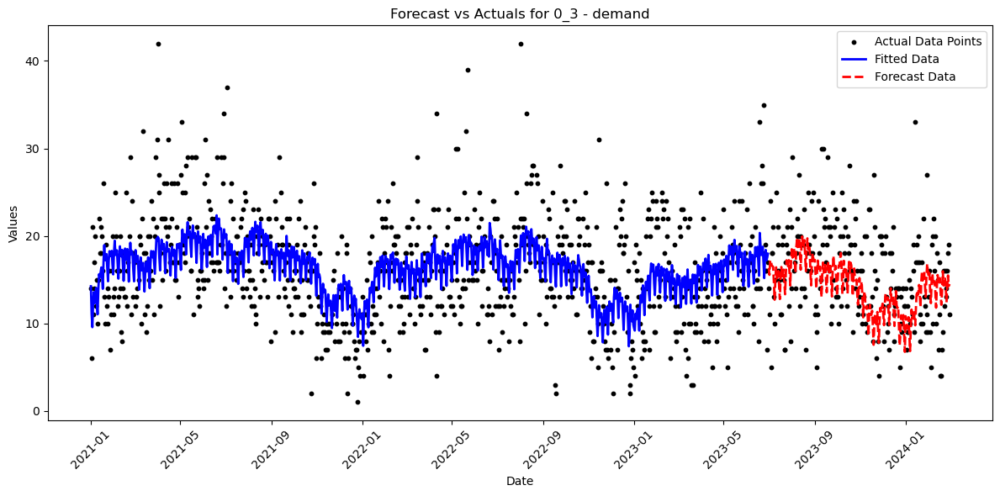

00:20:43 - cmdstanpy - INFO - Chain [1] start processing
00:20:43 - cmdstanpy - INFO - Chain [1] done processing


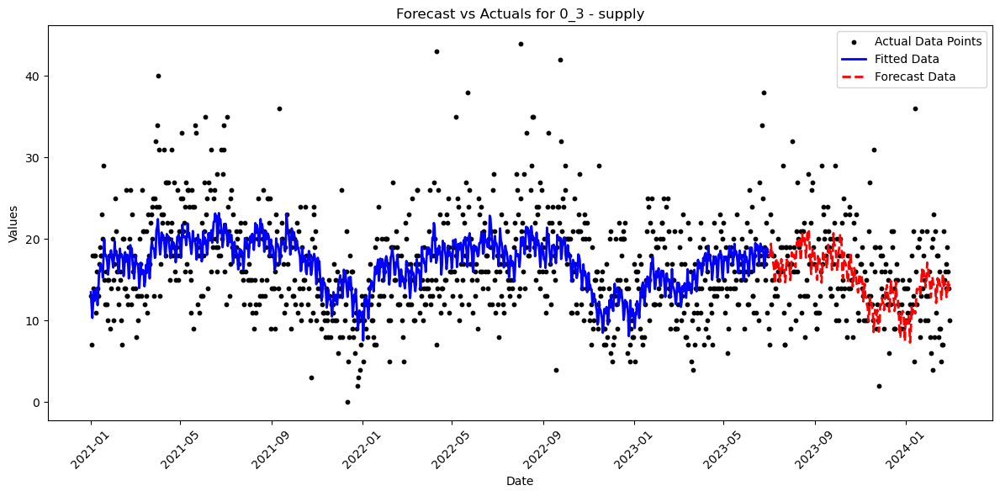

00:20:44 - cmdstanpy - INFO - Chain [1] start processing
00:20:44 - cmdstanpy - INFO - Chain [1] done processing


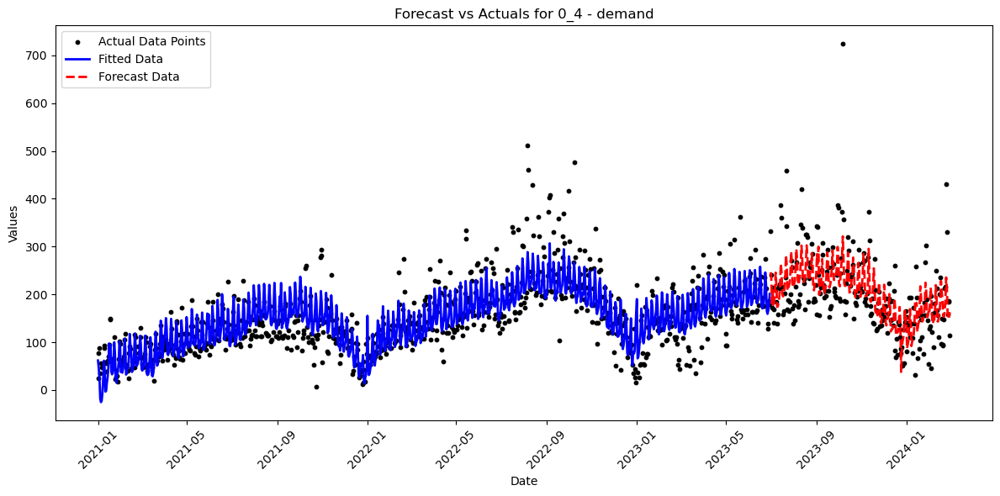

00:20:44 - cmdstanpy - INFO - Chain [1] start processing
00:20:45 - cmdstanpy - INFO - Chain [1] done processing


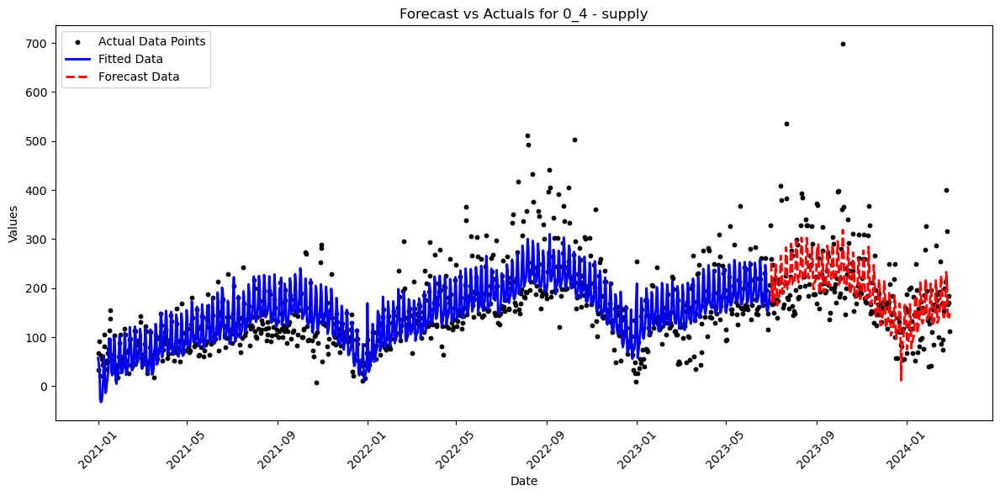

00:20:45 - cmdstanpy - INFO - Chain [1] start processing
00:20:46 - cmdstanpy - INFO - Chain [1] done processing


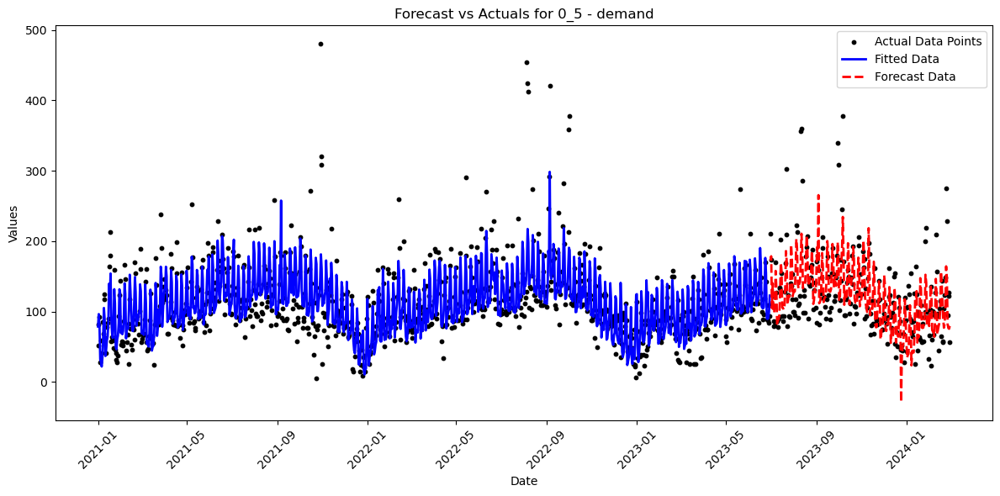

00:20:46 - cmdstanpy - INFO - Chain [1] start processing
00:20:46 - cmdstanpy - INFO - Chain [1] done processing


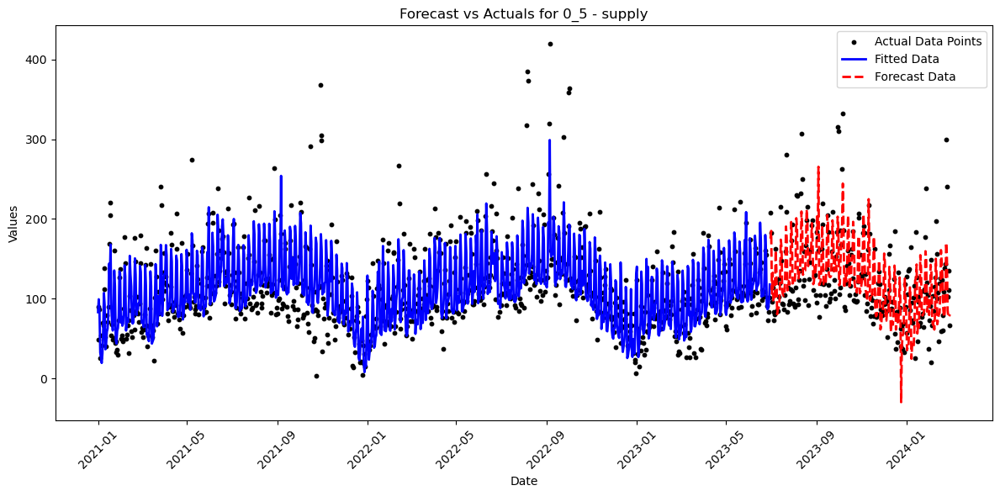

00:20:47 - cmdstanpy - INFO - Chain [1] start processing
00:20:47 - cmdstanpy - INFO - Chain [1] done processing


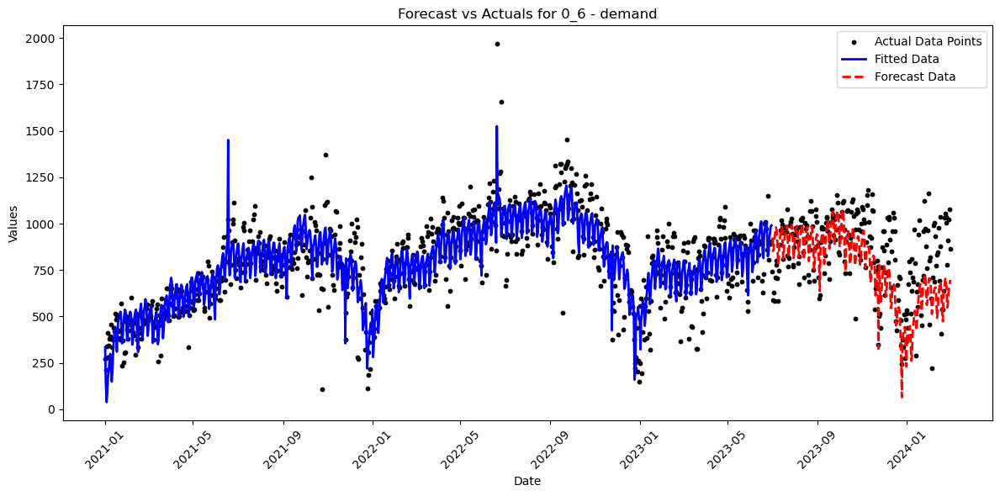

00:20:48 - cmdstanpy - INFO - Chain [1] start processing
00:20:48 - cmdstanpy - INFO - Chain [1] done processing


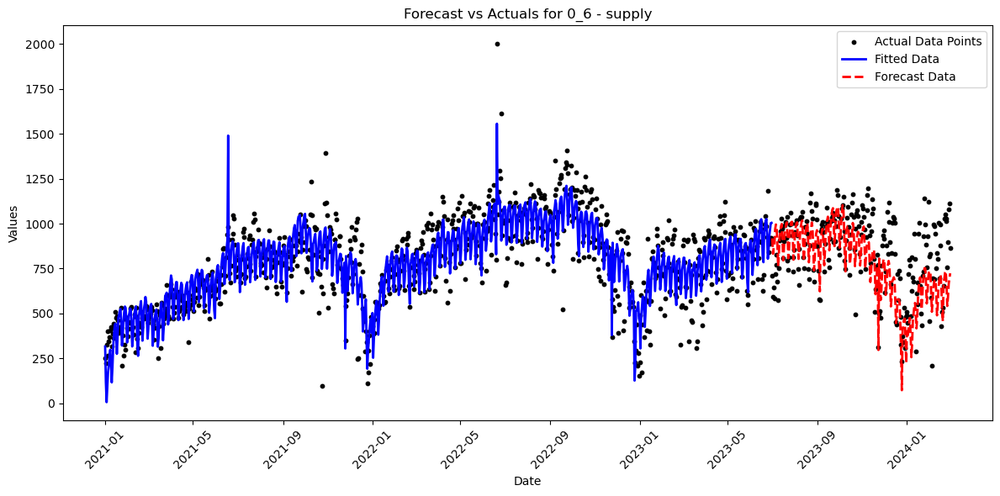

00:20:49 - cmdstanpy - INFO - Chain [1] start processing
00:20:49 - cmdstanpy - INFO - Chain [1] done processing


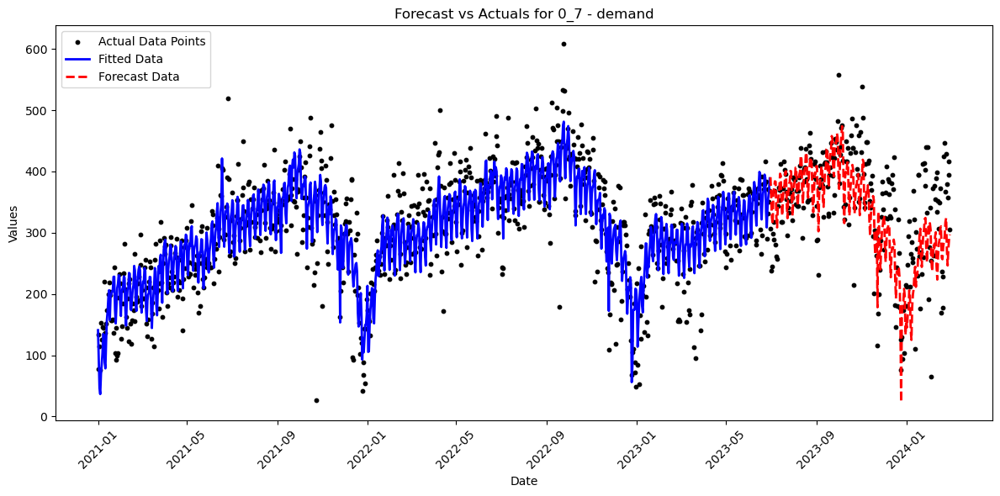

00:20:50 - cmdstanpy - INFO - Chain [1] start processing
00:20:50 - cmdstanpy - INFO - Chain [1] done processing


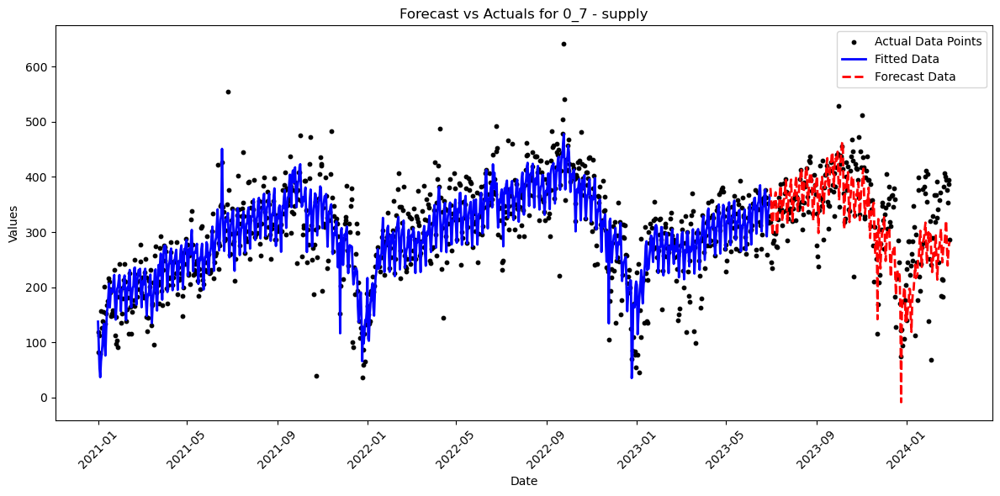

00:20:51 - cmdstanpy - INFO - Chain [1] start processing
00:20:51 - cmdstanpy - INFO - Chain [1] done processing


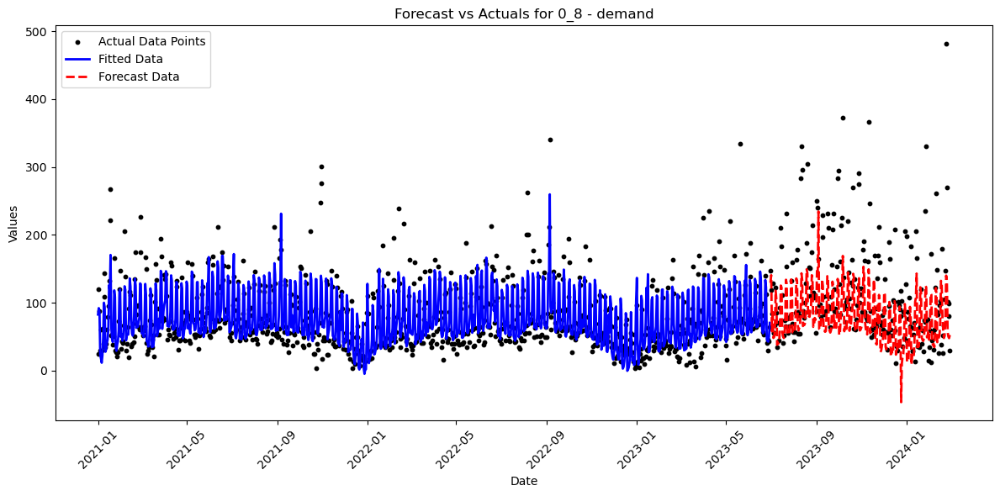

00:20:52 - cmdstanpy - INFO - Chain [1] start processing
00:20:52 - cmdstanpy - INFO - Chain [1] done processing


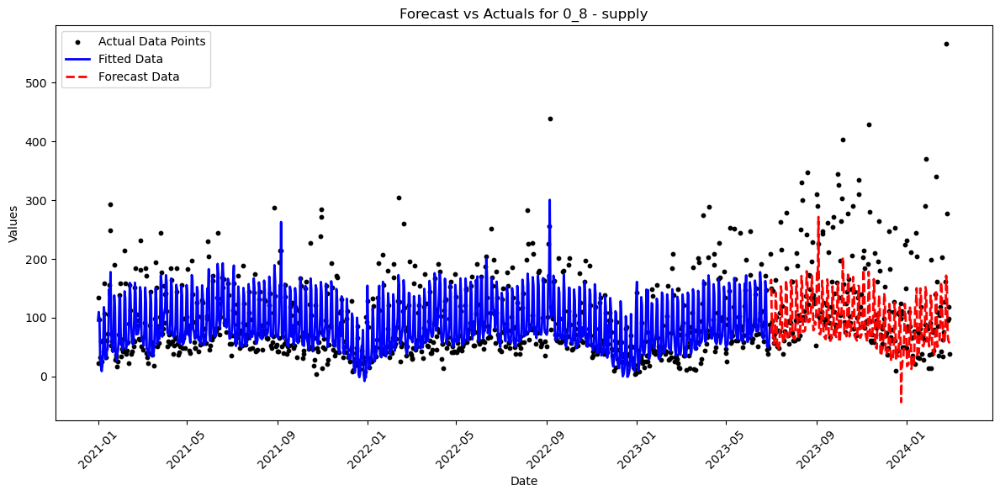

00:20:53 - cmdstanpy - INFO - Chain [1] start processing
00:20:53 - cmdstanpy - INFO - Chain [1] done processing


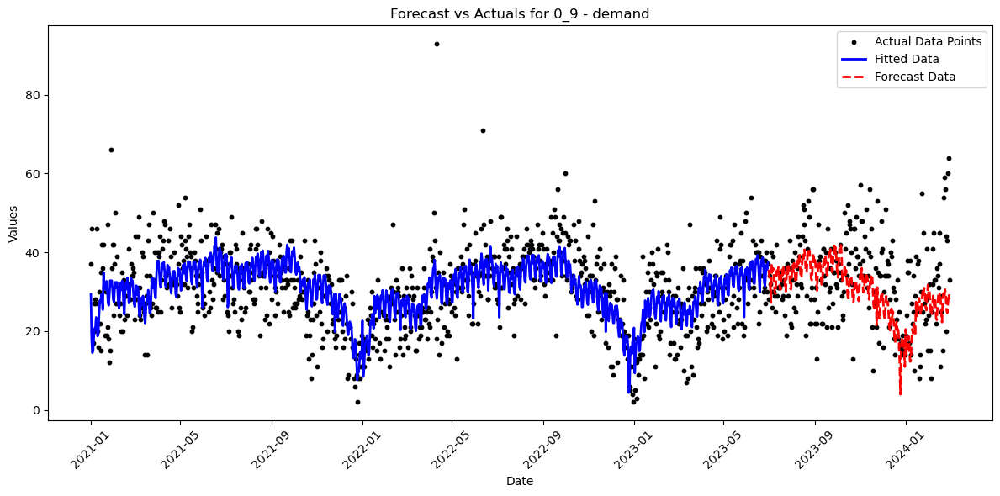

00:20:54 - cmdstanpy - INFO - Chain [1] start processing
00:20:54 - cmdstanpy - INFO - Chain [1] done processing


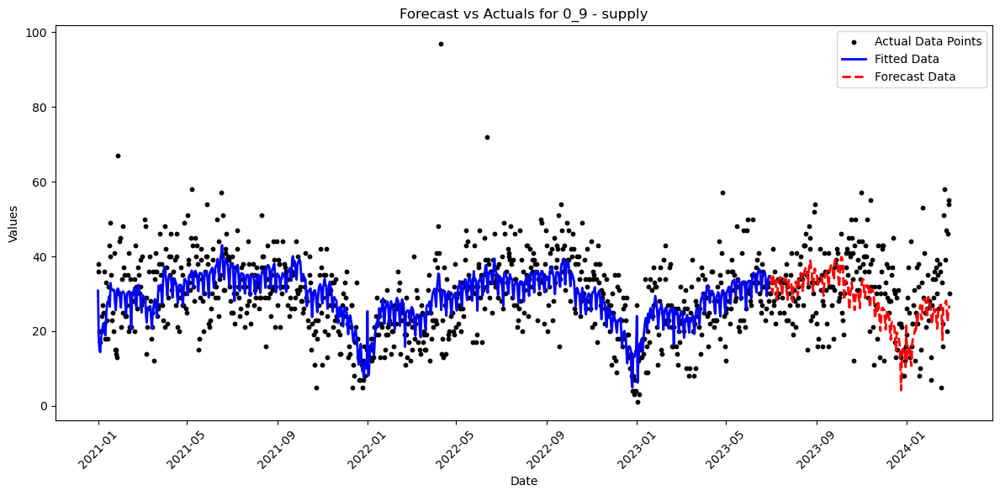

00:20:55 - cmdstanpy - INFO - Chain [1] start processing
00:20:55 - cmdstanpy - INFO - Chain [1] done processing


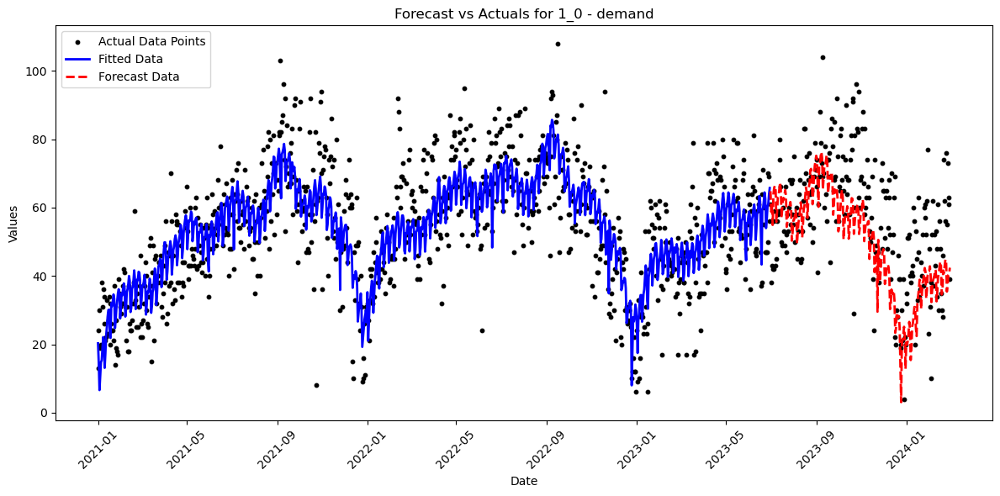

00:20:56 - cmdstanpy - INFO - Chain [1] start processing
00:20:56 - cmdstanpy - INFO - Chain [1] done processing


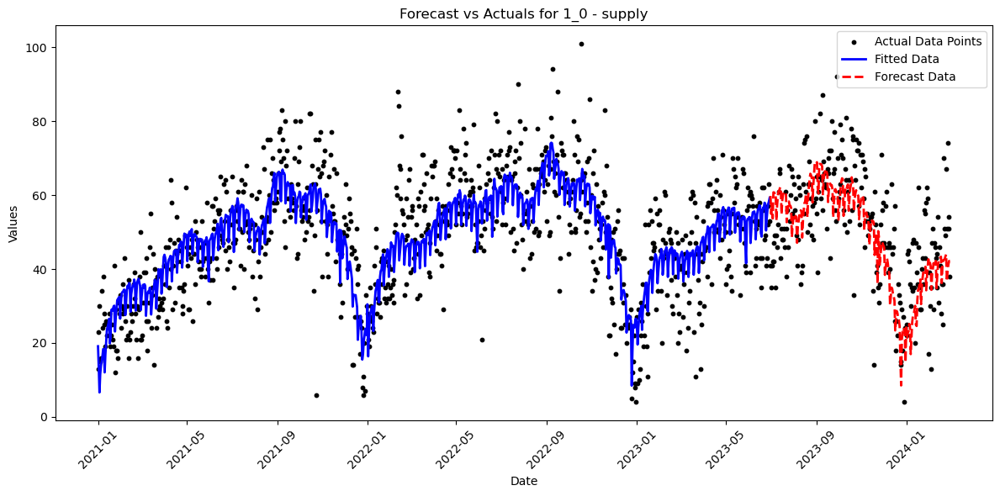

00:20:57 - cmdstanpy - INFO - Chain [1] start processing
00:20:57 - cmdstanpy - INFO - Chain [1] done processing


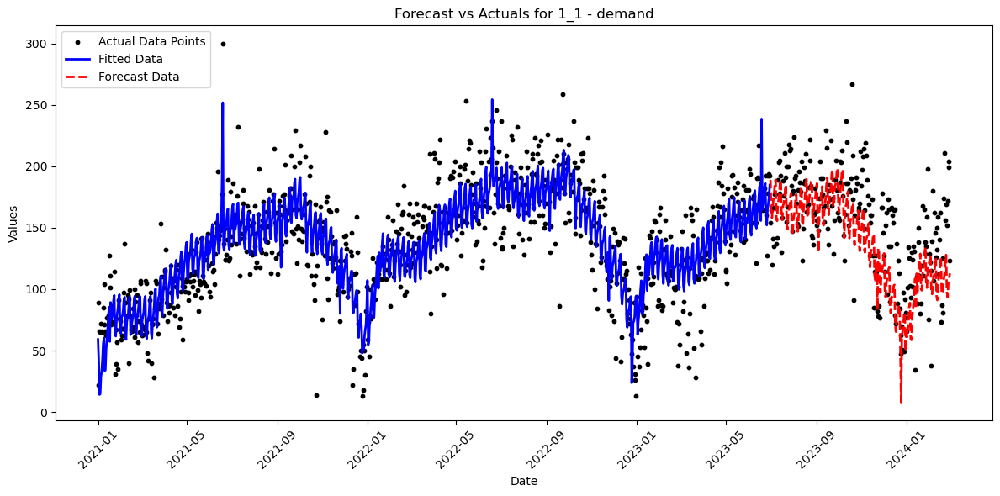

00:20:58 - cmdstanpy - INFO - Chain [1] start processing
00:20:58 - cmdstanpy - INFO - Chain [1] done processing


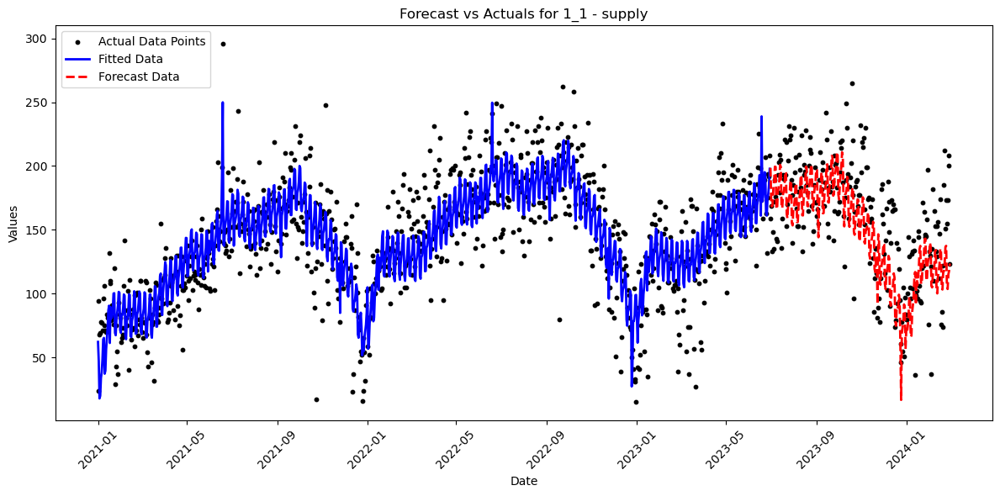

00:20:59 - cmdstanpy - INFO - Chain [1] start processing
00:20:59 - cmdstanpy - INFO - Chain [1] done processing


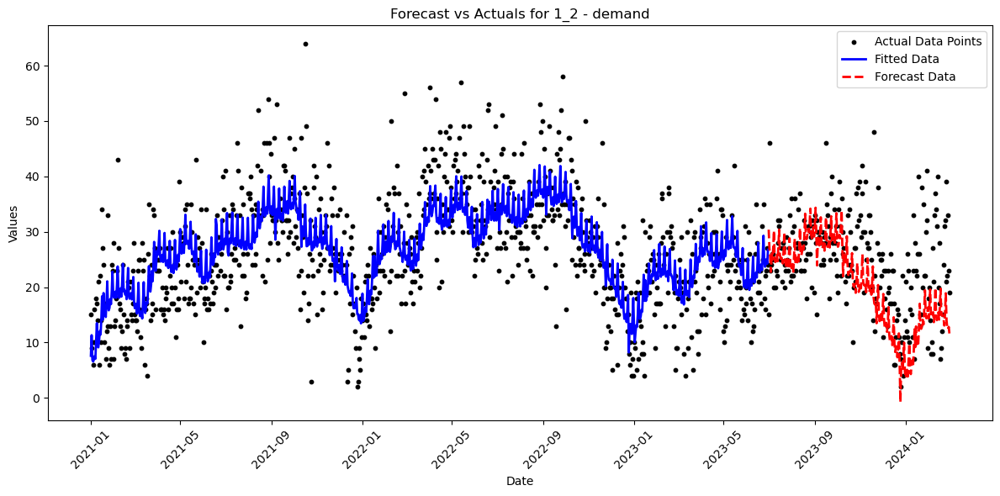

00:21:00 - cmdstanpy - INFO - Chain [1] start processing
00:21:00 - cmdstanpy - INFO - Chain [1] done processing


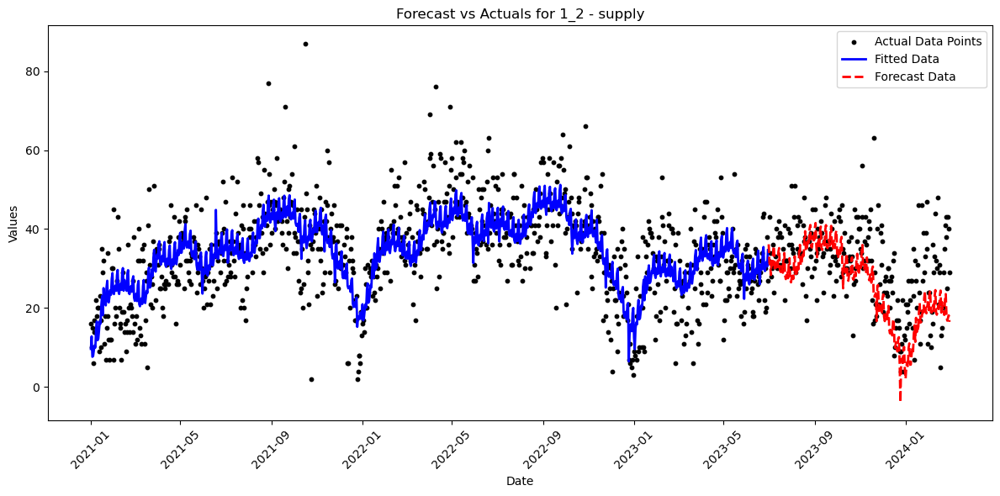

00:21:01 - cmdstanpy - INFO - Chain [1] start processing
00:21:01 - cmdstanpy - INFO - Chain [1] done processing


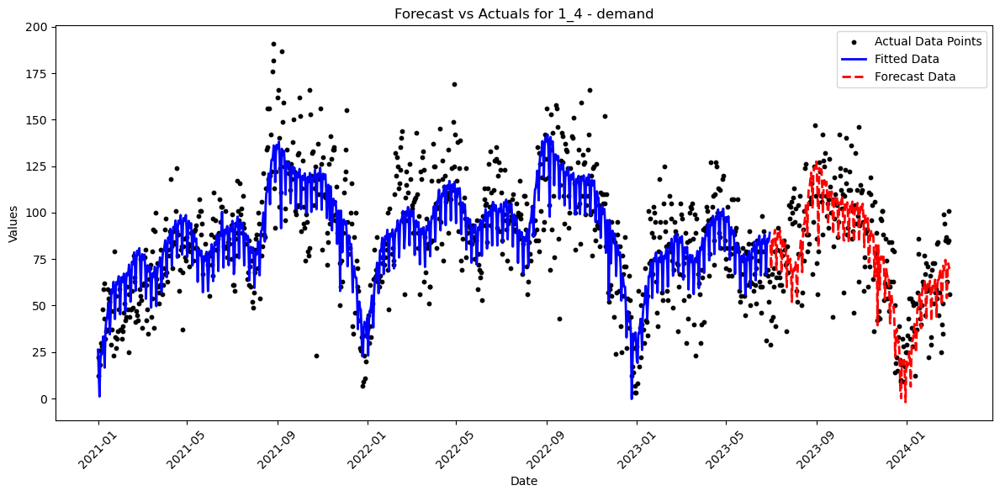

00:21:02 - cmdstanpy - INFO - Chain [1] start processing
00:21:02 - cmdstanpy - INFO - Chain [1] done processing


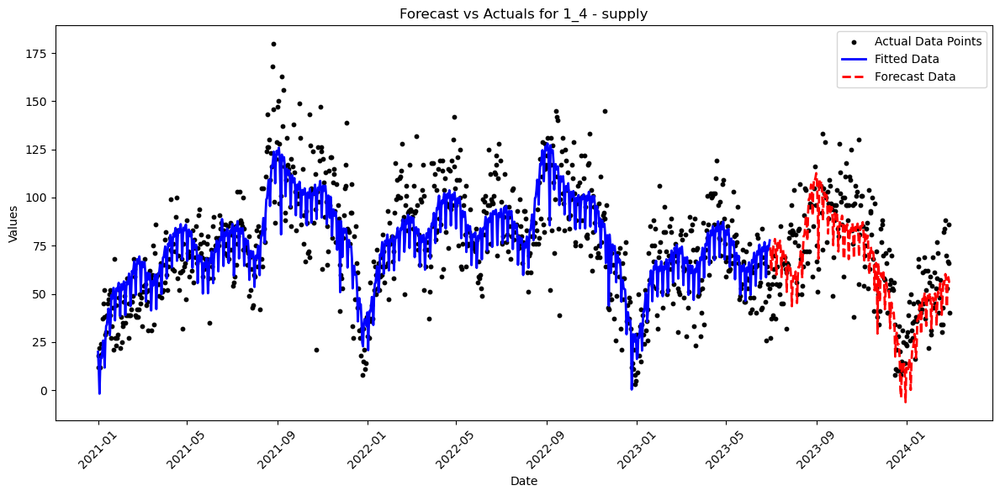

00:21:03 - cmdstanpy - INFO - Chain [1] start processing
00:21:03 - cmdstanpy - INFO - Chain [1] done processing


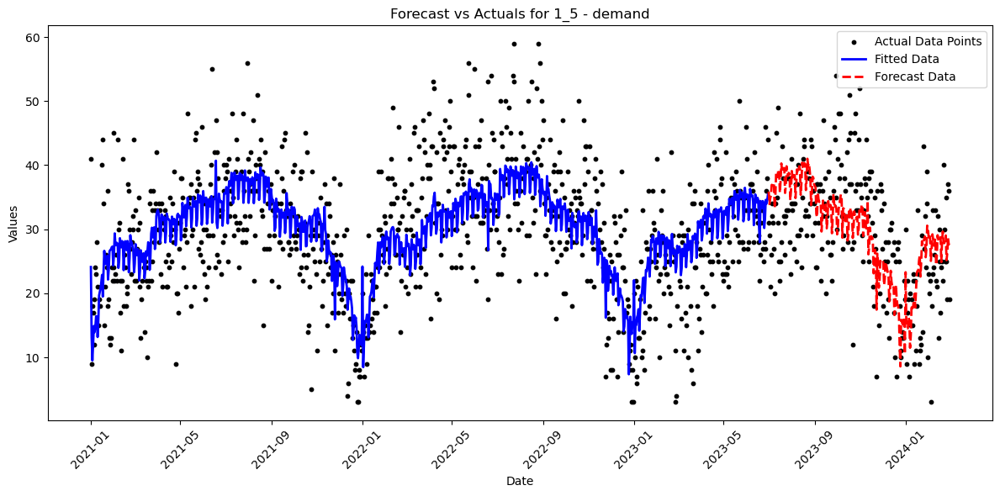

00:21:04 - cmdstanpy - INFO - Chain [1] start processing
00:21:04 - cmdstanpy - INFO - Chain [1] done processing


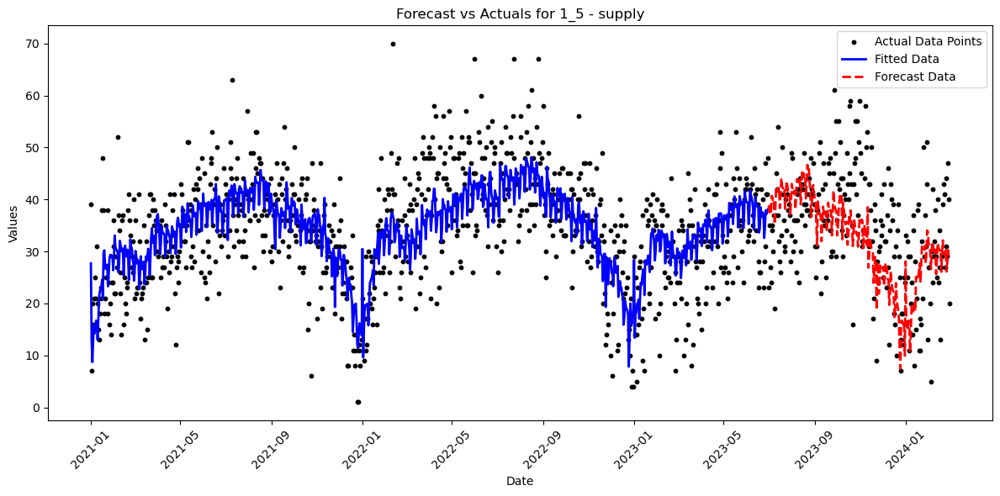

00:21:05 - cmdstanpy - INFO - Chain [1] start processing
00:21:05 - cmdstanpy - INFO - Chain [1] done processing


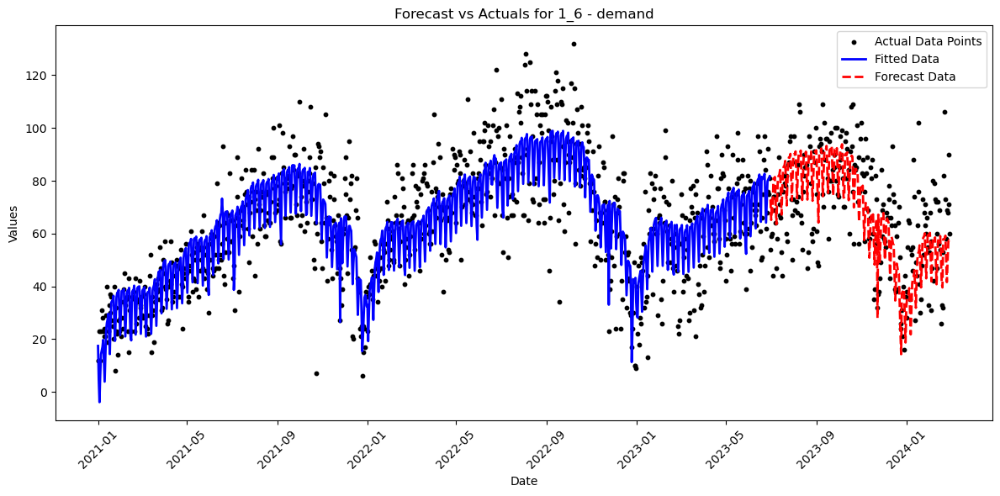

00:21:06 - cmdstanpy - INFO - Chain [1] start processing
00:21:06 - cmdstanpy - INFO - Chain [1] done processing


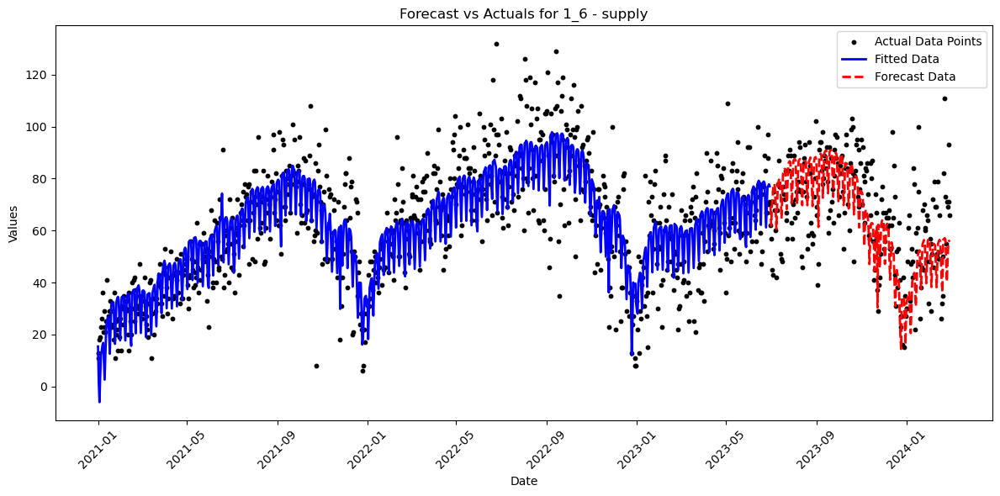

00:21:07 - cmdstanpy - INFO - Chain [1] start processing
00:21:07 - cmdstanpy - INFO - Chain [1] done processing


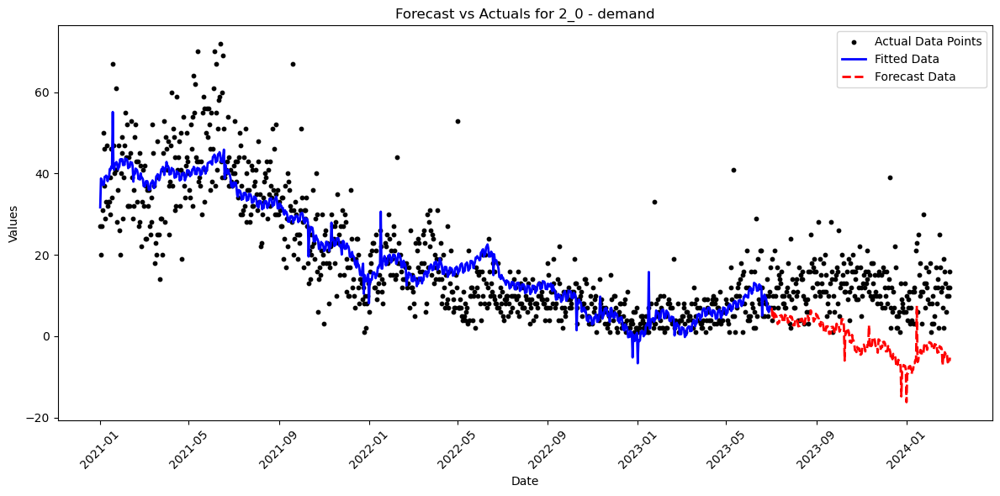

00:21:08 - cmdstanpy - INFO - Chain [1] start processing
00:21:08 - cmdstanpy - INFO - Chain [1] done processing


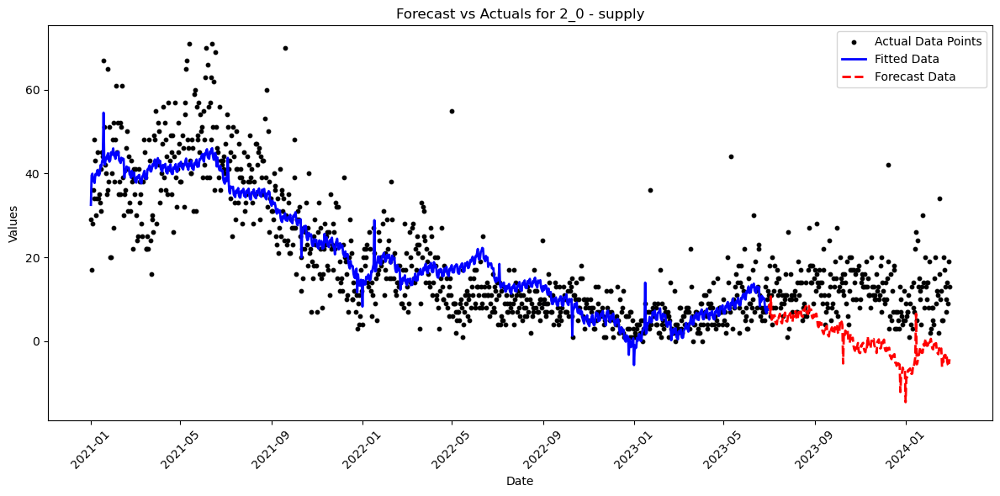

00:21:08 - cmdstanpy - INFO - Chain [1] start processing
00:21:09 - cmdstanpy - INFO - Chain [1] done processing


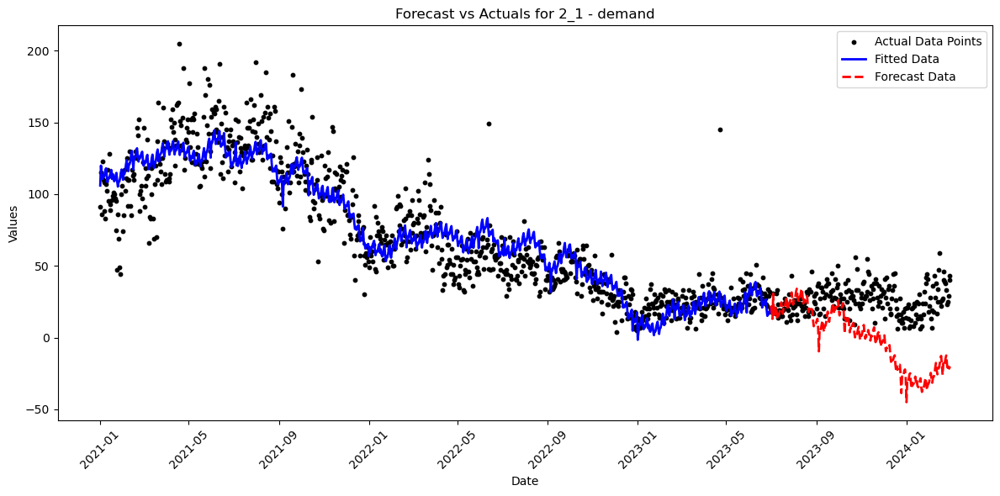

00:21:09 - cmdstanpy - INFO - Chain [1] start processing
00:21:09 - cmdstanpy - INFO - Chain [1] done processing


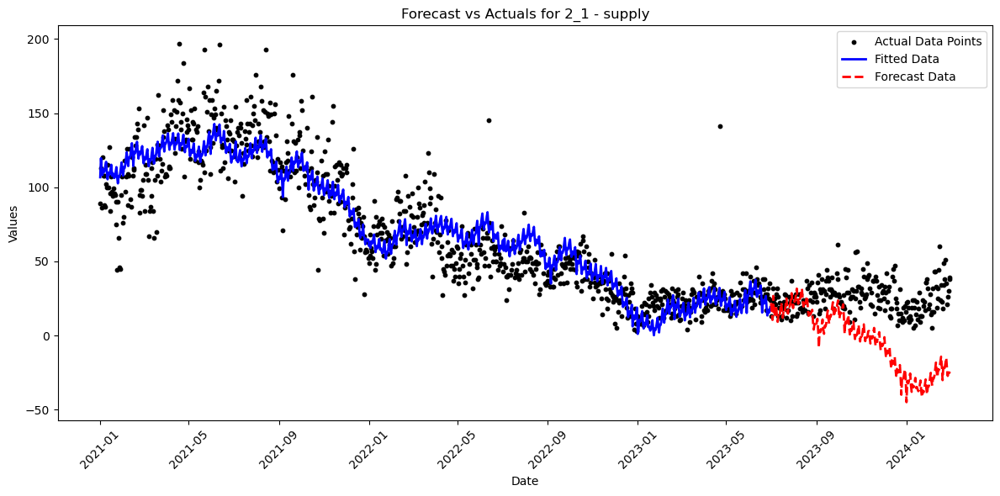

00:21:10 - cmdstanpy - INFO - Chain [1] start processing
00:21:10 - cmdstanpy - INFO - Chain [1] done processing


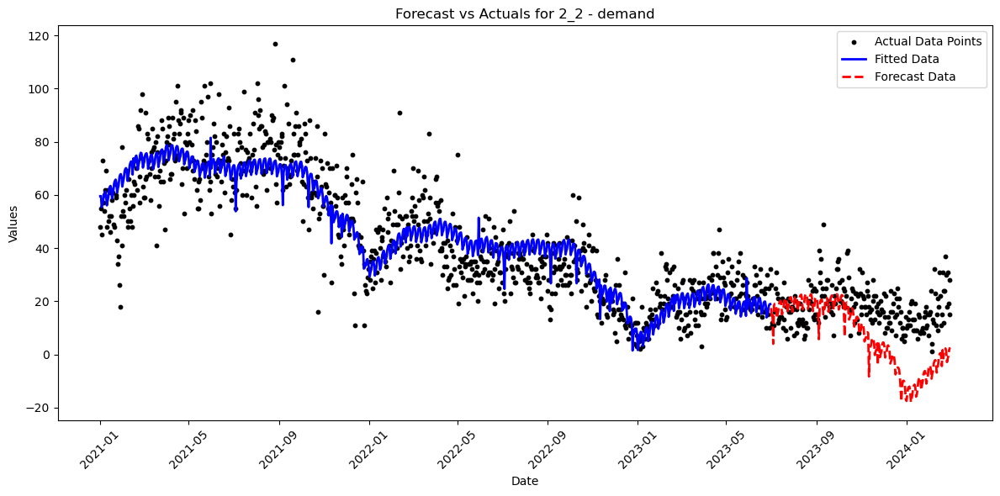

00:21:11 - cmdstanpy - INFO - Chain [1] start processing
00:21:11 - cmdstanpy - INFO - Chain [1] done processing


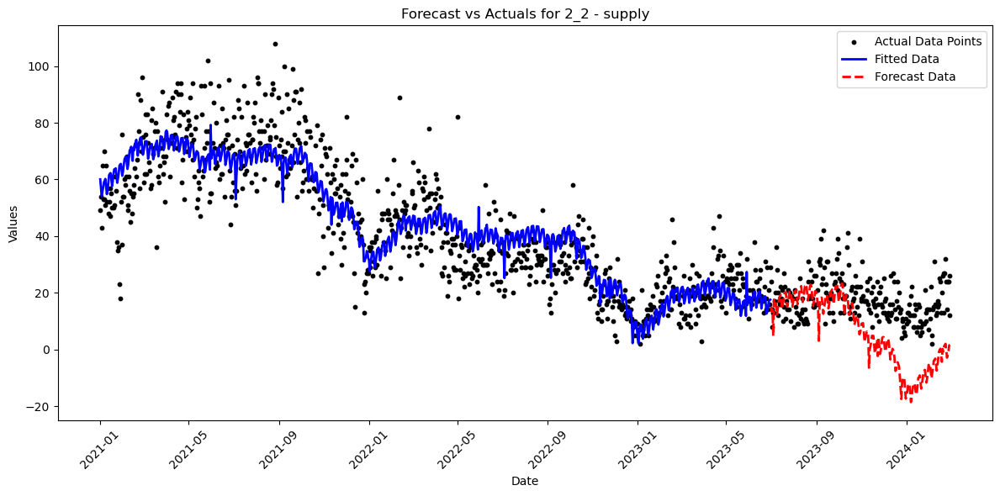

00:21:12 - cmdstanpy - INFO - Chain [1] start processing
00:21:12 - cmdstanpy - INFO - Chain [1] done processing


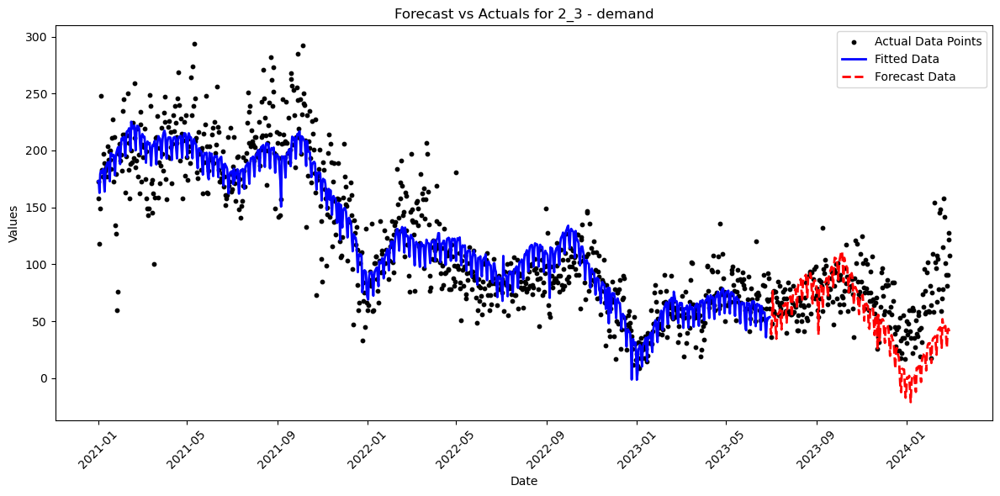

00:21:13 - cmdstanpy - INFO - Chain [1] start processing
00:21:13 - cmdstanpy - INFO - Chain [1] done processing


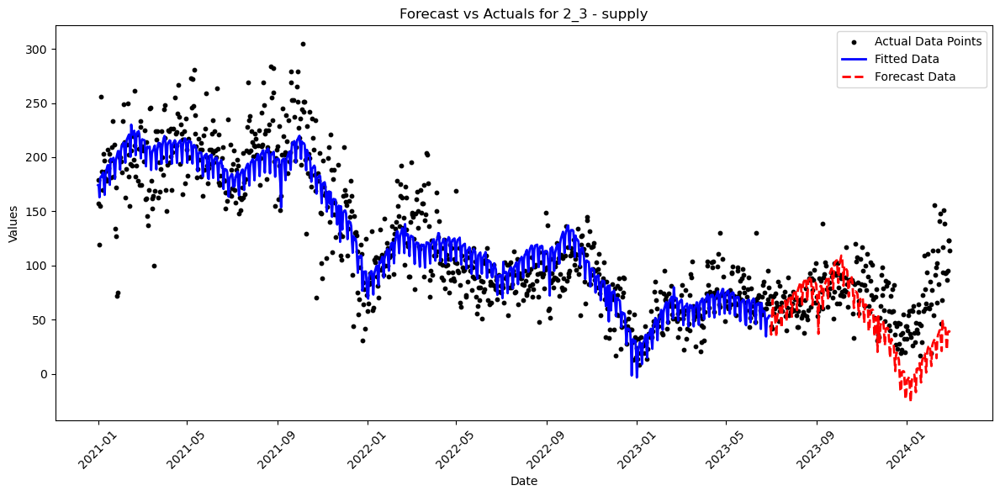

00:21:13 - cmdstanpy - INFO - Chain [1] start processing
00:21:13 - cmdstanpy - INFO - Chain [1] done processing


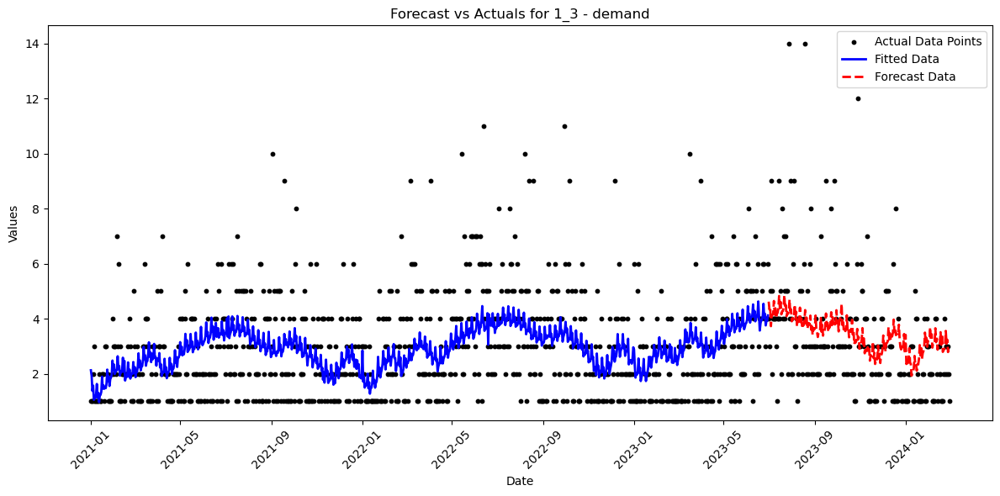

00:21:14 - cmdstanpy - INFO - Chain [1] start processing
00:21:14 - cmdstanpy - INFO - Chain [1] done processing


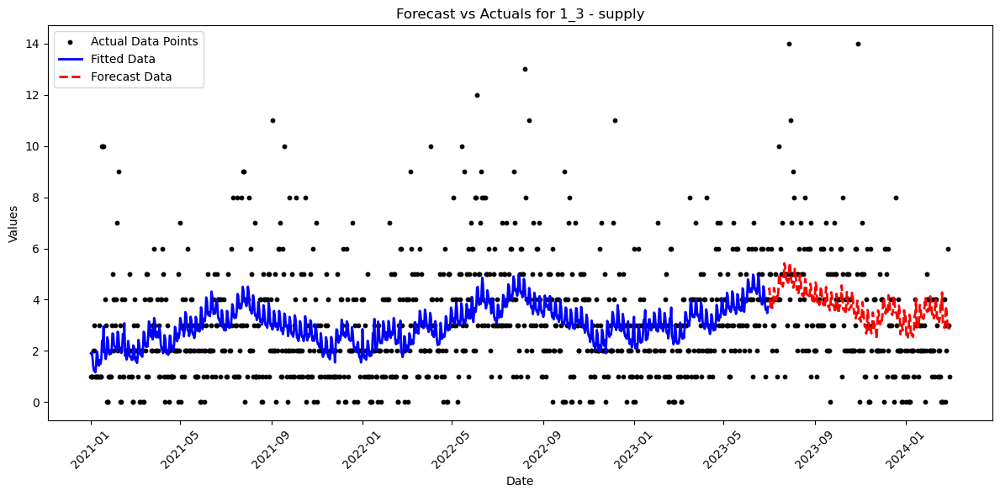

In [84]:
cut_off_date = '2023-07-01'
all_metrics = []
prophet_fitted_df = pd.DataFrame(columns=['cluster_id', 'target', 'ds', 'yhat'])
cluster_ids = df['cluster_id'].unique()

for cluster_id in cluster_ids:
    for target in ['demand', 'supply']:
        cluster_data = df[df['cluster_id'] == cluster_id].copy()
        cluster_data['ds'] = pd.to_datetime(cluster_data['date'])
        cluster_data.rename(columns={target: 'y'}, inplace=True)

        train = cluster_data[cluster_data['ds'] < pd.to_datetime(cut_off_date)]
        test = cluster_data[cluster_data['ds'] >= pd.to_datetime(cut_off_date)]

        model = Prophet(
            changepoint_prior_scale=0.01,
            seasonality_prior_scale=1.0,
            holidays_prior_scale=1.0,
            seasonality_mode='additive',
        ).add_regressor('temperature').add_country_holidays(country_name='US')
        model.fit(train[['ds', 'y', 'temperature']])

        fitted = model.predict(train[['ds', 'temperature']])

        forecast = model.predict(test[['ds', 'temperature']])
        
        plt.figure(figsize=(12, 6))
        plt.scatter(cluster_data['ds'], cluster_data['y'], color='black', label='Actual Data Points', s=10)
        plt.plot(fitted['ds'], fitted['yhat'], color='blue', label='Fitted Data', linewidth=2)
        plt.plot(forecast['ds'], forecast['yhat'], color='red', label='Forecast Data', linewidth=2, linestyle='--')
        plt.title(f'Forecast vs Actuals for {cluster_id} - {target}')
        plt.xlabel('Date')
        plt.ylabel('Values')
        plt.legend()
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
        
        actuals = test['y'].reset_index(drop=True)
        predictions = forecast['yhat']
        mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
        mae = mean_absolute_error(actuals, predictions)
        rmse = np.sqrt(mean_squared_error(actuals, predictions))

        all_metrics.append({
            'cluster_id': cluster_id,
            'target': target,
            'MAPE': mape,
            'MAE': mae,
            'RMSE': rmse
        })
        
        prophet_fitted_df  = pd.concat([prophet_fitted_df,
            pd.DataFrame({
                'cluster_id': cluster_id,
                'target': target,
                'ds': forecast['ds'],
                'yhat': forecast['yhat']
            })], ignore_index=True)

prophet_metrics_df = pd.DataFrame(all_metrics)

In [34]:
prophet_metrics_df.head()

,cluster_id,target,MAPE,MAE,RMSE
0,0_0,demand,31.786976,239.904385,288.648192
1,0_0,supply,33.531949,254.048390,306.496685
2,0_1,demand,45.360669,4.986934,7.207087
3,0_1,supply,inf,4.400657,5.766377
4,0_10,demand,25.601075,160.965181,199.513247


## Neural Prophet

### Neural Prophet Global Hyper Parameter Tuning Using Cross Validation

In [14]:
set_log_level("ERROR")

nprophet_daily_data = df.groupby('date').agg({'demand':'sum','temperature':'mean'}).reset_index()
nprophet_daily_data.rename(columns={'date': 'ds', 'demand': 'y'}, inplace=True)
nprophet_daily_data['ds'] = pd.to_datetime(nprophet_daily_data['ds'])

param_grid = {  
    'changepoints_range': [0.95, 0.975, 0.99, 0.995, 0.999], 
    'seasonality_mode': ['additive', 'multiplicative'],
    'learning_rate': [0.1,0.3,0.6,0.9],
    'n_lags': [2,3,4]
}

all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
results = []  

for params in all_params:
    
    folds = NeuralProphet(**params).crossvalidation_split_df(nprophet_daily_data, freq="D", k=5, fold_pct=0.20, fold_overlap_pct=0.5)
    
    for df_train, df_test in folds:
        m = NeuralProphet(
        **params,
        epochs=50,  
        batch_size=32,  
    )
        m = m.add_country_holidays(country_name='US')
        m = m.add_lagged_regressor(names='temperature')
        metrics = m.fit(df=df_train, validation_df=df_test, freq="D")
        
        best_epoch = metrics['Loss_val'].idxmin()  
        results.append(dict({
            "Loss_val_min": metrics['Loss_val'].min(),  
            "Loss_train_at_best_val": metrics['Loss'][best_epoch],  
            "best_epoch": best_epoch
        }, **params))

results_df = pd.DataFrame(results)
results_df = results_df.sort_values(by='Loss_val_min').reset_index(drop=True)

In [15]:
# results_df.head(10)
# Best chosen hyper parameters:
# changepoints_range=0.975
# seasonality_mode='additive'
# learning_rate=0.3
# n_lags=4

### Neural Prophet Evaluation

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 270.13it/s]


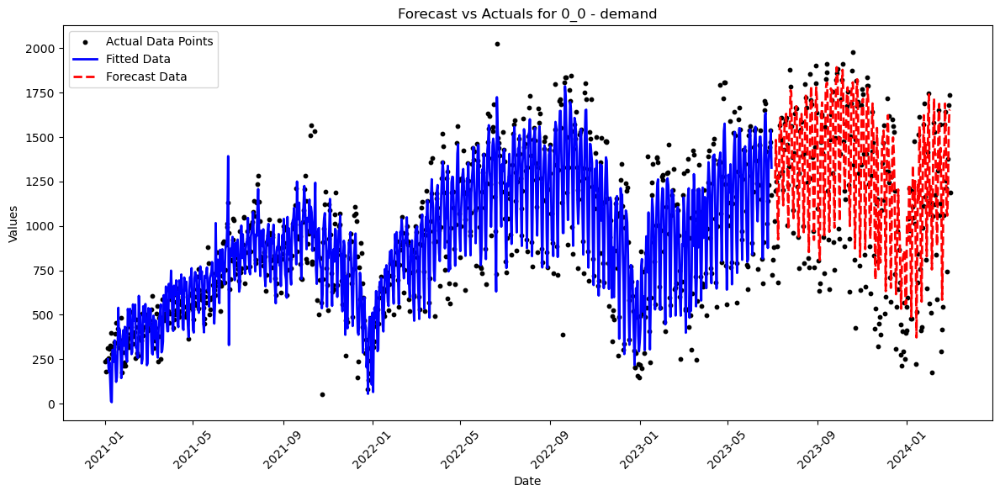

WARNING - (py.warnings._showwarnmsg) - /var/folders/p4/f02y3z810l530mmz7x833j3w0000gn/T/ipykernel_33554/3440670758.py:63: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  neuralprophet_fitted_df  = pd.concat([neuralprophet_fitted_df,

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 309.31it/s]


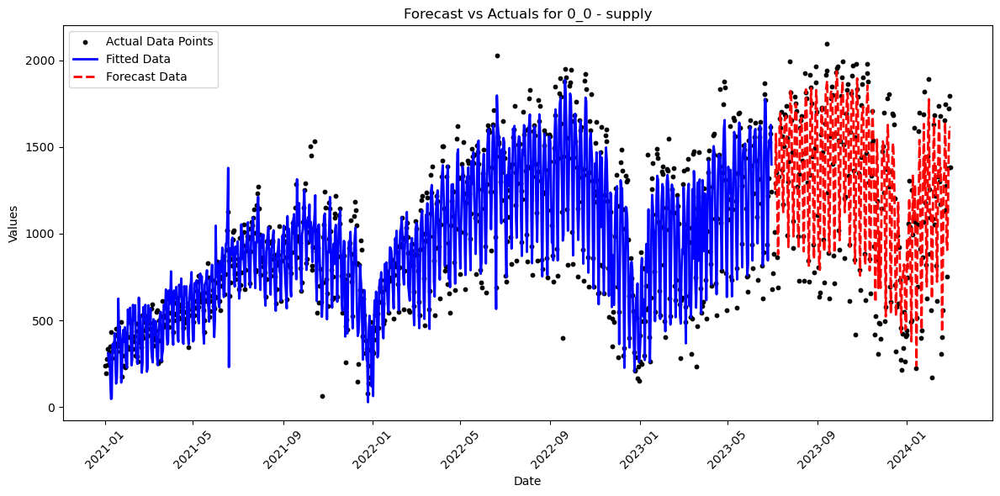

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 311.84it/s]


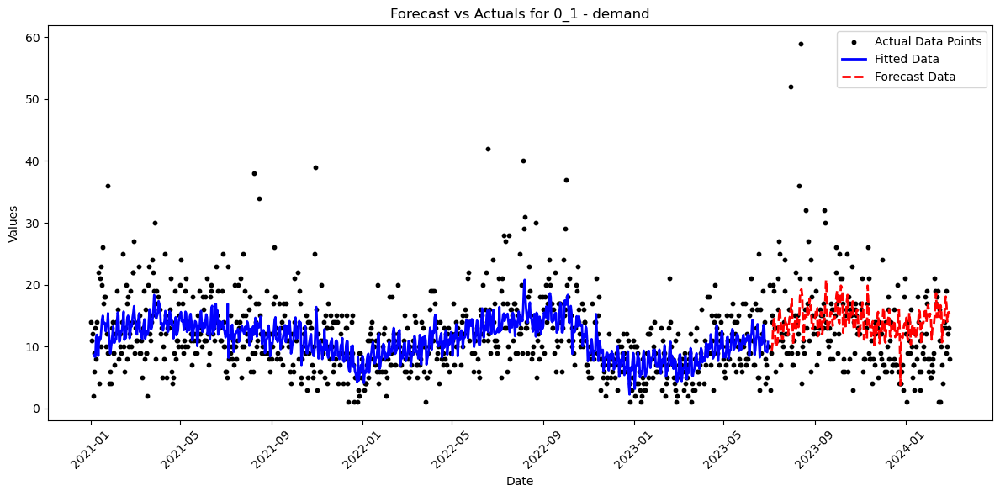

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 257.19it/s]


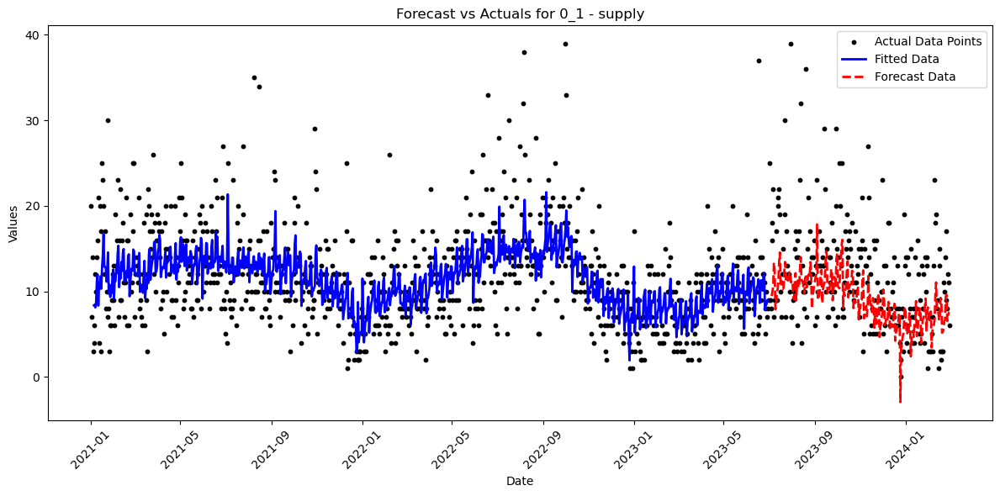

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 271.51it/s]


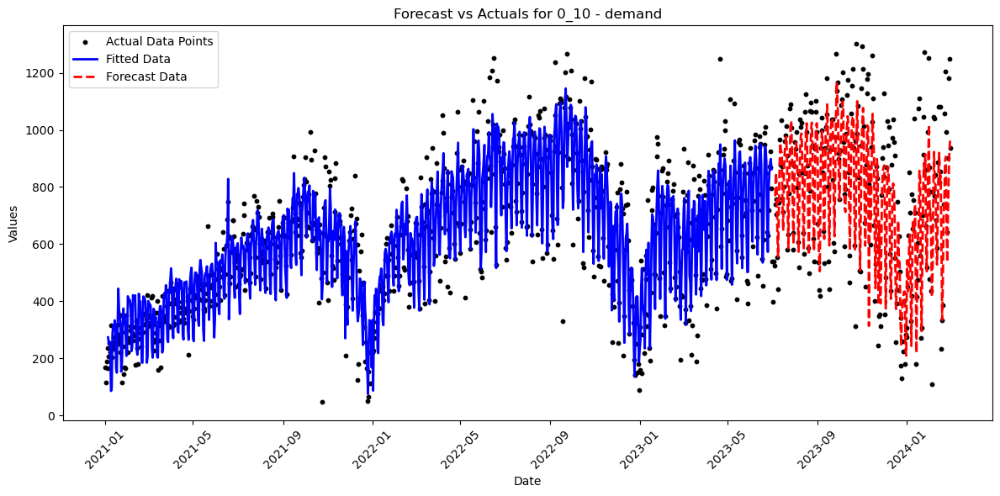

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 256.93it/s]


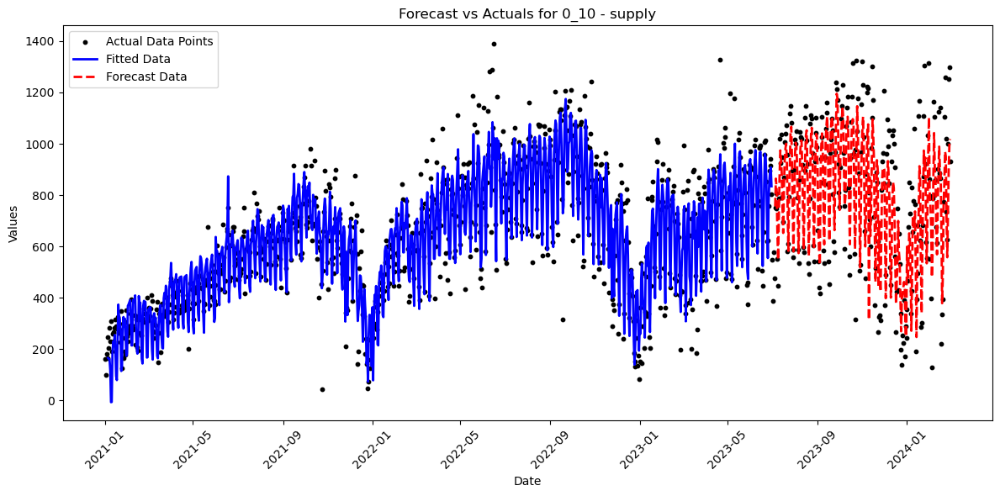

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 278.93it/s]


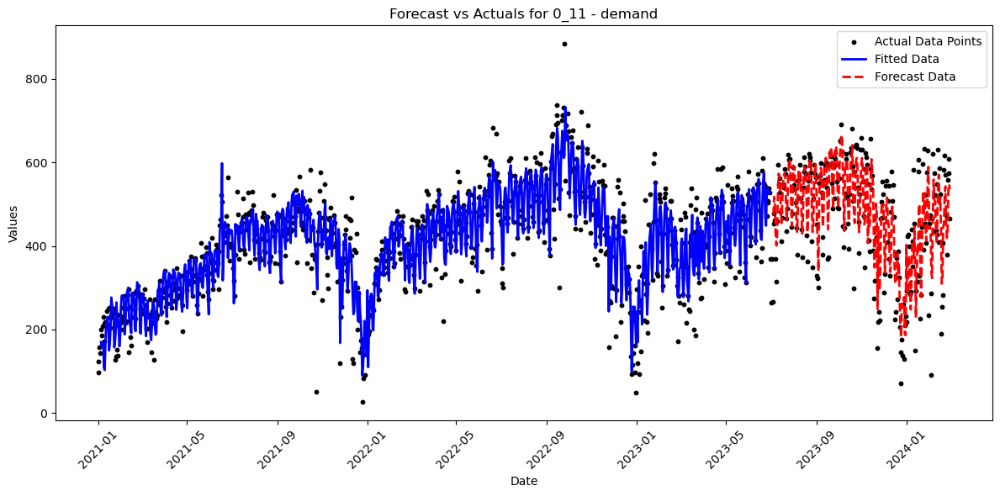

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 209.07it/s]


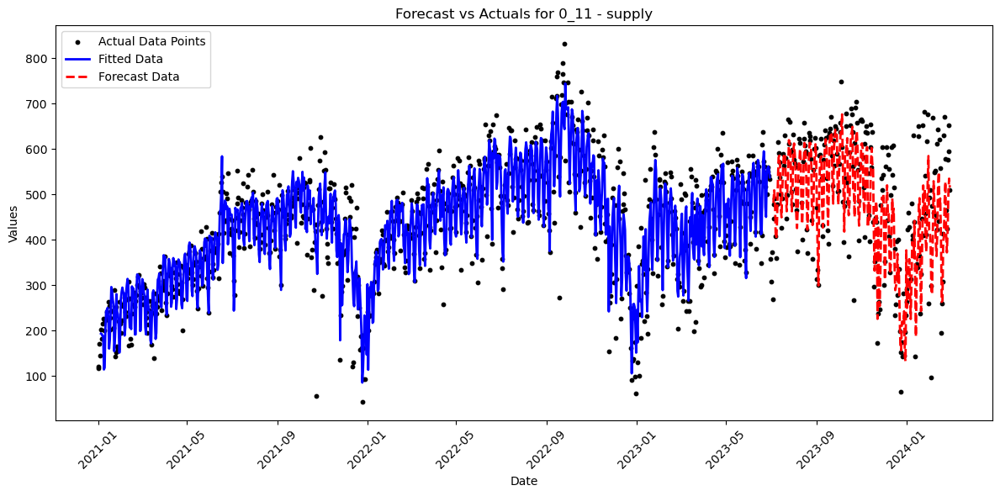

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 193.72it/s]


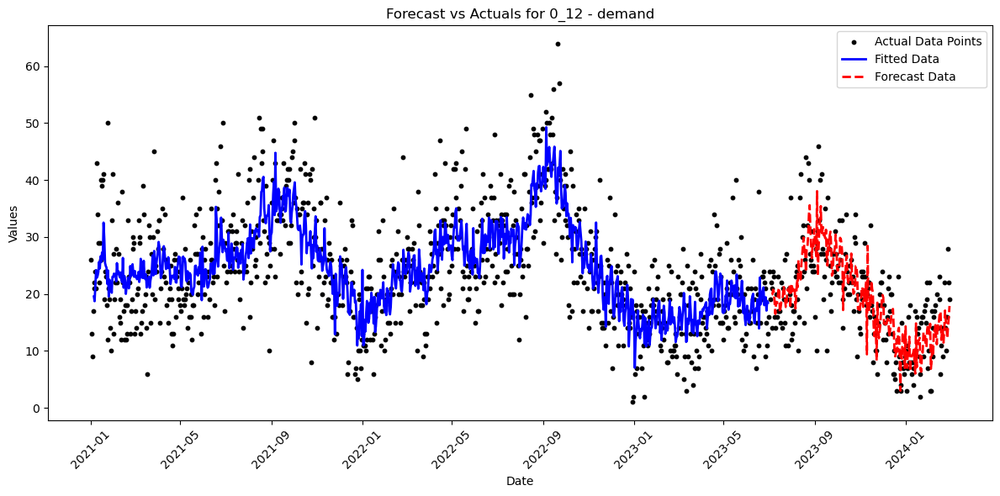

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 326.35it/s]


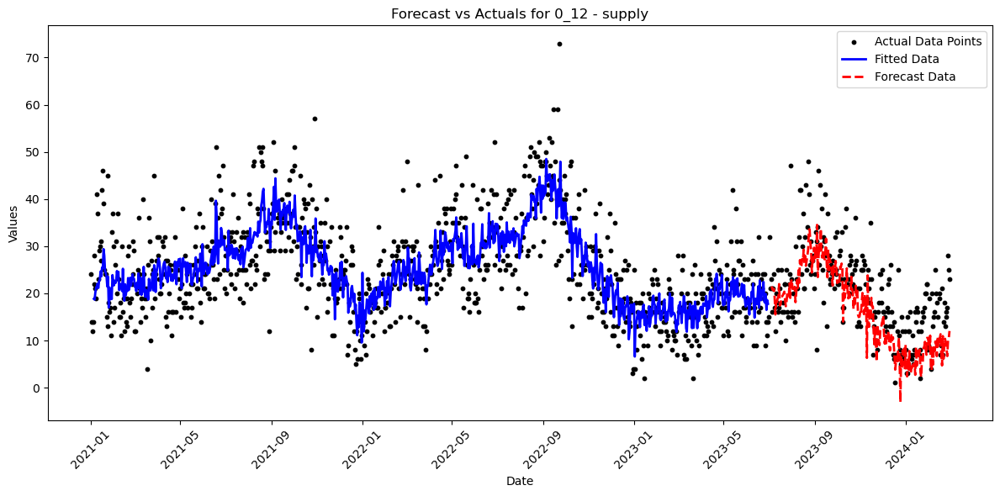

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 276.07it/s]


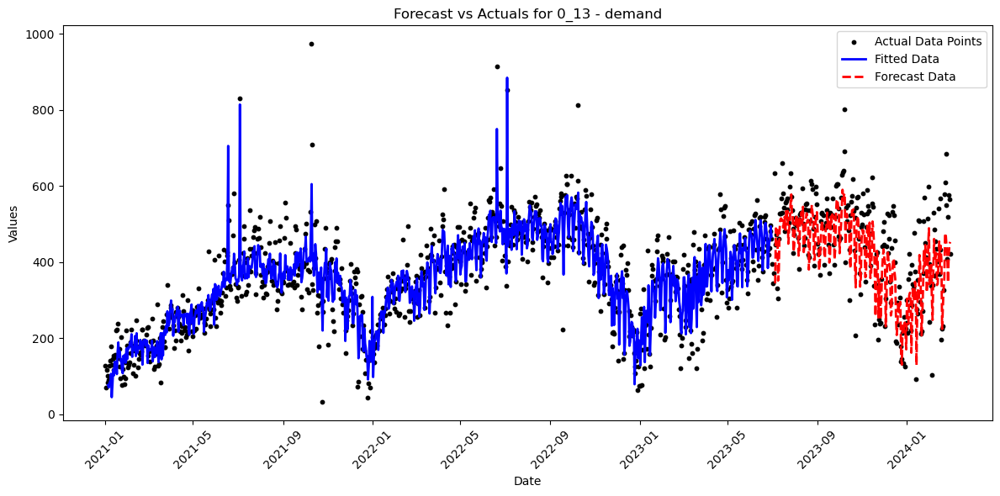

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 208.82it/s]


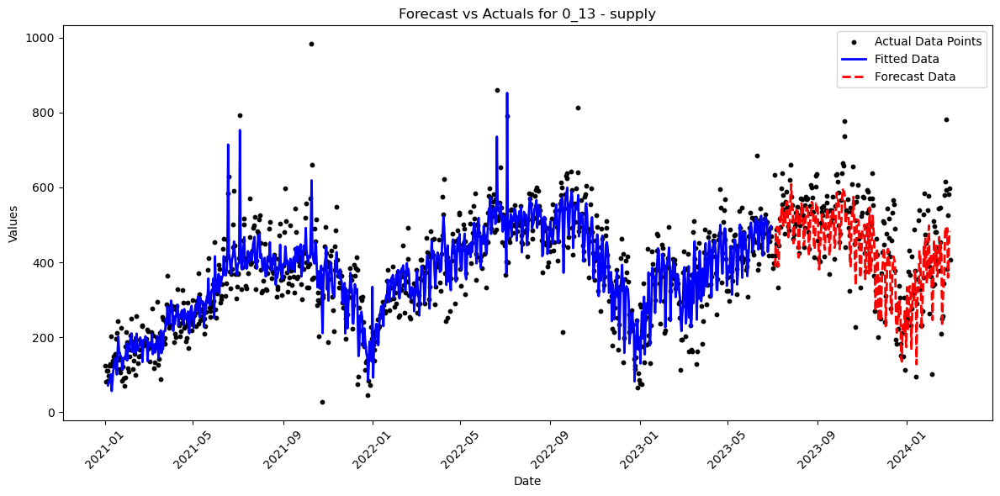

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 264.78it/s]


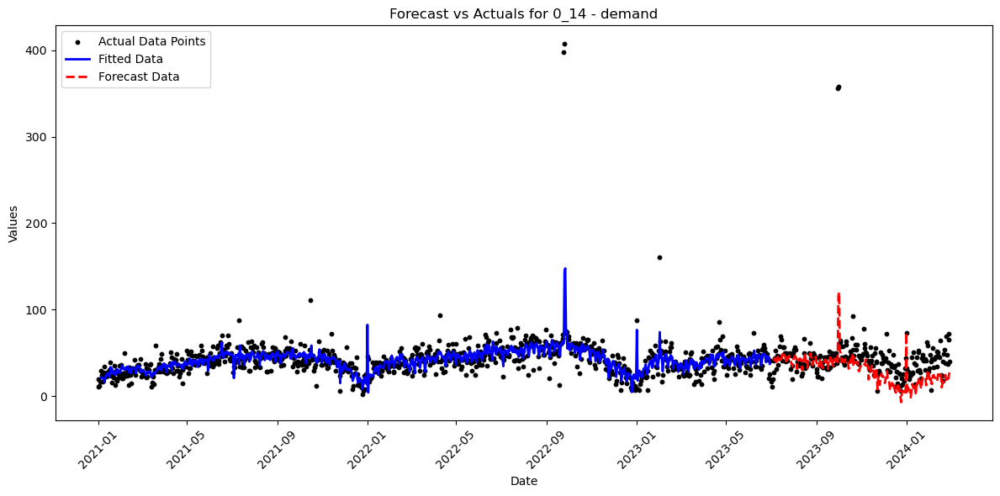

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 243.71it/s]


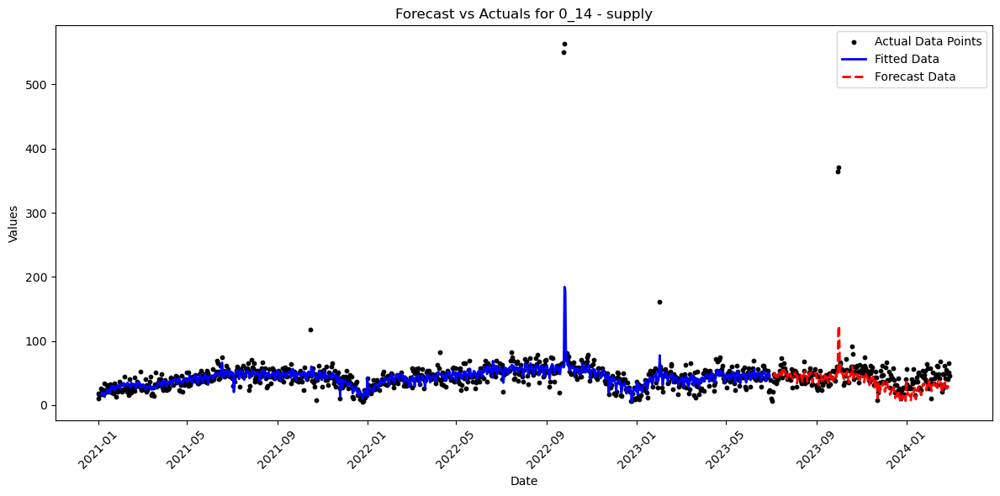

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 292.22it/s]


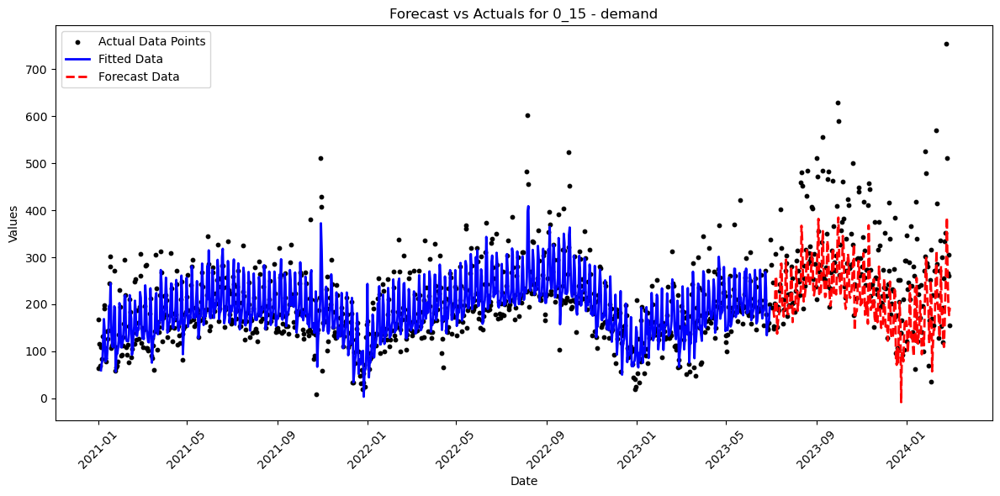

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 239.56it/s]


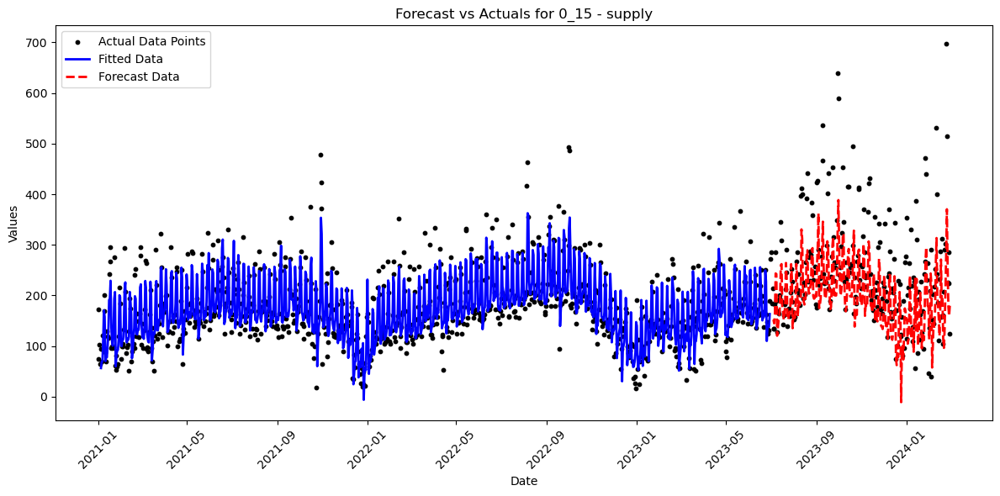

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 185.56it/s]


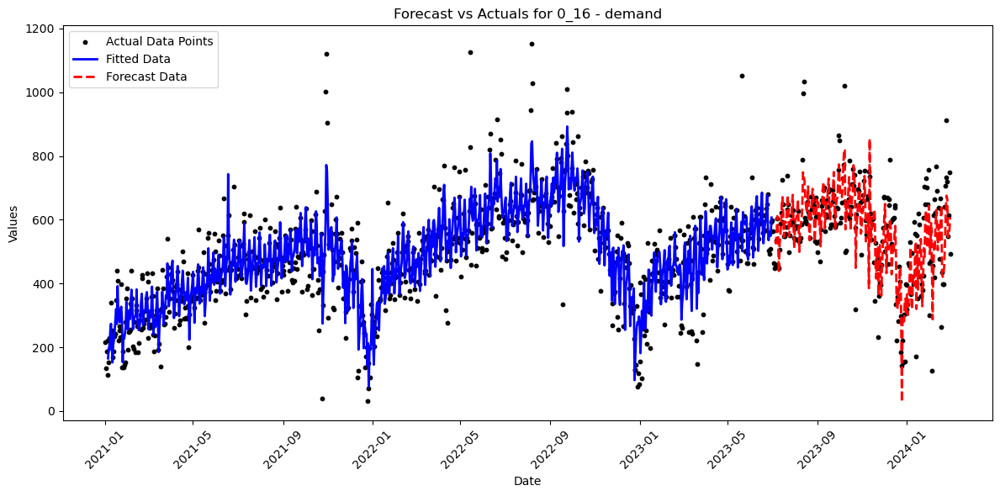

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 236.29it/s]


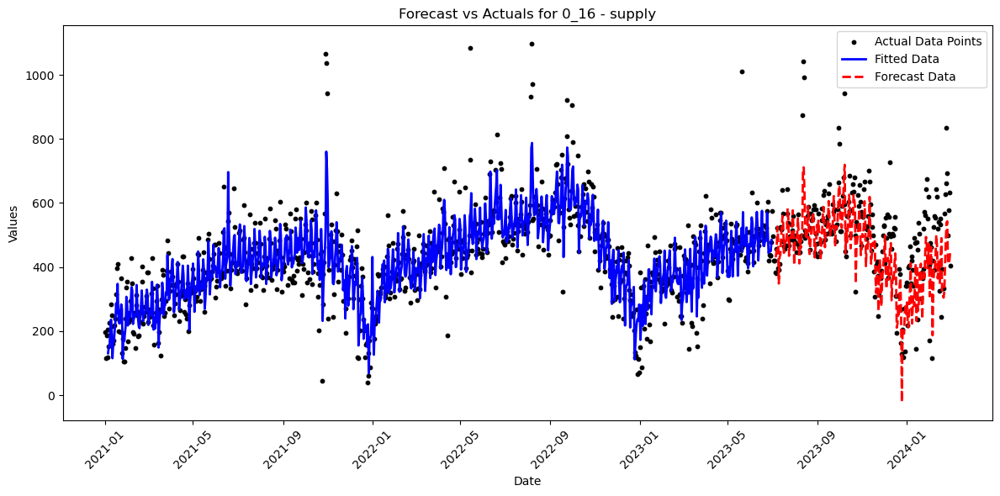

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 278.38it/s]


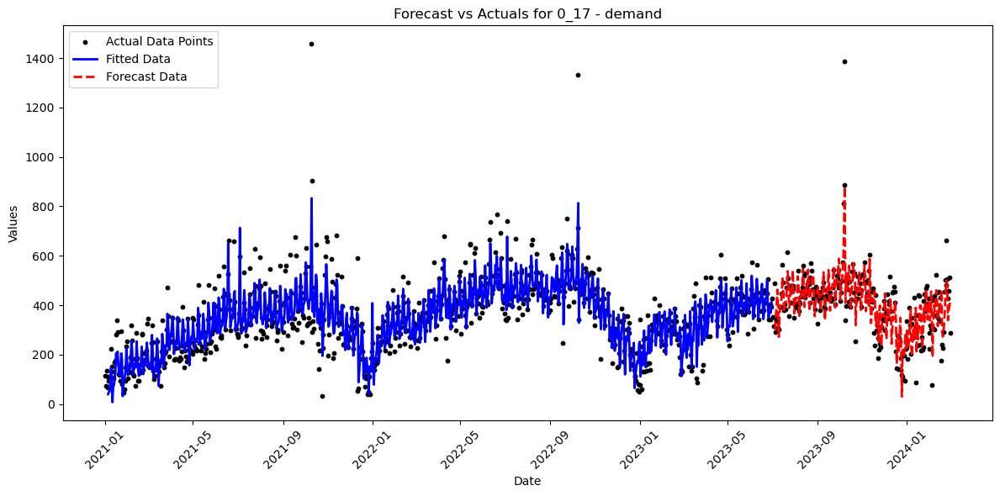

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 251.94it/s]


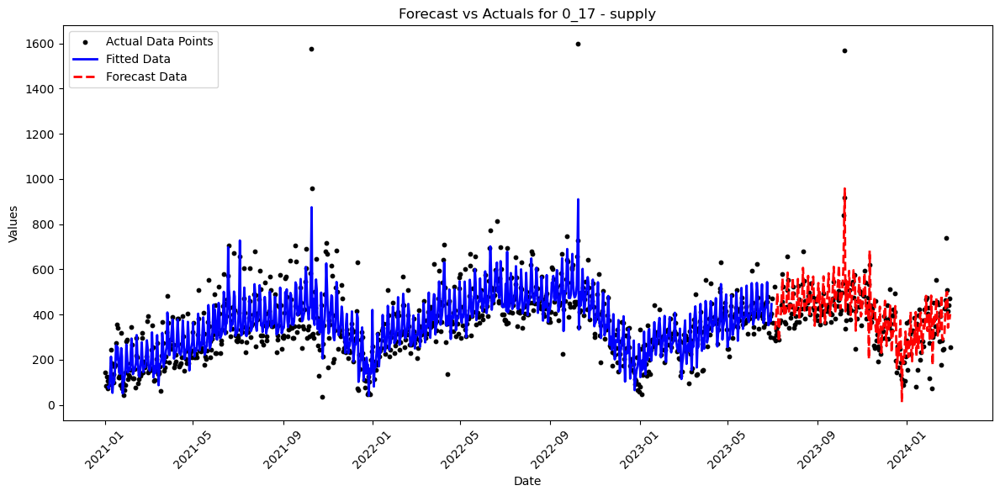

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 318.76it/s]


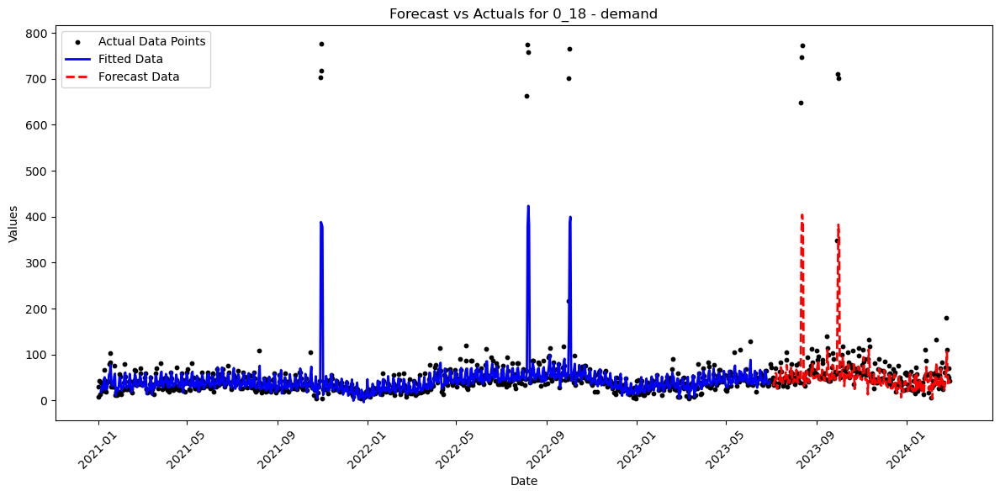

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 273.98it/s]


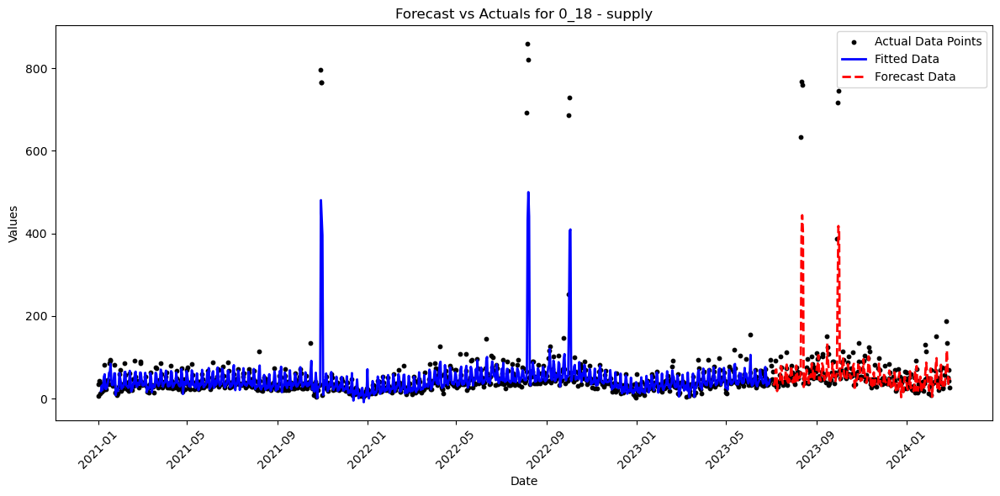

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 249.96it/s]


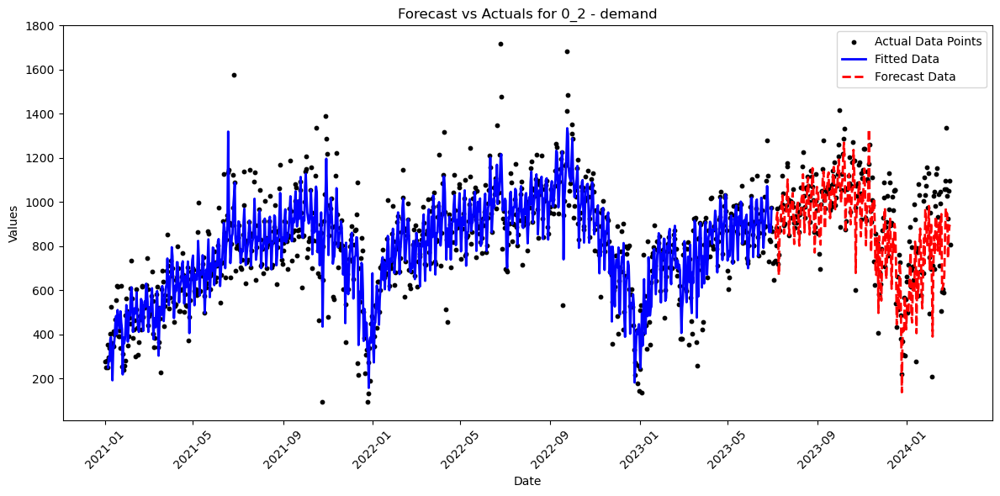

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 266.61it/s]


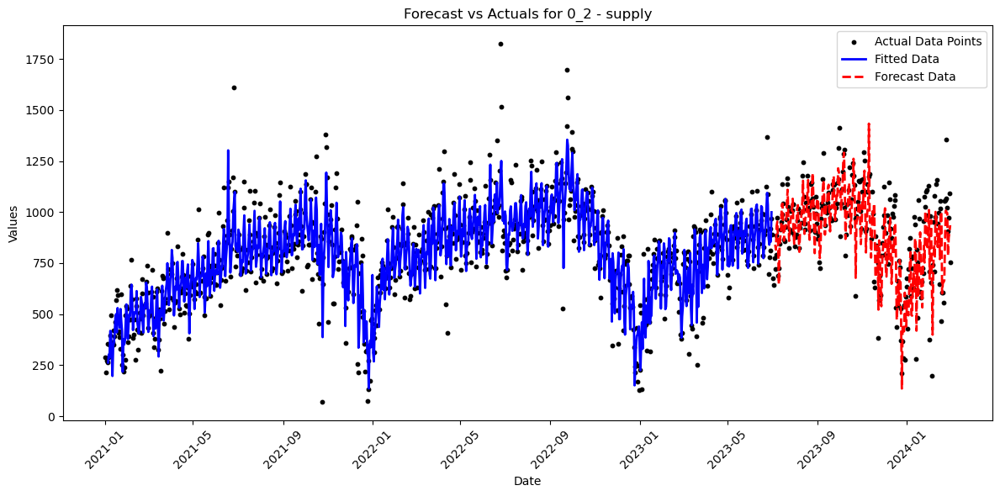

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 197.43it/s]


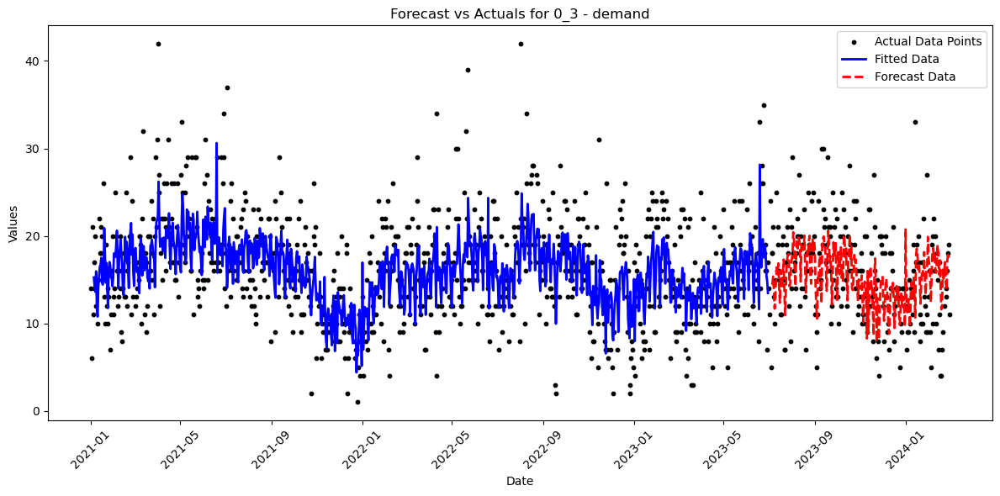

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 228.57it/s]


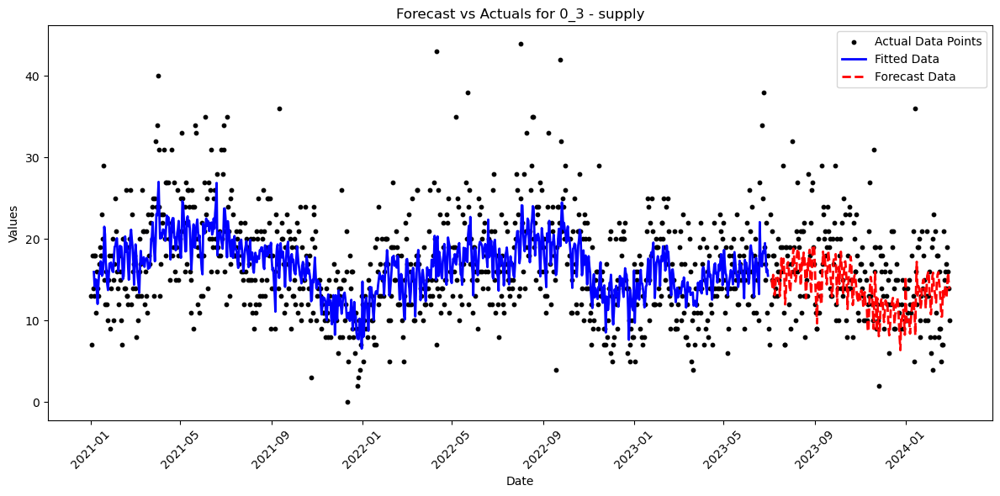

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 203.25it/s]


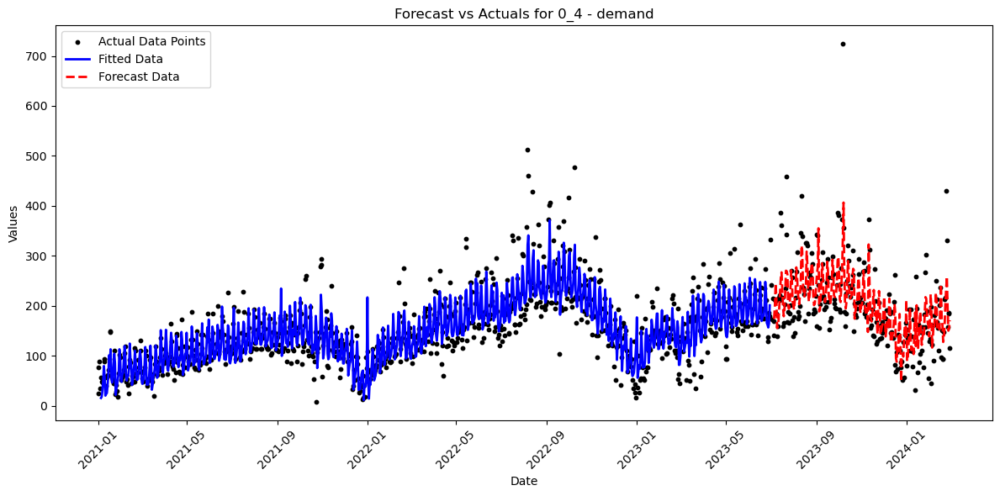

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 311.82it/s]


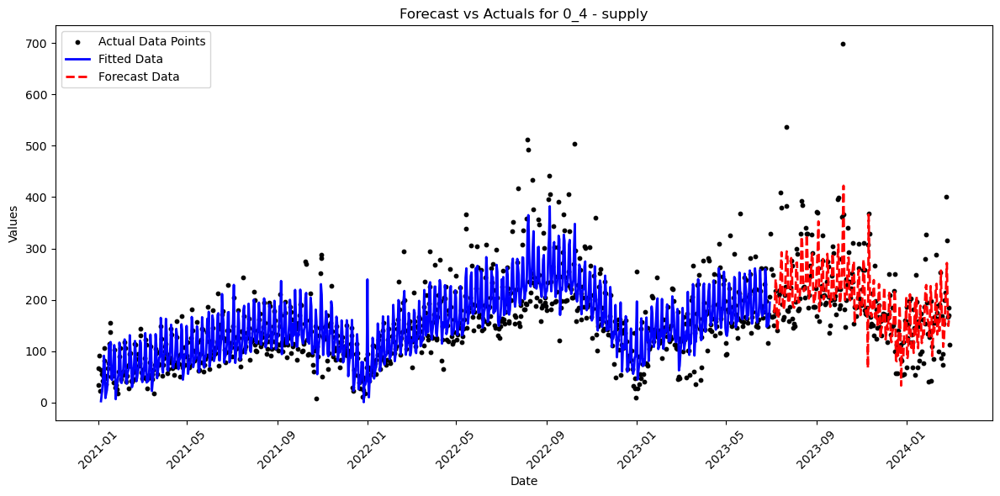

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 230.37it/s]


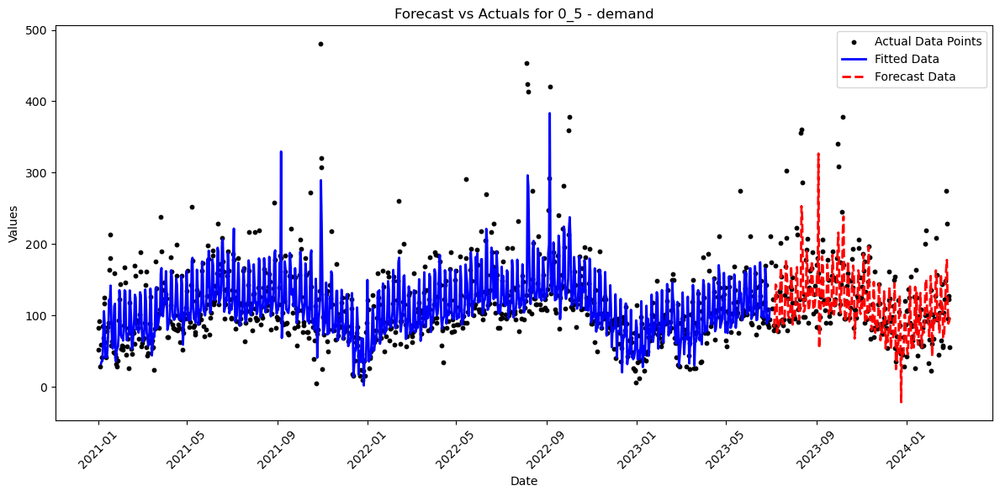

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 205.59it/s]


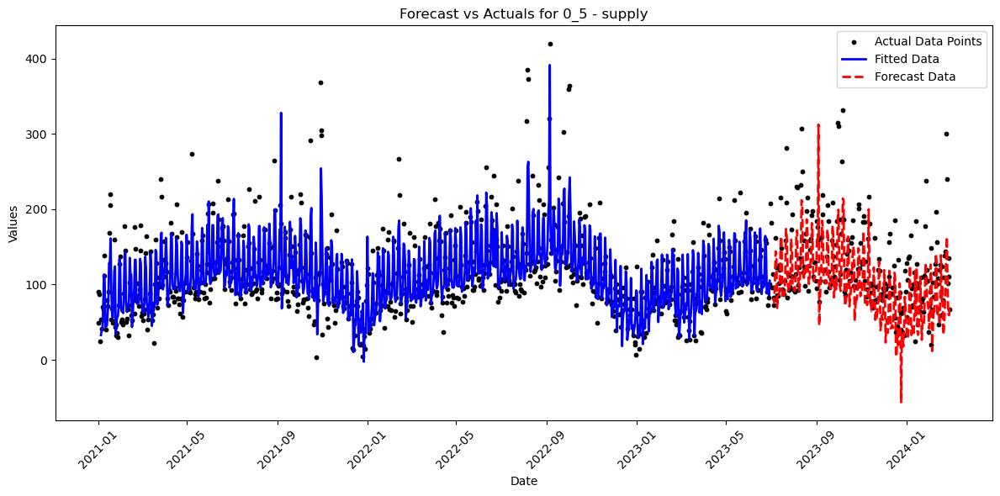

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 167.45it/s]


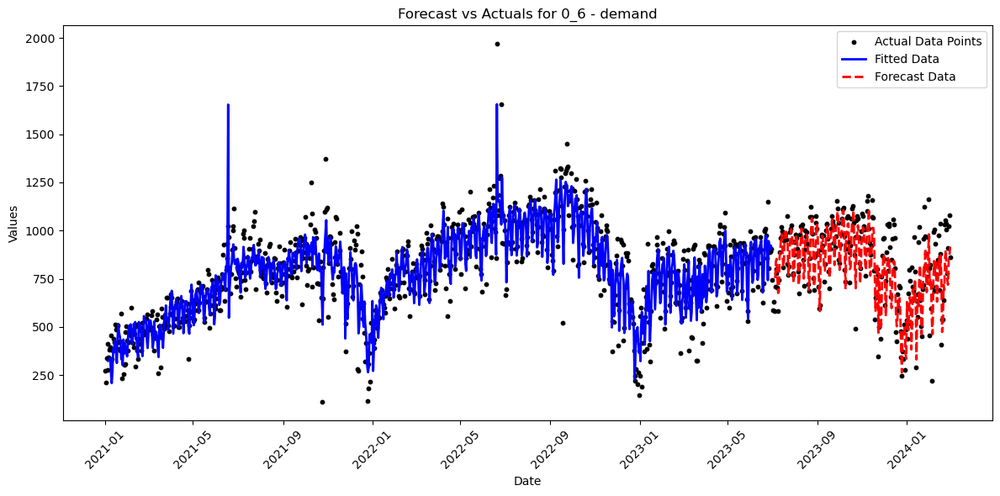

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 263.66it/s]


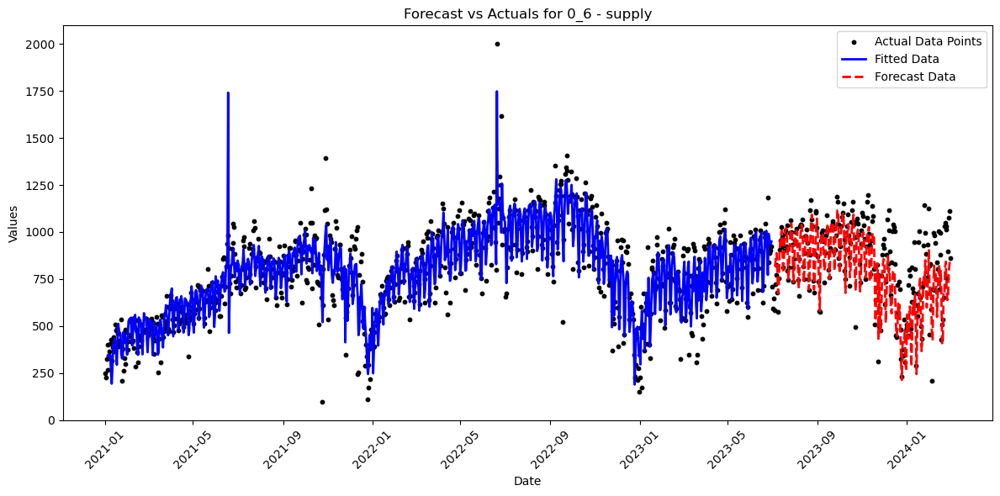

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 298.93it/s]


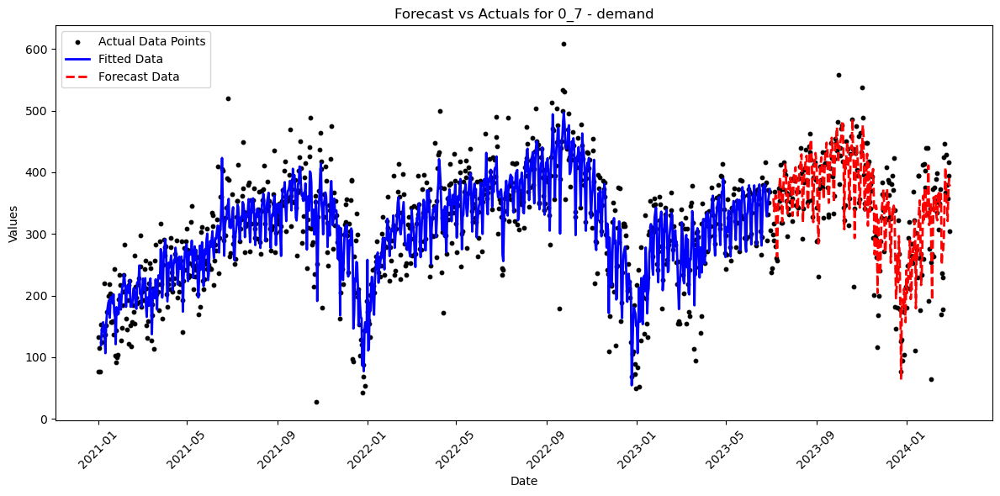

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 262.28it/s]


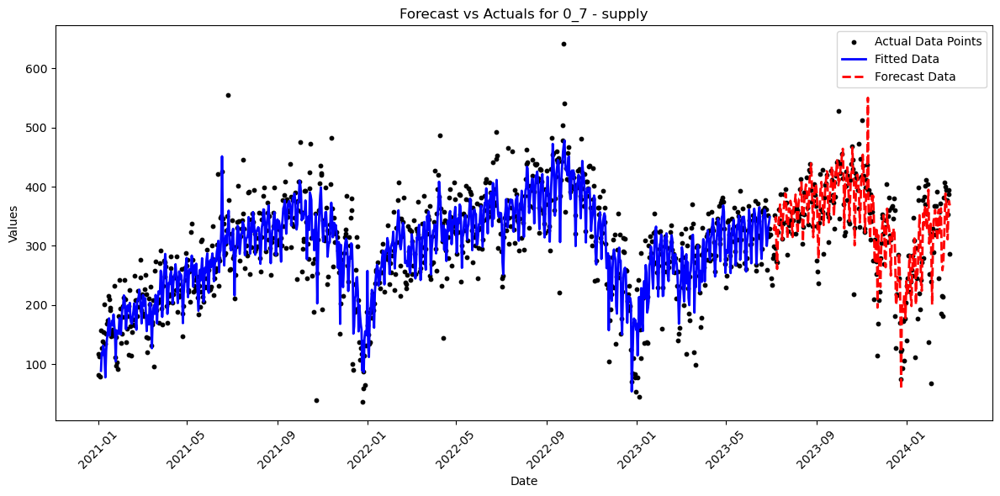

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 220.66it/s]


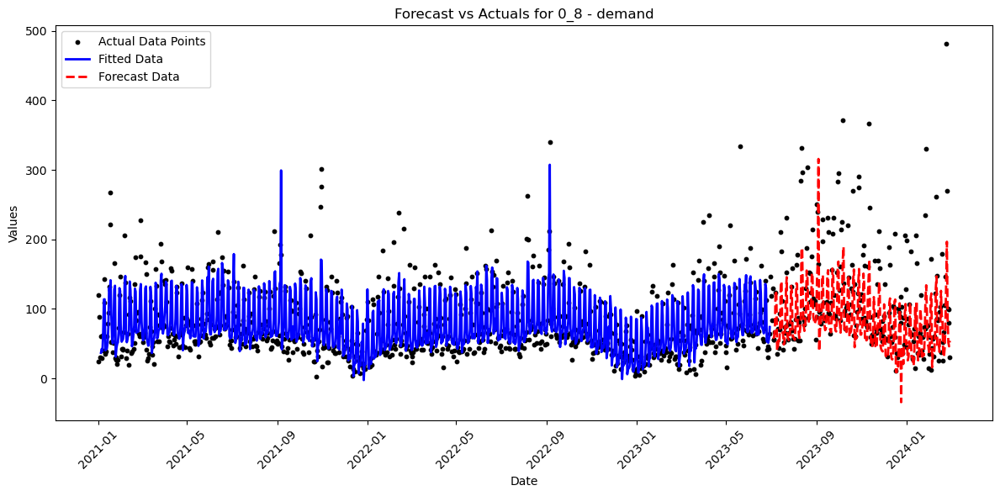

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 273.16it/s]


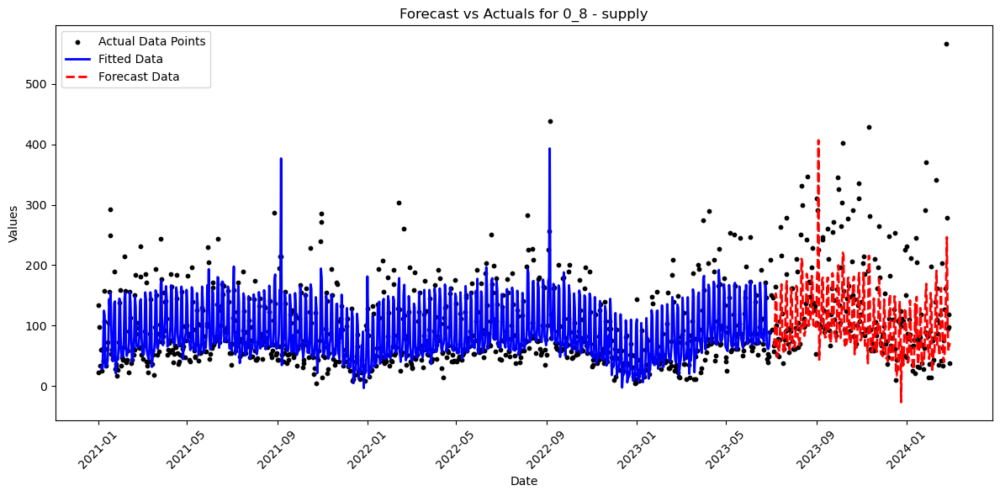

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 279.64it/s]


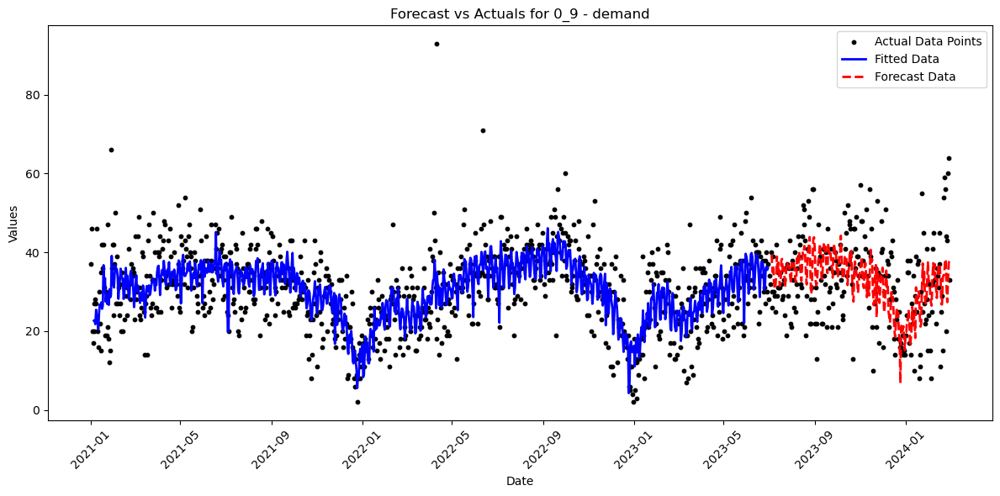

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 278.95it/s]


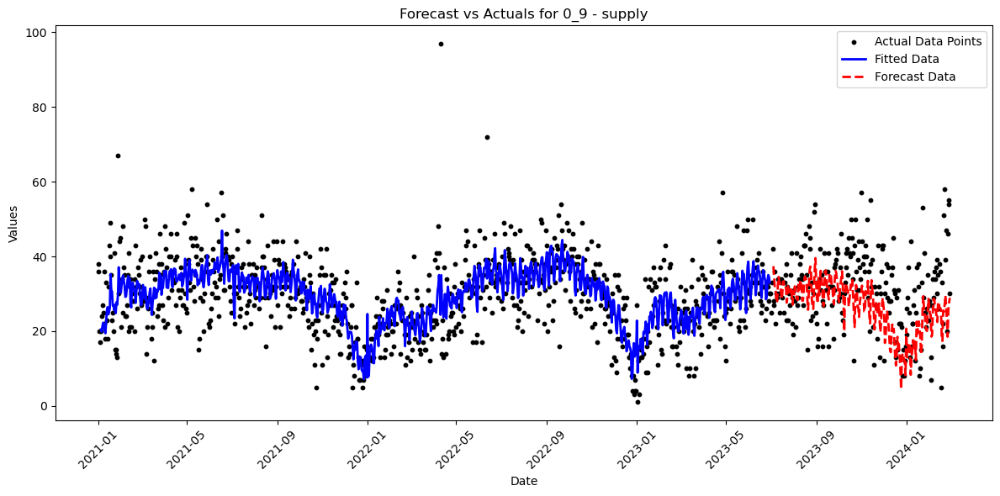

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 312.40it/s]


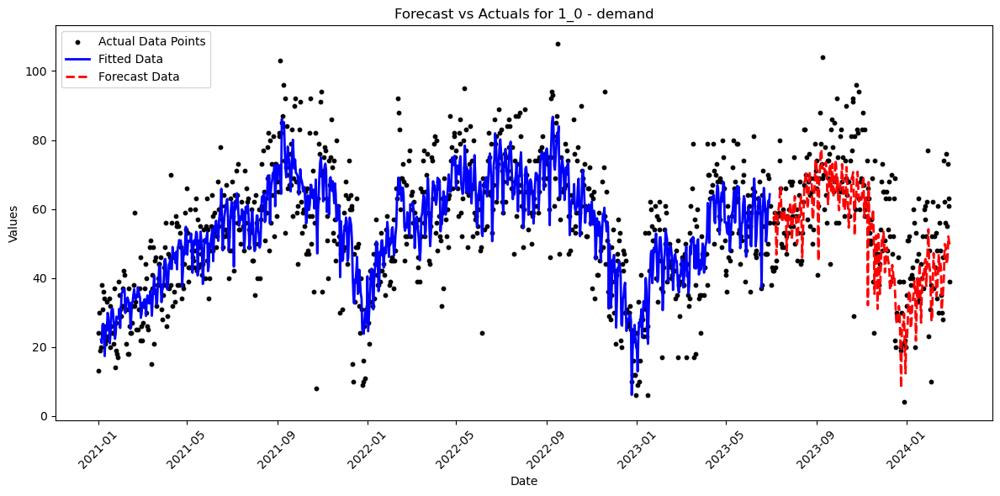

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 226.56it/s]


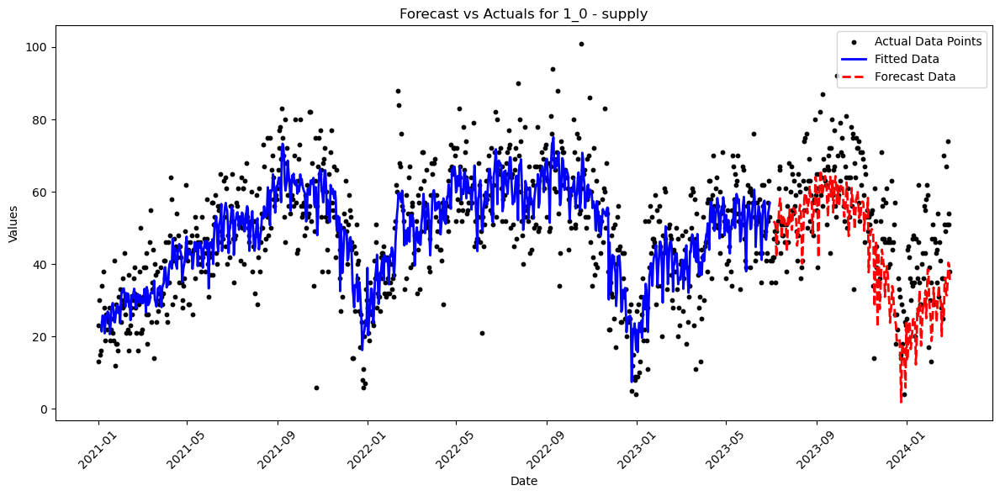

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 218.58it/s]


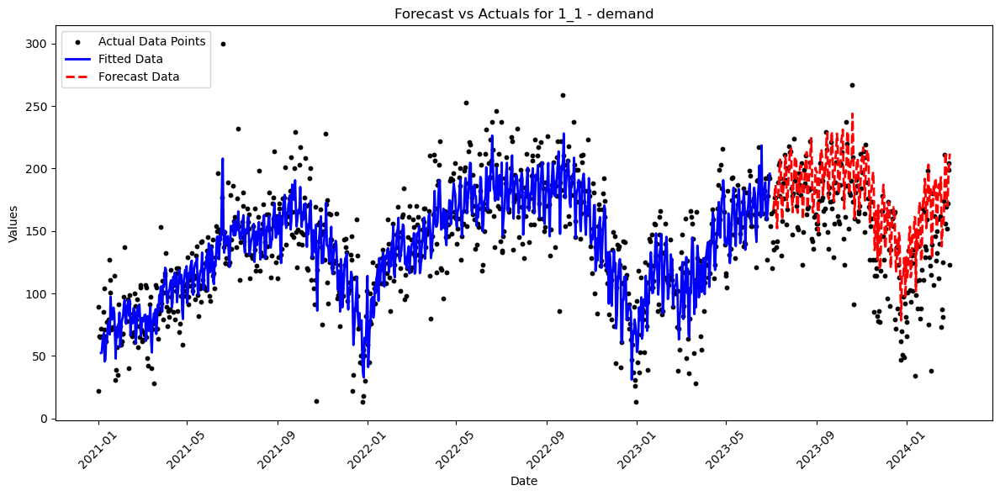

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 249.51it/s]


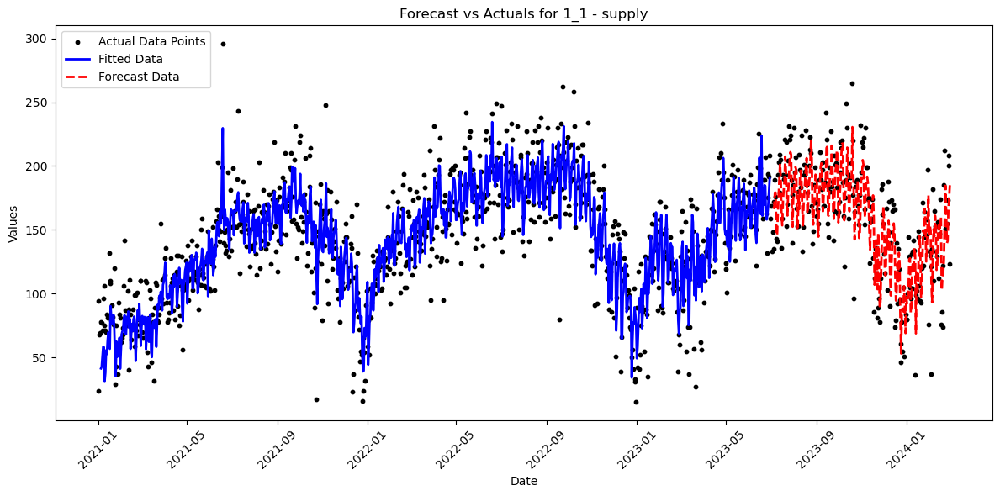

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 223.11it/s]


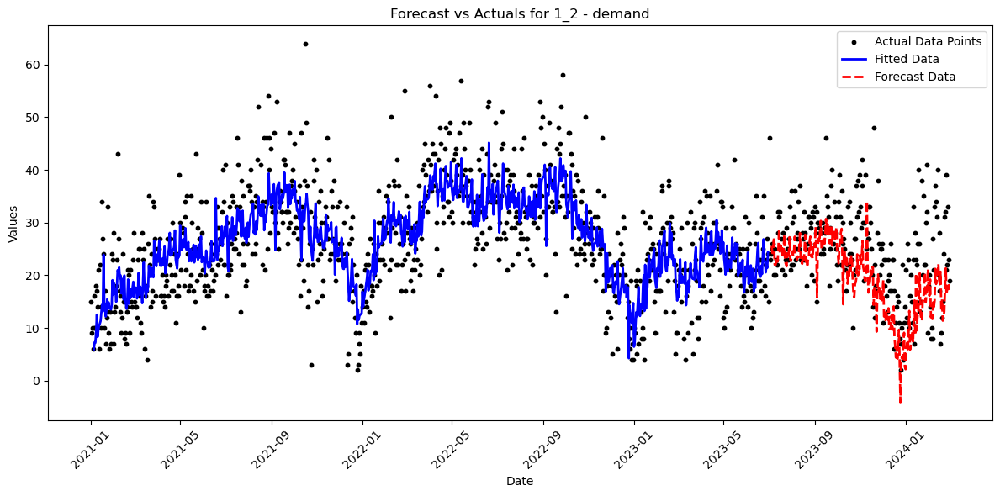

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 236.02it/s]


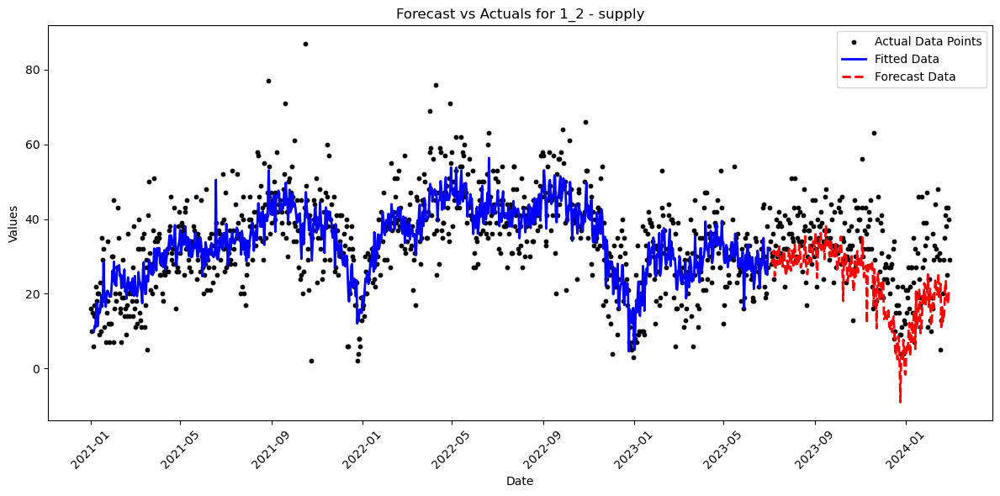

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 242.61it/s]


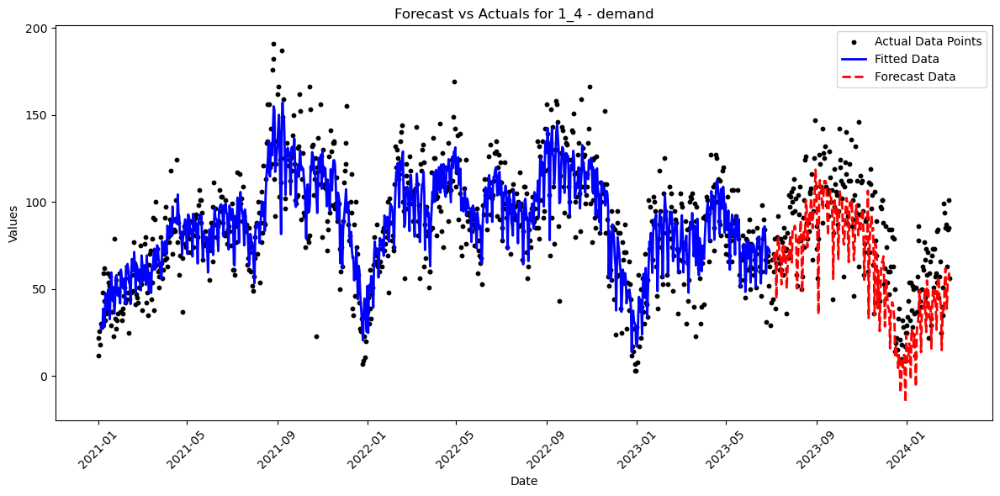

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 295.96it/s]


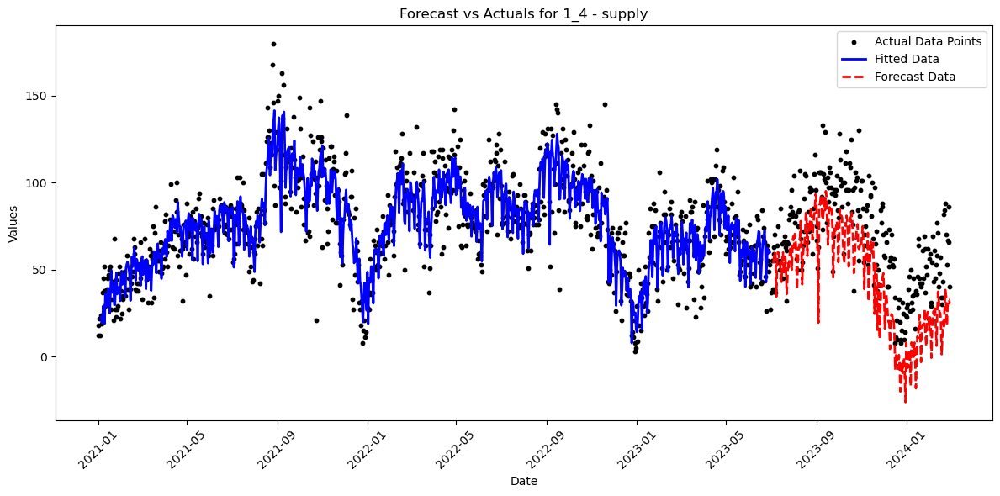

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 208.24it/s]


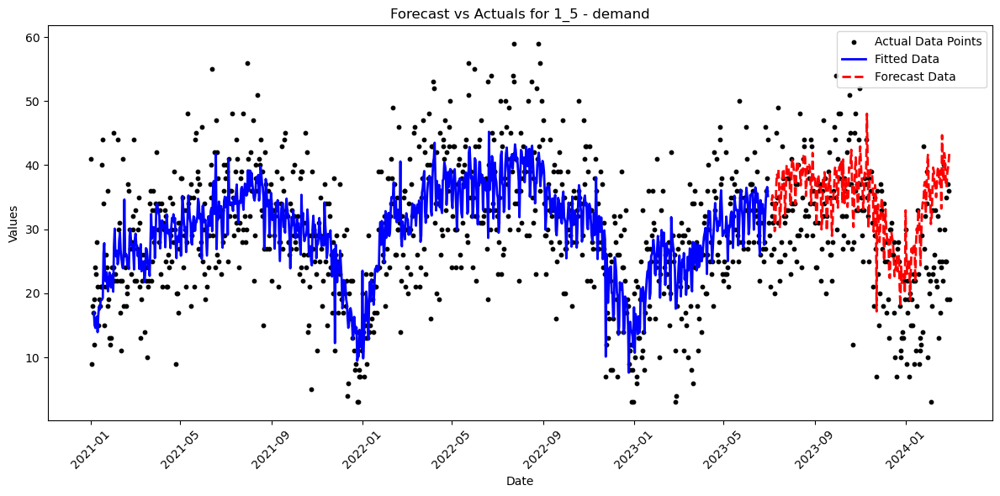

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 326.91it/s]


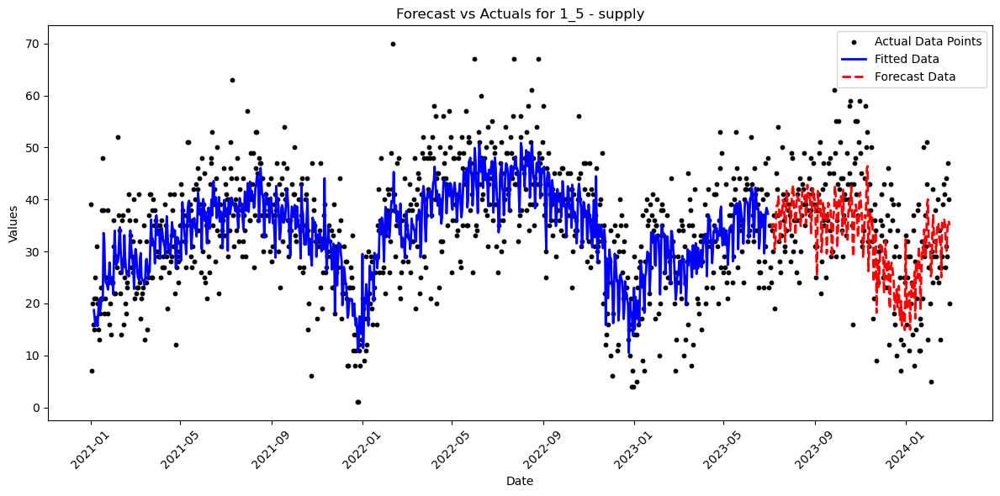

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 244.98it/s]


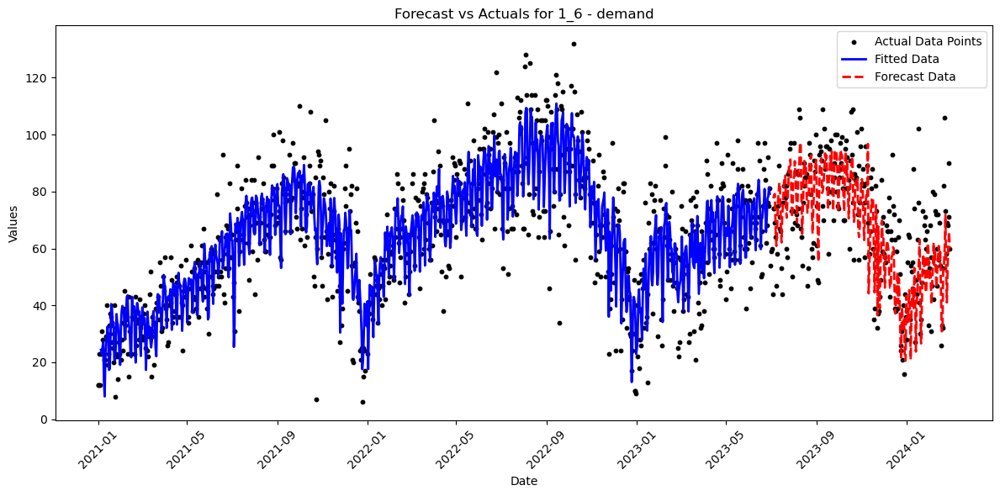

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 274.19it/s]


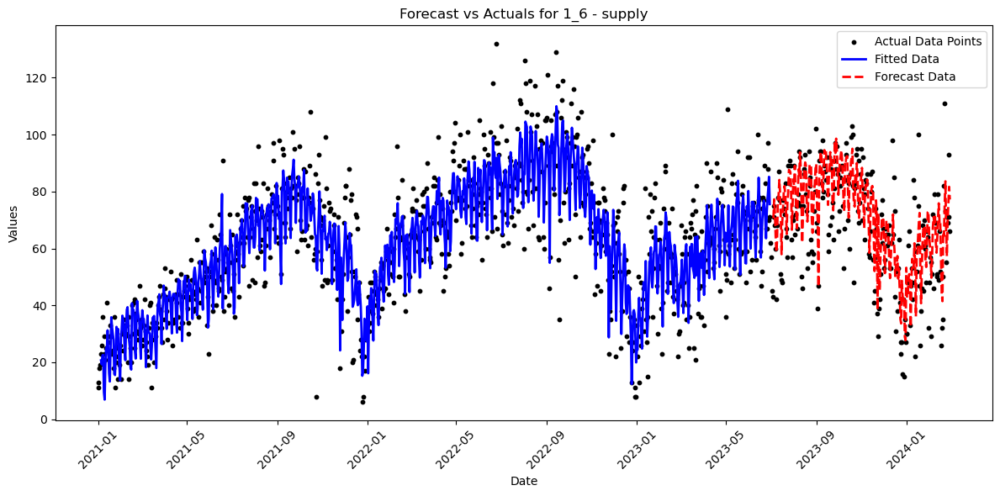

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 247.89it/s]


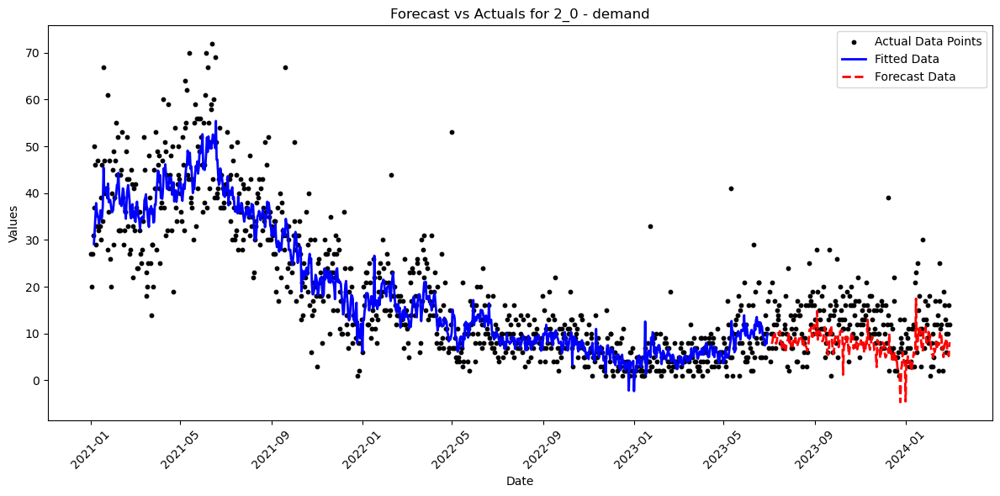

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 273.10it/s]


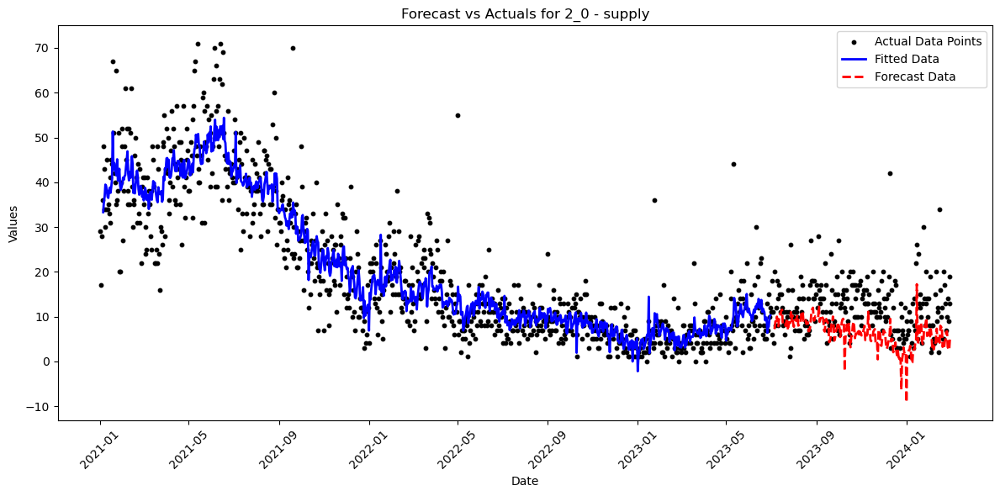

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 246.13it/s]


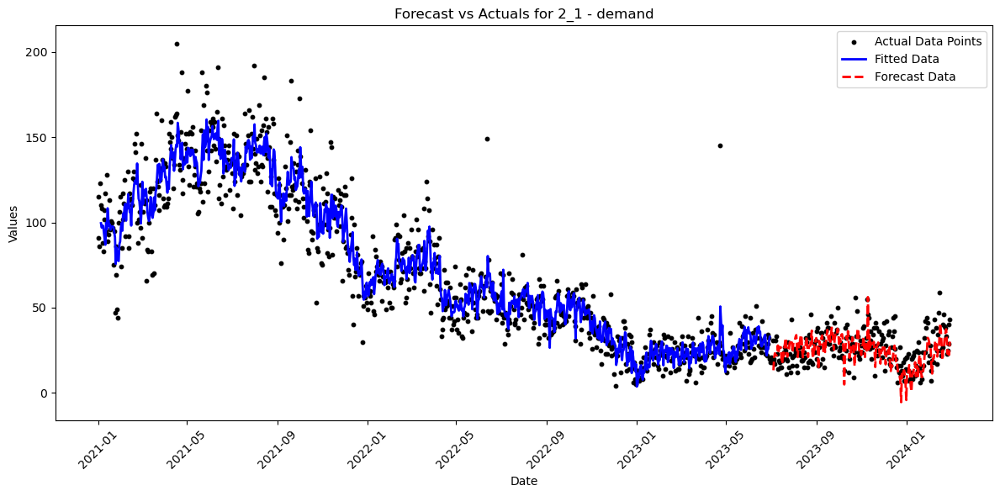

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 244.68it/s]


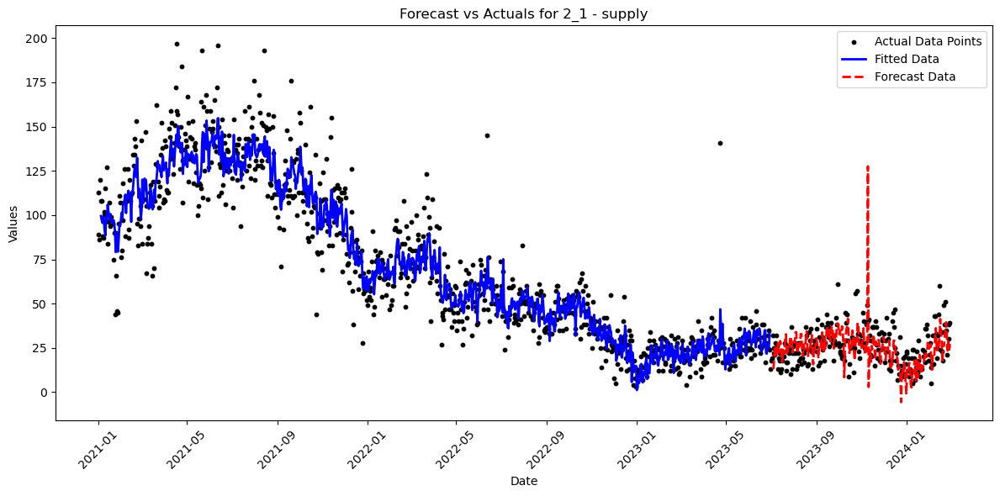

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 306.67it/s]


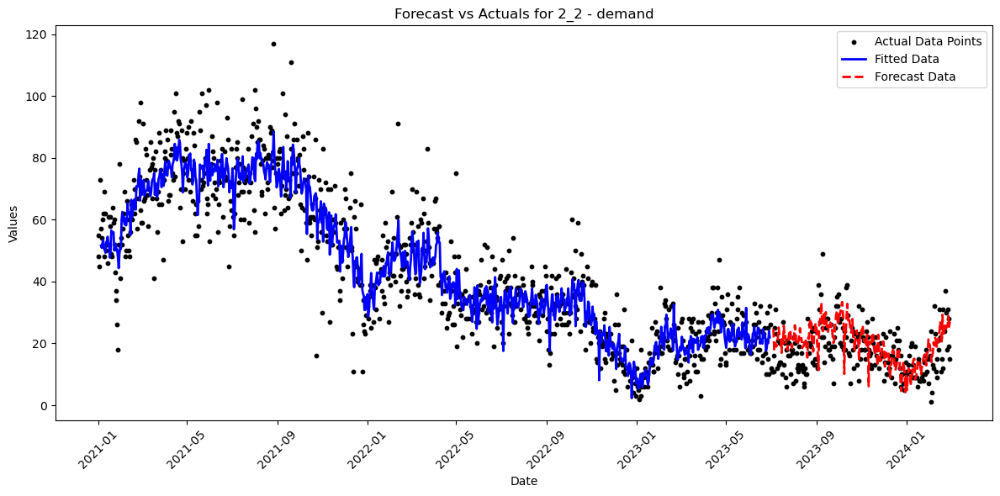

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 284.24it/s]


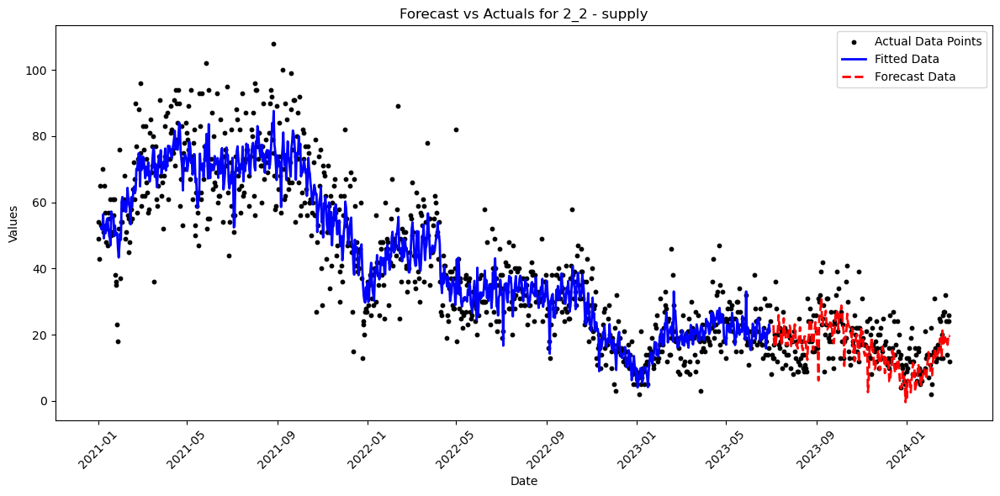

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 222.82it/s]


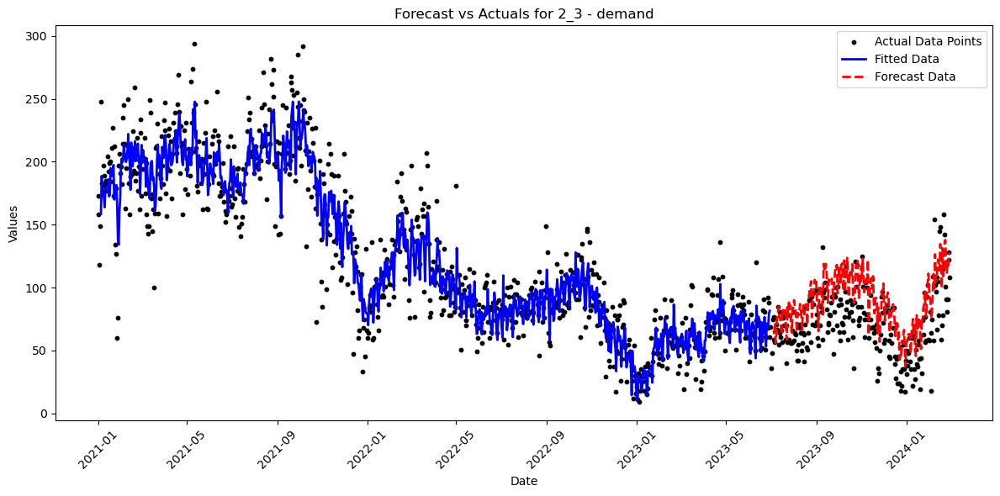

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 228.36it/s]


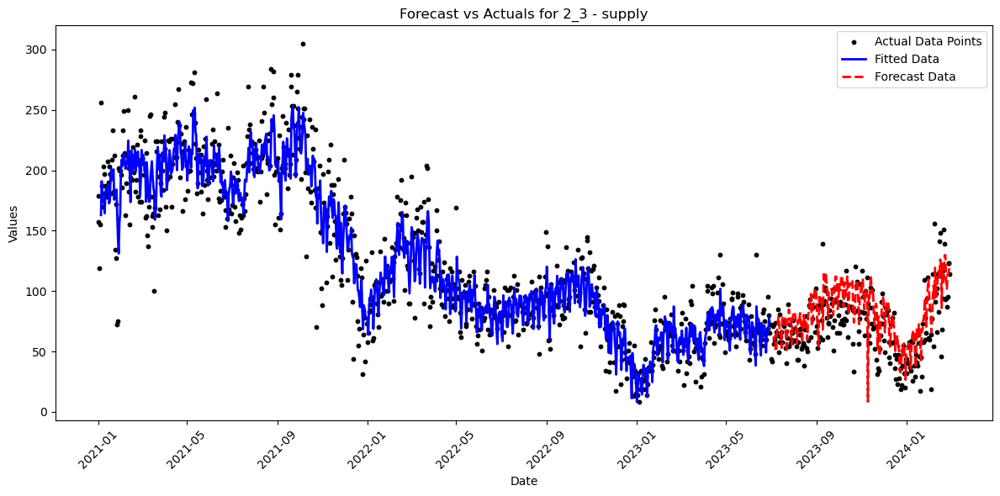

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 229.36it/s]


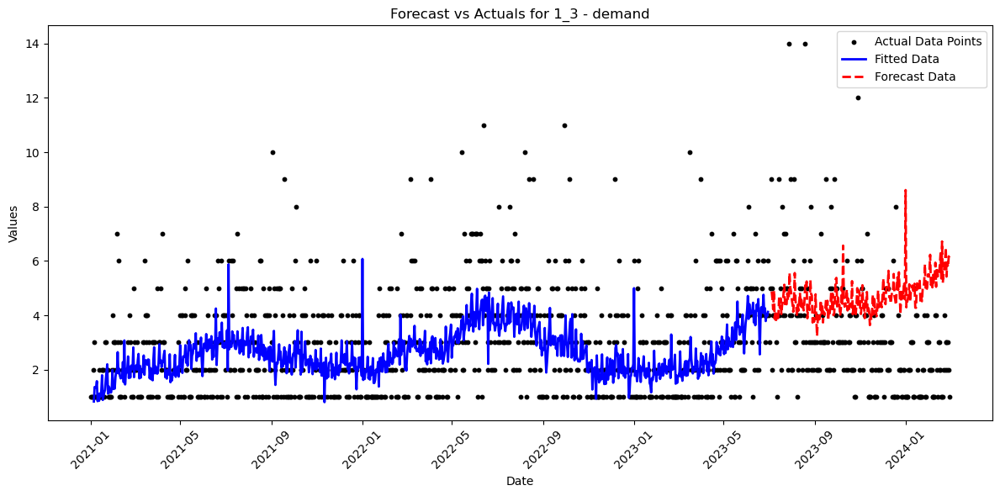

WARNING - (py.warnings._showwarnmsg) - /Users/erfanhajibandeh/anaconda3/envs/general/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 279.56it/s]


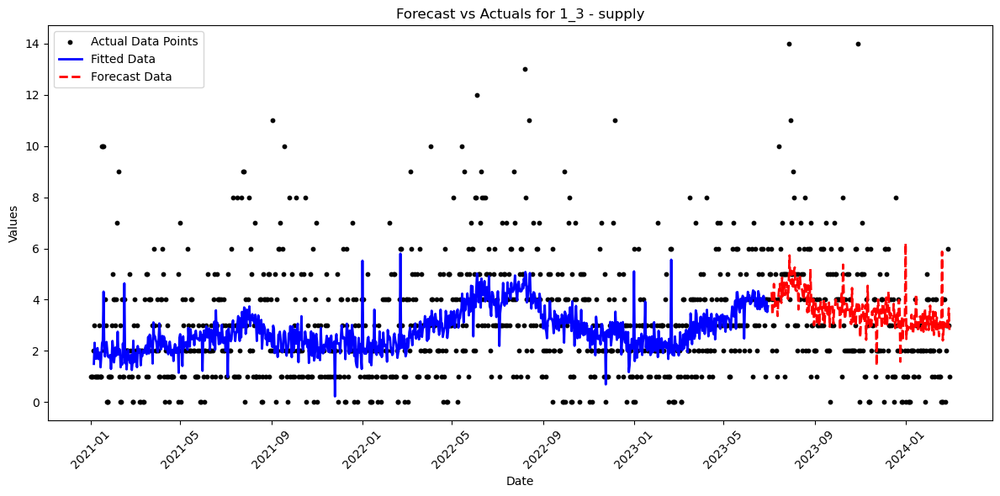

In [85]:
set_log_level("ERROR")
warnings.filterwarnings(action='ignore', category=FutureWarning, module='pandas.*')
warnings.filterwarnings(action='ignore', category=FutureWarning, module='neuralprophet.*')

cut_off_date = '2023-07-01'
all_metrics = []
neuralprophet_fitted_df = pd.DataFrame(columns=['cluster_id', 'target', 'ds', 'yhat'])
cluster_ids = df['cluster_id'].unique()

for cluster_id in cluster_ids:
    for target in ['demand', 'supply']:
        cluster_data = df[df['cluster_id'] == cluster_id].copy()
        cluster_data['ds'] = pd.to_datetime(cluster_data['date'])
        cluster_data.rename(columns={target: 'y'}, inplace=True)
        cluster_data = cluster_data[['ds','y','temperature']]
        train = cluster_data[cluster_data['ds'] < pd.to_datetime(cut_off_date)]
        test = cluster_data[cluster_data['ds'] >= pd.to_datetime(cut_off_date)]
        number_of_lags = 4
        model = NeuralProphet(
                changepoints_range=0.975,
                seasonality_mode='additive',
                learning_rate=0.3,
                n_lags = number_of_lags,
                epochs=50,  
                batch_size=32, 
        )
        
        model.add_lagged_regressor(names='temperature')
        model.add_country_holidays('US')

        model.fit(train, freq='D')
        fitted = model.predict(train)
    
        forecast = model.predict(test)
        actuals = test['y'].iloc[number_of_lags:].reset_index(drop=True)
        predictions = forecast['yhat1'].iloc[number_of_lags:].reset_index(drop=True)

        plt.figure(figsize=(12, 6))
        plt.scatter(train['ds'], train['y'], color='black', label='Actual Data Points', s=10)
        plt.scatter(test['ds'], test['y'], color='black', s=10)
        plt.plot(fitted['ds'], fitted['yhat1'], color='blue', label='Fitted Data', linewidth=2)
        plt.plot(forecast['ds'], forecast['yhat1'], color='red', label='Forecast Data', linewidth=2, linestyle='--')
        plt.title(f'Forecast vs Actuals for {cluster_id} - {target}')
        plt.xlabel('Date')
        plt.ylabel('Values')
        plt.legend()
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

        mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
        mae = mean_absolute_error(actuals, predictions)
        rmse = np.sqrt(mean_squared_error(actuals, predictions))

        all_metrics.append({
            'cluster_id': cluster_id,
            'target': target,
            'MAPE': mape,
            'MAE': mae,
            'RMSE': rmse
        })
        forecast.iloc[:number_of_lags, forecast.columns.get_loc('yhat1')] = test['y'].iloc[:number_of_lags].values
        neuralprophet_fitted_df  = pd.concat([neuralprophet_fitted_df,
            pd.DataFrame({
                'cluster_id': cluster_id,
                'target': target,
                'ds': forecast['ds'],
                'yhat': forecast['yhat1']
            })], ignore_index=True)
        
neuralprophet_metrics_df = pd.DataFrame(all_metrics)


In [86]:
neuralprophet_metrics_df.head()

,cluster_id,target,MAPE,MAE,RMSE
0,0_0,demand,29.497285,202.825295,266.487062
1,0_0,supply,24.941032,195.631400,248.083211
2,0_1,demand,71.659539,5.010050,6.977966
3,0_1,supply,inf,4.811720,6.350685
4,0_10,demand,21.555938,129.987113,165.047766


## Creating an ensemble of Prophet and Neural Prophet

To evaluate the ensemble perfromace of the two models, the fitted data from both models were averaged together for each cluster and for both supply and demand, and the metrics were calcualted for the ensemble model.

In [87]:
ensemble_fitted_df = pd.DataFrame()
ensemble_fitted_df[['cluster_id','target','ds']] = prophet_fitted_df[['cluster_id','target','ds']]
ensemble_fitted_df['yhat'] = (prophet_fitted_df['yhat'] + neuralprophet_fitted_df['yhat'])/2

In [88]:
cluster_ids = df['cluster_id'].unique()
all_metrics = []
cut_off_date = '2023-07-01'

for cluster_id in cluster_ids:
    for target in ['demand', 'supply']:
        cluster_data = df[df['cluster_id'] == cluster_id].copy()
        cluster_data['ds'] = pd.to_datetime(cluster_data['date'])
        cluster_data.rename(columns={target: 'y'}, inplace=True)
        
        test = cluster_data[cluster_data['ds'] >= pd.to_datetime(cut_off_date)]
        forecast = ensemble_fitted_df[(ensemble_fitted_df['target']==target) & (ensemble_fitted_df['cluster_id']==cluster_id) &(ensemble_fitted_df['ds']>=pd.to_datetime(cut_off_date))].reset_index(drop=True)
        
        actuals = test['y'].reset_index(drop=True)
        predictions = forecast['yhat']
        mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
        mae = mean_absolute_error(actuals, predictions)
        rmse = np.sqrt(mean_squared_error(actuals, predictions))
        
        all_metrics.append({
            'cluster_id': cluster_id,
            'target': target,
            'MAPE': mape,
            'MAE': mae,
            'RMSE': rmse
        })
        
ensemble_metrics_df = pd.DataFrame(all_metrics)

## Model Comparison

Each model's performance was evaluated by looking at how well they predicted actual bike sharing needs. Bar charts were created to visually compare the accuracy of these models using specific metrics like Mean Absolute Error (MAE) and Root Mean Square Error (RMSE).

It was noticed that some bike sharing clusters had unusually high or low numbers, which skewed the Mean Absolute Percentage Error (MAPE) values a bit. This wasn't surprising, especially for those clusters without clear patterns—possibly due to changes in how bikes were distributed or other behind-the-scenes decisions.

The Neural Prophet model showed interesting results—it either matched or outdid the predictions made by the Prophet and Ensemble models. This finding hints at the potential benefits of dealing with the added complexity of the Neural Prophet.

In [89]:
neuralprophet_metrics_df['Model'] = 'NeuralProphet'
prophet_metrics_df['Model'] = 'Prophet'
ensemble_metrics_df['Model'] = 'Ensemble'
combined_metrics_df= pd.concat([neuralprophet_metrics_df, prophet_metrics_df,ensemble_metrics_df], ignore_index=True)
avg_metrics_df = combined_metrics_df.groupby(['Model', 'cluster_id']).agg({'MAPE': 'mean', 'MAE': 'mean', 'RMSE': 'mean'}).reset_index()

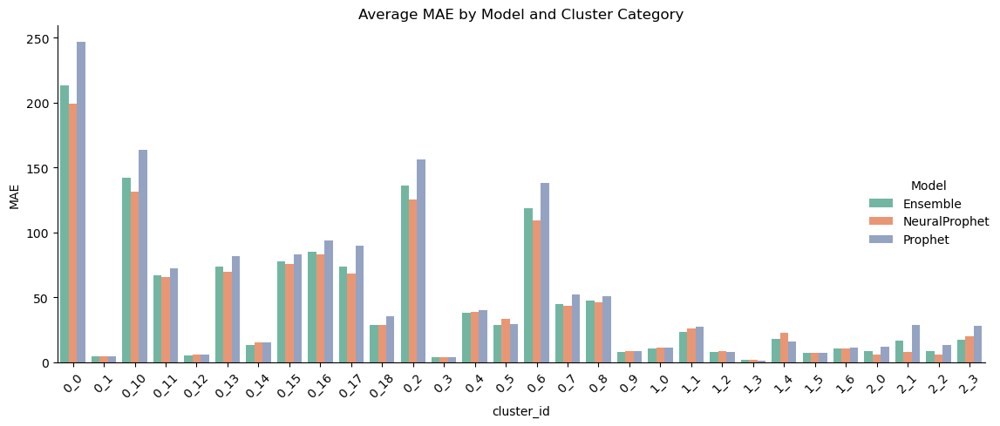

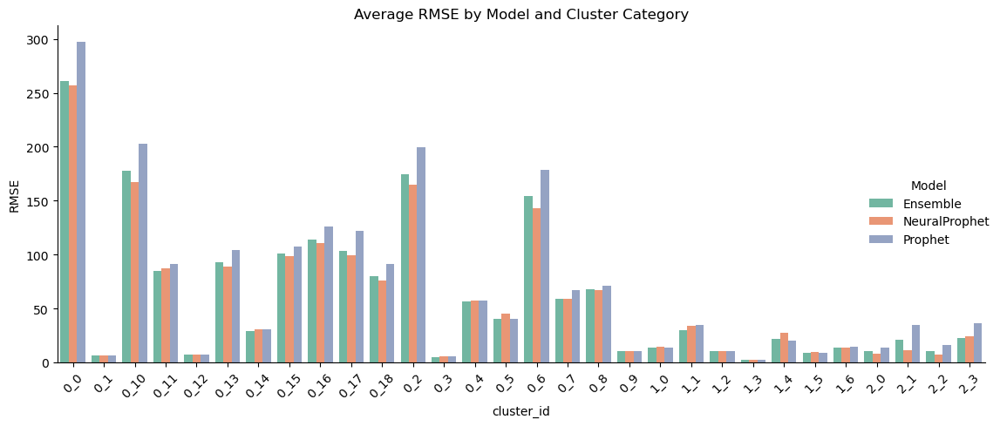

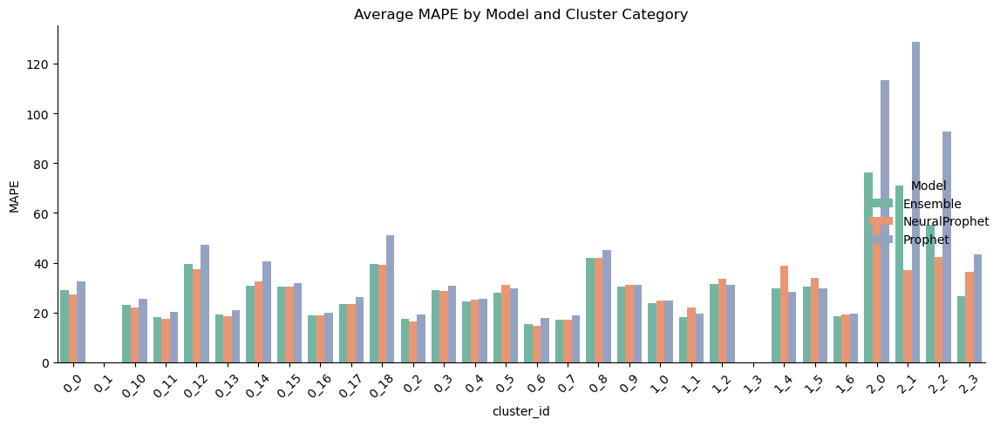

In [90]:
for metric in ['MAE', 'RMSE','MAPE']:
    g = sns.catplot(
        x='cluster_id', 
        y=metric, 
        hue='Model', 
        data=avg_metrics_df, 
        kind='bar', 
        height=5, 
        aspect=2, 
        palette='Set2'
    )
    plt.title(f'Average {metric} by Model and Cluster Category')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


Digging deeper into the models' performance, the variance between the actual numbers and the predictions was examined. Despite it being a bit unconventional, the variances for supply and demand were averaged to make comparison easier. This step was taken with care, making sure the comparison made sense by checking that the supply and demand variances were similar across clusters.

The analysis showed that the Neural Prophet tended to react more to changes in the data, trying its best to capture as much of the ups and downs as possible. On the other hand, the Prophet model sometimes ended up predicting wider swings than what actually happened. This behavior could be why mixing the two models together—using the ensemble method—helped fine-tune the forecasts, potentially making them more accurate for noisy datasets. 

In [91]:
# Calculating the variance for the fitted data of each model and the actual data
prophet_variance = prophet_fitted_df[['cluster_id','target','yhat']].groupby(['cluster_id','target'])['yhat'].var(ddof=1).reset_index(name='prophet_variance')
neuralprophet_variance = neuralprophet_fitted_df[['cluster_id','target','yhat']].groupby(['cluster_id','target'])['yhat'].var(ddof=1).reset_index(name='neuralprophet_variance')
ensemble_variance = ensemble_fitted_df[['cluster_id','target','yhat']].groupby(['cluster_id','target'])['yhat'].var(ddof=1).reset_index(name='ensemble_variance')
df_variance_demand = df[['cluster_id','demand','supply']].groupby(['cluster_id'])['demand'].var(ddof=1).reset_index(name='actual_variance')
df_variance_demand['target'] = 'demand'
df_variance_supply = df[['cluster_id','demand','supply']].groupby(['cluster_id'])['supply'].var(ddof=1).reset_index(name='actual_variance')
df_variance_supply['target'] = 'supply'
df_variance = pd.concat([df_variance_demand,df_variance_supply]).sort_values(by='cluster_id').reset_index(drop=True)
merged_variance = pd.merge(prophet_variance, neuralprophet_variance, on=['cluster_id', 'target'])
merged_variance = pd.merge(merged_variance, ensemble_variance, on=['cluster_id', 'target'])
models_variance_df = pd.merge(merged_variance, df_variance, on=['cluster_id', 'target'])

# Scaling the variance for each model and the actual data

columns_to_scale = ['prophet_variance', 'neuralprophet_variance', 'ensemble_variance', 'actual_variance']
scaler = MinMaxScaler()
models_variance_df_scaled = models_variance_df.copy()  
for column in columns_to_scale:
    models_variance_df_scaled[column] = scaler.fit_transform(models_variance_df[[column]])

# Taking the average of supply and demand variance for visualization purposes only. 

avg_variance_df = models_variance_df_scaled.groupby(['cluster_id']).agg({
    'prophet_variance': 'mean',
    'neuralprophet_variance': 'mean',
    'ensemble_variance': 'mean',
    'actual_variance': 'mean'
}).reset_index()

# Converting the variance dataframe to a format compatible with metrics' dataframe

avg_variance_df = avg_variance_df.melt(id_vars=['cluster_id'], 
                                           value_vars=['prophet_variance', 'neuralprophet_variance', 'ensemble_variance', 'actual_variance'],
                                           var_name='Model', value_name='variance')

# Replace column names in 'Model' to more readable ones if necessary
avg_variance_df['Model'] = avg_variance_df['Model'].replace({
    'prophet_variance': 'Prophet',
    'neuralprophet_variance': 'Neural Prophet',
    'ensemble_variance': 'Ensemble',
    'actual_variance': 'Actual'
})

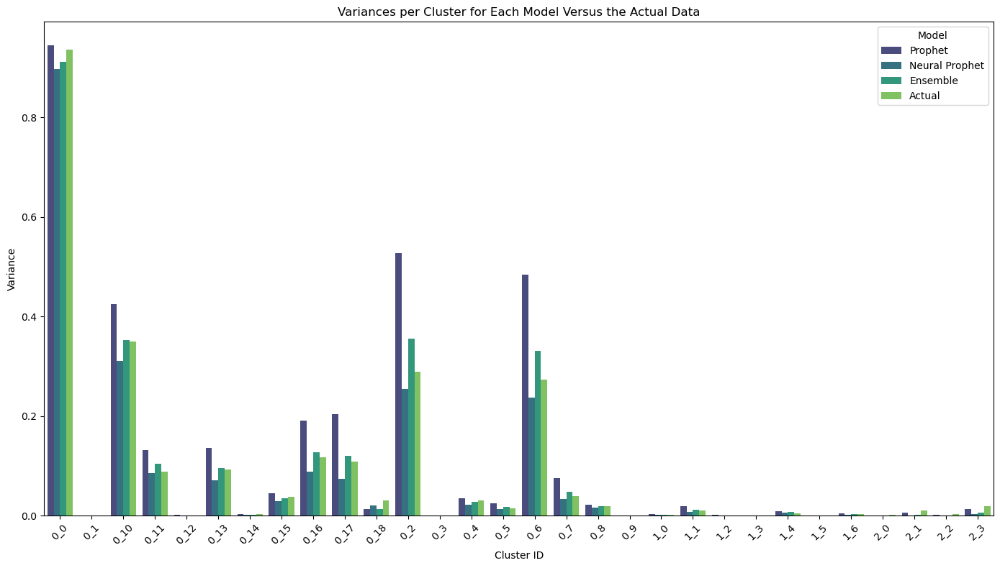

In [92]:
plt.figure(figsize=(14, 8)) 
sns.barplot(data=avg_variance_df, x='cluster_id', y='variance', hue='Model', palette='viridis')

plt.title('Variances per Cluster for Each Model Versus the Actual Data')
plt.xlabel('Cluster ID')
plt.ylabel('Variance')
plt.xticks(rotation=45)  
plt.legend(title='Model')

plt.tight_layout()
plt.show()